In [1]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd # this module is useful to work with tabular data
import random # this module will be used to select random samples from a collection
import os # this module will be used just to create directories in the local filesystem
from tqdm import tqdm # this module is useful to plot progress bars

import torch
import torchvision
from torchvision import transforms
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import train_test_split

# Dataset

In [2]:
train_dataset = torchvision.datasets.FashionMNIST('classifier_data', train=True, download=True)
test_dataset  = torchvision.datasets.FashionMNIST('classifier_data', train=False, download=True)

100%|██████████████████████████████████████| 26.4M/26.4M [00:05<00:00, 5.11MB/s]
100%|██████████████████████████████████████| 29.5k/29.5k [00:00<00:00, 1.31MB/s]
100%|██████████████████████████████████████| 4.42M/4.42M [00:00<00:00, 17.0MB/s]
100%|██████████████████████████████████████| 5.15k/5.15k [00:00<00:00, 7.05MB/s]


In [3]:
# Dictionary containing the mapping from label name to ID
label_to_id = {
  'T-shirt/top': 0,
  'Trouser': 1,
  'Pullover': 2,
  'Dress': 3,
  'Coat': 4,
  'Sandal': 5,
  'Shirt': 6,
  'Sneaker': 7,
  'Bag': 8,
  'Ankle boot': 9,
}
# Dictionary containing the mapping from ID to label name
id_to_label = {id: label for label, id in label_to_id.items()}

print('label_to_id =', label_to_id)
print('id_to_label =', id_to_label)

label_to_id = {'T-shirt/top': 0, 'Trouser': 1, 'Pullover': 2, 'Dress': 3, 'Coat': 4, 'Sandal': 5, 'Shirt': 6, 'Sneaker': 7, 'Bag': 8, 'Ankle boot': 9}
id_to_label = {0: 'T-shirt/top', 1: 'Trouser', 2: 'Pullover', 3: 'Dress', 4: 'Coat', 5: 'Sandal', 6: 'Shirt', 7: 'Sneaker', 8: 'Bag', 9: 'Ankle boot'}


### Transformations 

In [4]:
# Set the train transform
train_trans = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean = 0.2859, std = 0.3530),
        ])

# Set the test transform
test_trans = transforms.Compose([transforms.ToTensor(),
                                 transforms.Normalize(mean = 0.2859, std = 0.3530)]) #mean and std have to be sequences (e.g., tuples), 
                                                                      # therefore we should add a comma after the values

In [5]:
#Set the transformations
train_dataset.transform = train_trans
test_dataset.transform = test_trans

In [6]:
### Define train dataloader
train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True)
### Define test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=256, shuffle=False)


batch_data, batch_labels = next(iter(train_dataloader))   #next sample in the iterable object train_dataloader
print(f"TRAIN BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_dataloader))
print(f"TEST BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

TRAIN BATCH SHAPE
	 Data: torch.Size([256, 1, 28, 28])
	 Labels: torch.Size([256])
TEST BATCH SHAPE
	 Data: torch.Size([256, 1, 28, 28])
	 Labels: torch.Size([256])


# Training & Testins functions

In [7]:
### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer, classification=False):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    conc_out = []
    conc_label = []
    correct = 0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, label_batch in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)

        # Encode data
        encoded_data = encoder(image_batch)

        if classification:
          loss = loss_fn(encoded_data, label_batch)
          pred = encoded_data.max(1, keepdim=True)[1] # get the index of the max logit
          correct += pred.eq(label_batch.view_as(pred)).sum().item()
        else :
        # Decode data
          decoded_data = decoder(encoded_data)
          conc_out.append(decoded_data.cpu())
        # Evaluate loss
          loss = loss_fn(decoded_data, image_batch)
          
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

      # Append the network output and the original image to the lists
        conc_label.append(image_batch.cpu())

    if classification:
      tot_images = len(train_dataset)
      accuracy = 100. * correct / tot_images
      print(f'Accuracy: {correct}/{tot_images}: {accuracy}%')
      return accuracy
    
  # Create a single tensor with all the values in the lists
    conc_out = torch.cat(conc_out)
    conc_label = torch.cat(conc_label) 
  # Evaluate global loss
    train_loss = loss_fn(conc_out, conc_label)

    return train_loss.data

In [8]:
### Testing function
def test_epoch(encoder, decoder, device, dataloader, loss_fn, classification=False, validation=False):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        correct = 0
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            if classification:
              pred = encoded_data.max(1, keepdim=True)[1] # get the index of the max logit
              correct += pred.eq(label_batch.view_as(pred)).sum().item()
            else:
            # Decode data
              decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
              conc_out.append(decoded_data.cpu())
              conc_label.append(image_batch.cpu())
        
        if validation:
          dataset = val_dataset
        else:
          dataset = test_dataset

        if classification:
          tot_images = len(dataset)
          accuracy = 100. * correct / tot_images
          print(f'Accuracy: {correct}/{tot_images}: {accuracy}%')
          return accuracy
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        loss = loss_fn(conc_out, conc_label)

          
    return loss.data

# Autoencoder

## Encoder

In [9]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            # First convolutional layer
            nn.Conv2d(in_channels=1, out_channels=8, kernel_size=3, 
                      stride=2, padding=1),
            nn.ReLU(True),
            # Second convolutional layer
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3, 
                      stride=2, padding=1),
            nn.ReLU(True),
            # Third convolutional layer
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, 
                      stride=2, padding=0),
            nn.ReLU(True)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)

        ### Linear section
        self.encoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(in_features=32*3*3, out_features=encoded_space_dim)
        )
        
    def forward(self, x):
        # Apply convolutions
        x = self.encoder_cnn(x)
        # Flatten
        x = self.flatten(x)
        # # Apply linear layers
        x = self.encoder_lin(x)
        return x

## Decoder

In [10]:
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()

        ### Linear section
        self.decoder_lin = nn.Sequential(
            # First linear layer
            nn.Linear(in_features=encoded_space_dim, out_features=32*3*3),
            nn.ReLU(True)
        )

        ### Unflatten
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        ### Convolutional section
        self.decoder_conv = nn.Sequential(
            # First transposed convolution
            nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=3, 
                               stride=2, output_padding=0),
            nn.ReLU(True),
            # Second transposed convolution
            nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            # Third transposed convolution
            nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
        )
        
    def forward(self, x):
        # Apply linear layers
        x = self.decoder_lin(x)
        # Unflatten
        x = self.unflatten(x)
        # Apply transposed convolutions
        x = self.decoder_conv(x)
        # Apply a sigmoid to force the output to be between 0 and 1 (valid pixel values)
        x = torch.sigmoid(x)
        return x

Initialize the two networks.

In [11]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
encoded_space_dim = 128
encoder = Encoder(encoded_space_dim=encoded_space_dim)
decoder = Decoder(encoded_space_dim=encoded_space_dim)
print(encoder)
print(decoder)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
  )
)
Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=128, out_features=288, bias=True)
    (1): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), paddin

Let's check if all the shapes are correct.

In [12]:
### Some examples
# Take an input image (remember to add the batch dimension)
img, _ = test_dataset[0]
img = img.unsqueeze(0) # Add the batch dimension in the first axis
print('Original image shape:', img.shape)
# Encode the image
img_enc = encoder(img)
print('Encoded image shape:', img_enc.shape)
# Decode the image
dec_img = decoder(img_enc)
print('Decoded image shape:', dec_img.shape)

Original image shape: torch.Size([1, 1, 28, 28])
Encoded image shape: torch.Size([1, 128])
Decoded image shape: torch.Size([1, 1, 28, 28])


## Autoencoder with ONE Linear layer

In [13]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 1e-3 # Learning rate
params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=lr)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)

Selected device: cpu


Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=128, out_features=288, bias=True)
    (1): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

EPOCH 1/100
	 TRAINING - EPOCH 1/100 - loss: 0.502112
	 TEST- EPOCH 1/100 - loss: 0.498009


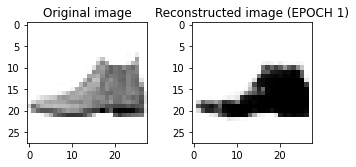

EPOCH 2/100
	 TRAINING - EPOCH 2/100 - loss: 0.497464
	 TEST- EPOCH 2/100 - loss: 0.494175


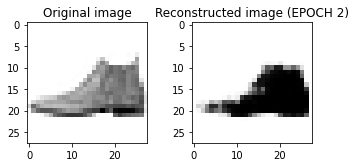

EPOCH 3/100
	 TRAINING - EPOCH 3/100 - loss: 0.494109
	 TEST- EPOCH 3/100 - loss: 0.491085


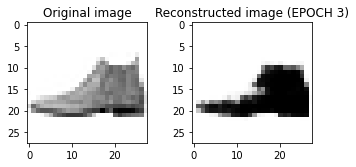

EPOCH 4/100
	 TRAINING - EPOCH 4/100 - loss: 0.491320
	 TEST- EPOCH 4/100 - loss: 0.488509


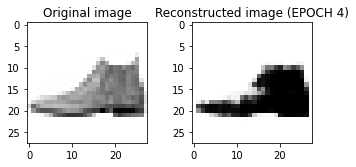

EPOCH 5/100
	 TRAINING - EPOCH 5/100 - loss: 0.488979
	 TEST- EPOCH 5/100 - loss: 0.486512


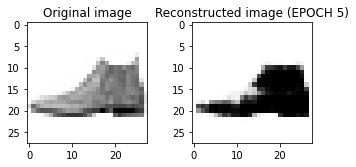

EPOCH 6/100
	 TRAINING - EPOCH 6/100 - loss: 0.486965
	 TEST- EPOCH 6/100 - loss: 0.484332


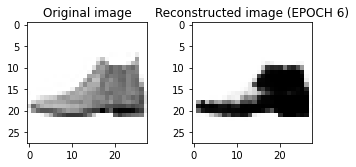

EPOCH 7/100
	 TRAINING - EPOCH 7/100 - loss: 0.485184
	 TEST- EPOCH 7/100 - loss: 0.482902


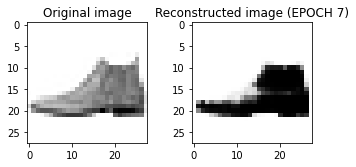

EPOCH 8/100
	 TRAINING - EPOCH 8/100 - loss: 0.483553
	 TEST- EPOCH 8/100 - loss: 0.481174


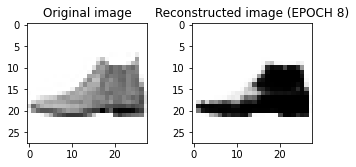

EPOCH 9/100
	 TRAINING - EPOCH 9/100 - loss: 0.482157
	 TEST- EPOCH 9/100 - loss: 0.479780


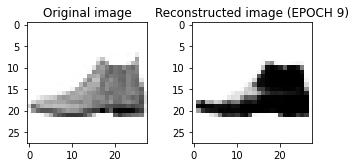

EPOCH 10/100
	 TRAINING - EPOCH 10/100 - loss: 0.480909
	 TEST- EPOCH 10/100 - loss: 0.478971


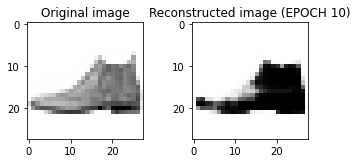

EPOCH 11/100
	 TRAINING - EPOCH 11/100 - loss: 0.479820
	 TEST- EPOCH 11/100 - loss: 0.477715


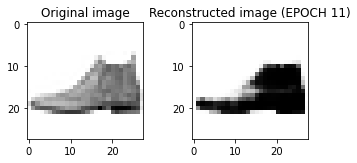

EPOCH 12/100
	 TRAINING - EPOCH 12/100 - loss: 0.478737
	 TEST- EPOCH 12/100 - loss: 0.476877


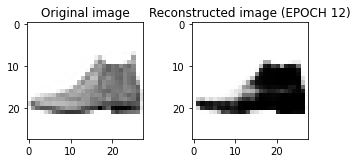

EPOCH 13/100
	 TRAINING - EPOCH 13/100 - loss: 0.477834
	 TEST- EPOCH 13/100 - loss: 0.475895


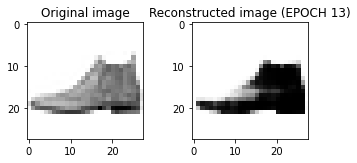

EPOCH 14/100
	 TRAINING - EPOCH 14/100 - loss: 0.476980
	 TEST- EPOCH 14/100 - loss: 0.475179


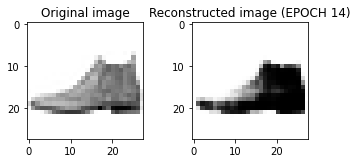

EPOCH 15/100
	 TRAINING - EPOCH 15/100 - loss: 0.476200
	 TEST- EPOCH 15/100 - loss: 0.474271


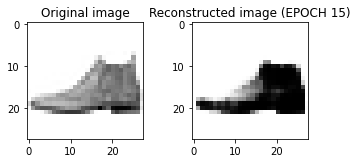

EPOCH 16/100
	 TRAINING - EPOCH 16/100 - loss: 0.475446
	 TEST- EPOCH 16/100 - loss: 0.473541


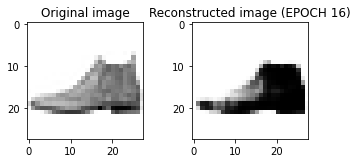

EPOCH 17/100
	 TRAINING - EPOCH 17/100 - loss: 0.474744
	 TEST- EPOCH 17/100 - loss: 0.472760


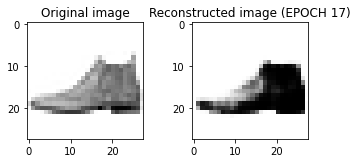

EPOCH 18/100
	 TRAINING - EPOCH 18/100 - loss: 0.474066
	 TEST- EPOCH 18/100 - loss: 0.472295


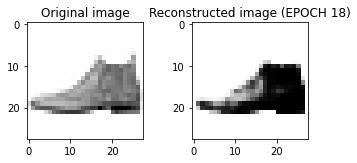

EPOCH 19/100
	 TRAINING - EPOCH 19/100 - loss: 0.473433
	 TEST- EPOCH 19/100 - loss: 0.471513


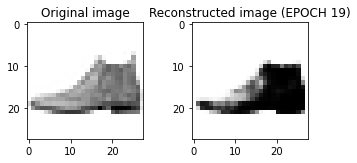

EPOCH 20/100
	 TRAINING - EPOCH 20/100 - loss: 0.472789
	 TEST- EPOCH 20/100 - loss: 0.471040


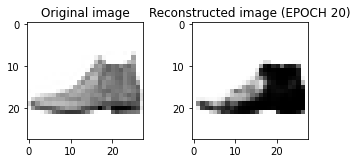

EPOCH 21/100
	 TRAINING - EPOCH 21/100 - loss: 0.472228
	 TEST- EPOCH 21/100 - loss: 0.470255


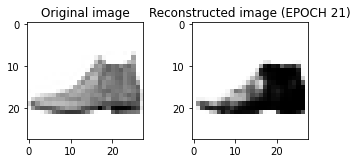

EPOCH 22/100
	 TRAINING - EPOCH 22/100 - loss: 0.471683
	 TEST- EPOCH 22/100 - loss: 0.469869


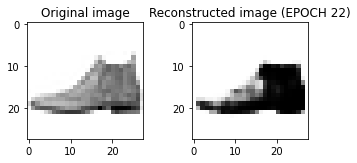

EPOCH 23/100
	 TRAINING - EPOCH 23/100 - loss: 0.471158
	 TEST- EPOCH 23/100 - loss: 0.469384


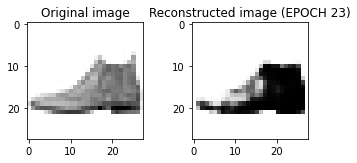

EPOCH 24/100
	 TRAINING - EPOCH 24/100 - loss: 0.470636
	 TEST- EPOCH 24/100 - loss: 0.468947


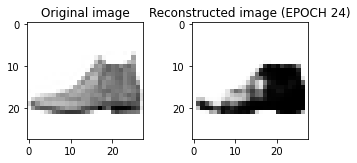

EPOCH 25/100
	 TRAINING - EPOCH 25/100 - loss: 0.470157
	 TEST- EPOCH 25/100 - loss: 0.468326


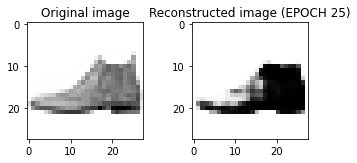

EPOCH 26/100
	 TRAINING - EPOCH 26/100 - loss: 0.469687
	 TEST- EPOCH 26/100 - loss: 0.467937


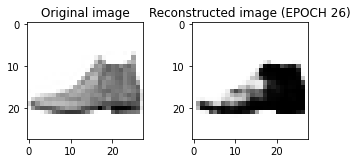

EPOCH 27/100
	 TRAINING - EPOCH 27/100 - loss: 0.469280
	 TEST- EPOCH 27/100 - loss: 0.467517


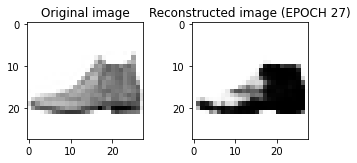

EPOCH 28/100
	 TRAINING - EPOCH 28/100 - loss: 0.468886
	 TEST- EPOCH 28/100 - loss: 0.467089


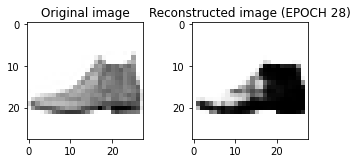

EPOCH 29/100
	 TRAINING - EPOCH 29/100 - loss: 0.468431
	 TEST- EPOCH 29/100 - loss: 0.466738


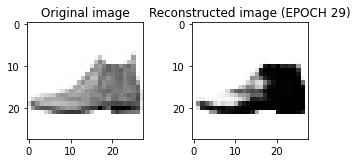

EPOCH 30/100
	 TRAINING - EPOCH 30/100 - loss: 0.468046
	 TEST- EPOCH 30/100 - loss: 0.466312


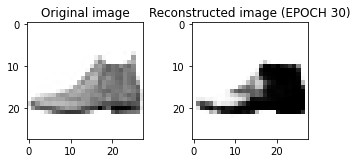

EPOCH 31/100
	 TRAINING - EPOCH 31/100 - loss: 0.467674
	 TEST- EPOCH 31/100 - loss: 0.465850


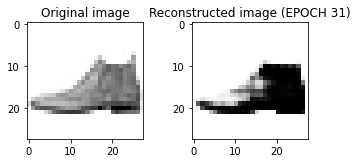

EPOCH 32/100
	 TRAINING - EPOCH 32/100 - loss: 0.467288
	 TEST- EPOCH 32/100 - loss: 0.465680


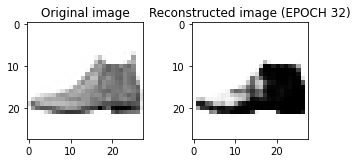

EPOCH 33/100
	 TRAINING - EPOCH 33/100 - loss: 0.466906
	 TEST- EPOCH 33/100 - loss: 0.465074


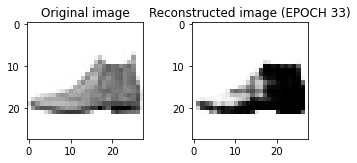

EPOCH 34/100
	 TRAINING - EPOCH 34/100 - loss: 0.466546
	 TEST- EPOCH 34/100 - loss: 0.464784


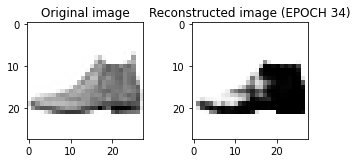

EPOCH 35/100
	 TRAINING - EPOCH 35/100 - loss: 0.466227
	 TEST- EPOCH 35/100 - loss: 0.464700


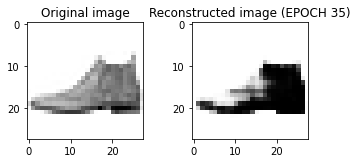

EPOCH 36/100
	 TRAINING - EPOCH 36/100 - loss: 0.465855
	 TEST- EPOCH 36/100 - loss: 0.464037


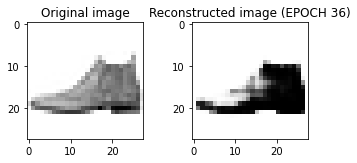

EPOCH 37/100
	 TRAINING - EPOCH 37/100 - loss: 0.465573
	 TEST- EPOCH 37/100 - loss: 0.463996


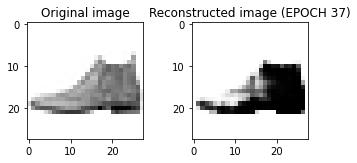

EPOCH 38/100
	 TRAINING - EPOCH 38/100 - loss: 0.465292
	 TEST- EPOCH 38/100 - loss: 0.463627


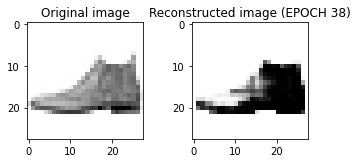

EPOCH 39/100
	 TRAINING - EPOCH 39/100 - loss: 0.464974
	 TEST- EPOCH 39/100 - loss: 0.463518


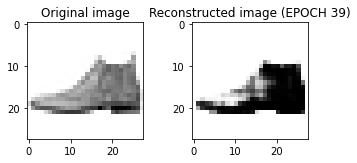

EPOCH 40/100
	 TRAINING - EPOCH 40/100 - loss: 0.464672
	 TEST- EPOCH 40/100 - loss: 0.463040


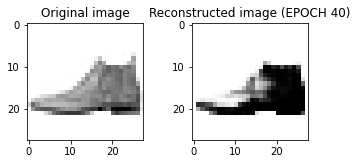

EPOCH 41/100
	 TRAINING - EPOCH 41/100 - loss: 0.464436
	 TEST- EPOCH 41/100 - loss: 0.462733


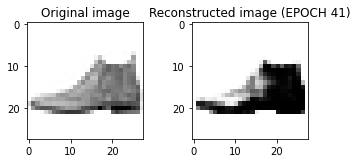

EPOCH 42/100
	 TRAINING - EPOCH 42/100 - loss: 0.464165
	 TEST- EPOCH 42/100 - loss: 0.462517


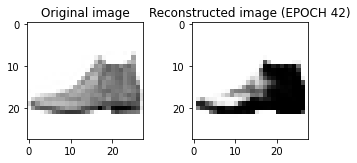

EPOCH 43/100
	 TRAINING - EPOCH 43/100 - loss: 0.463912
	 TEST- EPOCH 43/100 - loss: 0.462318


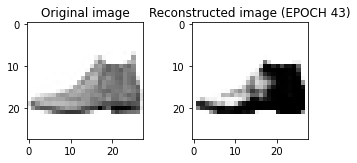

EPOCH 44/100
	 TRAINING - EPOCH 44/100 - loss: 0.463651
	 TEST- EPOCH 44/100 - loss: 0.461913


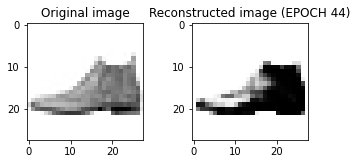

EPOCH 45/100
	 TRAINING - EPOCH 45/100 - loss: 0.463416
	 TEST- EPOCH 45/100 - loss: 0.461834


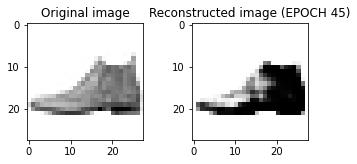

EPOCH 46/100
	 TRAINING - EPOCH 46/100 - loss: 0.463190
	 TEST- EPOCH 46/100 - loss: 0.461717


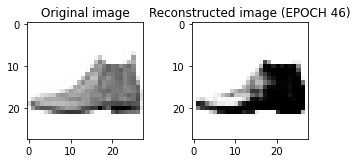

EPOCH 47/100
	 TRAINING - EPOCH 47/100 - loss: 0.462992
	 TEST- EPOCH 47/100 - loss: 0.461537


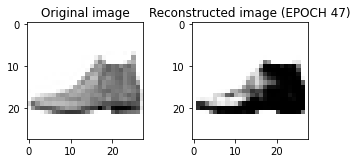

EPOCH 48/100
	 TRAINING - EPOCH 48/100 - loss: 0.462741
	 TEST- EPOCH 48/100 - loss: 0.461231


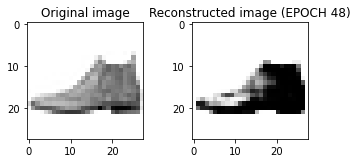

EPOCH 49/100
	 TRAINING - EPOCH 49/100 - loss: 0.462526
	 TEST- EPOCH 49/100 - loss: 0.461078


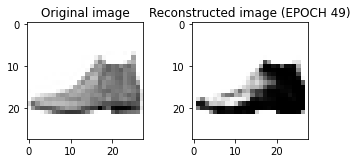

EPOCH 50/100
	 TRAINING - EPOCH 50/100 - loss: 0.462301
	 TEST- EPOCH 50/100 - loss: 0.460842


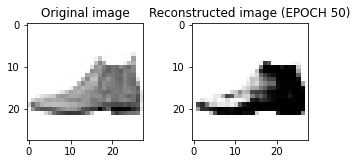

EPOCH 51/100
	 TRAINING - EPOCH 51/100 - loss: 0.462115
	 TEST- EPOCH 51/100 - loss: 0.460740


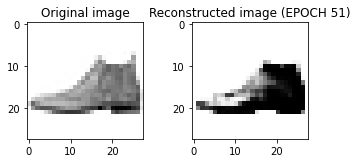

EPOCH 52/100
	 TRAINING - EPOCH 52/100 - loss: 0.461917
	 TEST- EPOCH 52/100 - loss: 0.460296


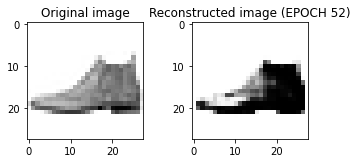

EPOCH 53/100
	 TRAINING - EPOCH 53/100 - loss: 0.461713
	 TEST- EPOCH 53/100 - loss: 0.460199


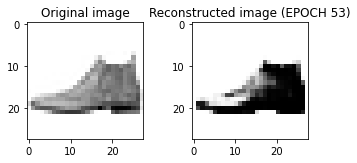

EPOCH 54/100
	 TRAINING - EPOCH 54/100 - loss: 0.461516
	 TEST- EPOCH 54/100 - loss: 0.459881


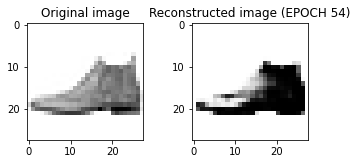

EPOCH 55/100
	 TRAINING - EPOCH 55/100 - loss: 0.461325
	 TEST- EPOCH 55/100 - loss: 0.459716


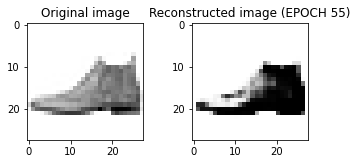

EPOCH 56/100
	 TRAINING - EPOCH 56/100 - loss: 0.461155
	 TEST- EPOCH 56/100 - loss: 0.459605


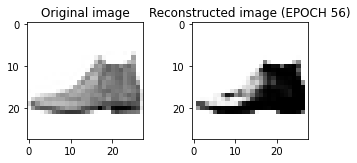

EPOCH 57/100
	 TRAINING - EPOCH 57/100 - loss: 0.460989
	 TEST- EPOCH 57/100 - loss: 0.459361


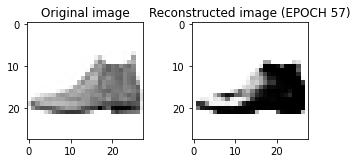

EPOCH 58/100
	 TRAINING - EPOCH 58/100 - loss: 0.460839
	 TEST- EPOCH 58/100 - loss: 0.459229


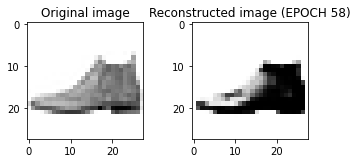

EPOCH 59/100
	 TRAINING - EPOCH 59/100 - loss: 0.460644
	 TEST- EPOCH 59/100 - loss: 0.458959


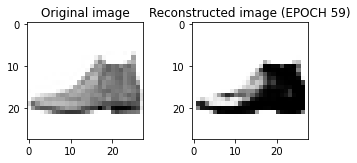

EPOCH 60/100
	 TRAINING - EPOCH 60/100 - loss: 0.460510
	 TEST- EPOCH 60/100 - loss: 0.458957


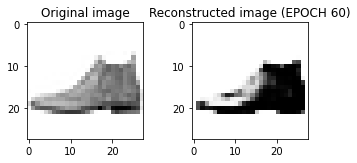

EPOCH 61/100
	 TRAINING - EPOCH 61/100 - loss: 0.460355
	 TEST- EPOCH 61/100 - loss: 0.458920


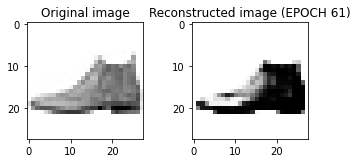

EPOCH 62/100
	 TRAINING - EPOCH 62/100 - loss: 0.460205
	 TEST- EPOCH 62/100 - loss: 0.458536


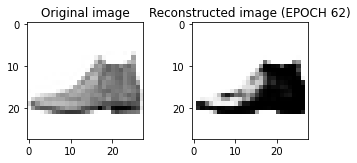

EPOCH 63/100
	 TRAINING - EPOCH 63/100 - loss: 0.460095
	 TEST- EPOCH 63/100 - loss: 0.458550


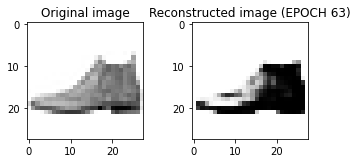

EPOCH 64/100
	 TRAINING - EPOCH 64/100 - loss: 0.459947
	 TEST- EPOCH 64/100 - loss: 0.458393


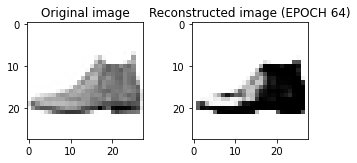

EPOCH 65/100
	 TRAINING - EPOCH 65/100 - loss: 0.459828
	 TEST- EPOCH 65/100 - loss: 0.458303


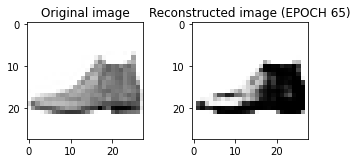

EPOCH 66/100
	 TRAINING - EPOCH 66/100 - loss: 0.459698
	 TEST- EPOCH 66/100 - loss: 0.458019


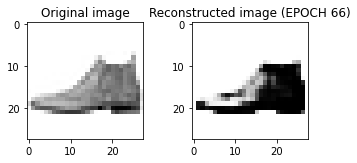

EPOCH 67/100
	 TRAINING - EPOCH 67/100 - loss: 0.459573
	 TEST- EPOCH 67/100 - loss: 0.458091


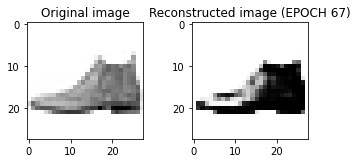

EPOCH 68/100
	 TRAINING - EPOCH 68/100 - loss: 0.459465
	 TEST- EPOCH 68/100 - loss: 0.457898


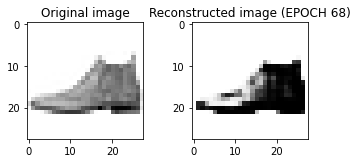

EPOCH 69/100
	 TRAINING - EPOCH 69/100 - loss: 0.459346
	 TEST- EPOCH 69/100 - loss: 0.457774


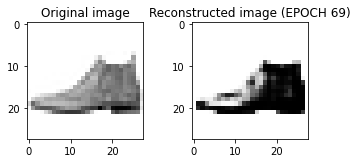

EPOCH 70/100
	 TRAINING - EPOCH 70/100 - loss: 0.459209
	 TEST- EPOCH 70/100 - loss: 0.457578


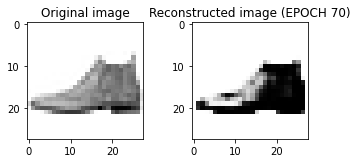

EPOCH 71/100
	 TRAINING - EPOCH 71/100 - loss: 0.459144
	 TEST- EPOCH 71/100 - loss: 0.457527


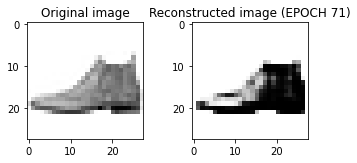

EPOCH 72/100
	 TRAINING - EPOCH 72/100 - loss: 0.459039
	 TEST- EPOCH 72/100 - loss: 0.457524


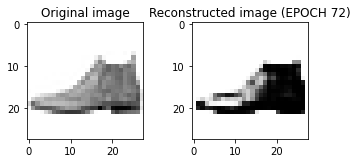

EPOCH 73/100
	 TRAINING - EPOCH 73/100 - loss: 0.458905
	 TEST- EPOCH 73/100 - loss: 0.457337


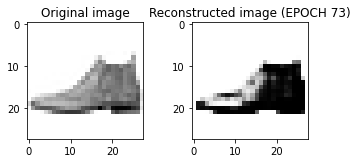

EPOCH 74/100
	 TRAINING - EPOCH 74/100 - loss: 0.458856
	 TEST- EPOCH 74/100 - loss: 0.457249


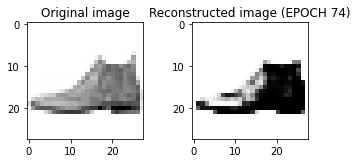

EPOCH 75/100
	 TRAINING - EPOCH 75/100 - loss: 0.458751
	 TEST- EPOCH 75/100 - loss: 0.457156


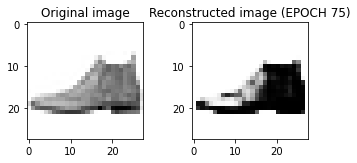

EPOCH 76/100
	 TRAINING - EPOCH 76/100 - loss: 0.458623
	 TEST- EPOCH 76/100 - loss: 0.457030


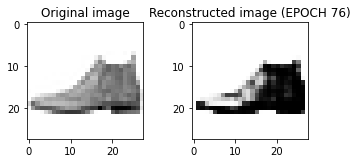

EPOCH 77/100
	 TRAINING - EPOCH 77/100 - loss: 0.458570
	 TEST- EPOCH 77/100 - loss: 0.456945


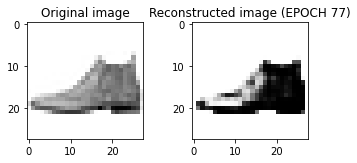

EPOCH 78/100
	 TRAINING - EPOCH 78/100 - loss: 0.458480
	 TEST- EPOCH 78/100 - loss: 0.456872


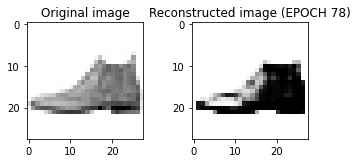

EPOCH 79/100
	 TRAINING - EPOCH 79/100 - loss: 0.458395
	 TEST- EPOCH 79/100 - loss: 0.456793


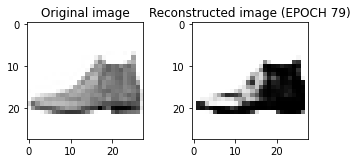

EPOCH 80/100
	 TRAINING - EPOCH 80/100 - loss: 0.458295
	 TEST- EPOCH 80/100 - loss: 0.456957


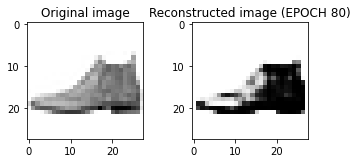

EPOCH 81/100
	 TRAINING - EPOCH 81/100 - loss: 0.458255
	 TEST- EPOCH 81/100 - loss: 0.456716


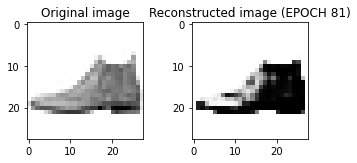

EPOCH 82/100
	 TRAINING - EPOCH 82/100 - loss: 0.458142
	 TEST- EPOCH 82/100 - loss: 0.456607


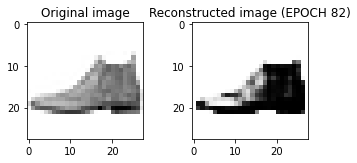

EPOCH 83/100
	 TRAINING - EPOCH 83/100 - loss: 0.458098
	 TEST- EPOCH 83/100 - loss: 0.456535


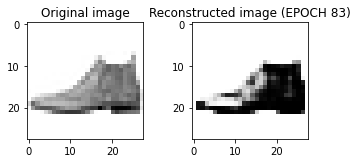

EPOCH 84/100
	 TRAINING - EPOCH 84/100 - loss: 0.458023
	 TEST- EPOCH 84/100 - loss: 0.456481


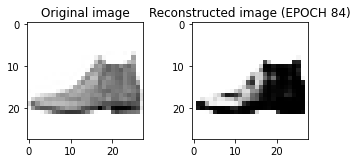

EPOCH 85/100
	 TRAINING - EPOCH 85/100 - loss: 0.457969
	 TEST- EPOCH 85/100 - loss: 0.456313


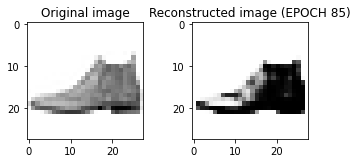

EPOCH 86/100
	 TRAINING - EPOCH 86/100 - loss: 0.457894
	 TEST- EPOCH 86/100 - loss: 0.456242


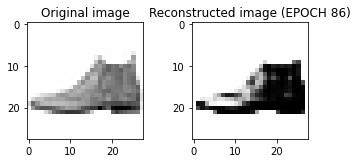

EPOCH 87/100
	 TRAINING - EPOCH 87/100 - loss: 0.457832
	 TEST- EPOCH 87/100 - loss: 0.456281


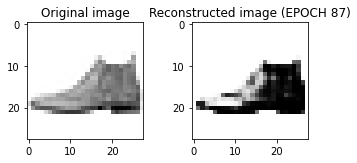

EPOCH 88/100
	 TRAINING - EPOCH 88/100 - loss: 0.457761
	 TEST- EPOCH 88/100 - loss: 0.456192


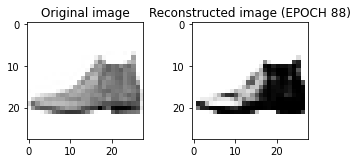

EPOCH 89/100
	 TRAINING - EPOCH 89/100 - loss: 0.457708
	 TEST- EPOCH 89/100 - loss: 0.456148


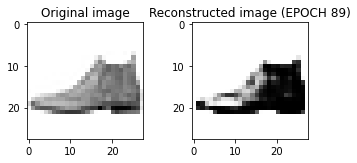

EPOCH 90/100
	 TRAINING - EPOCH 90/100 - loss: 0.457671
	 TEST- EPOCH 90/100 - loss: 0.456180


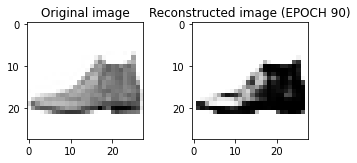

EPOCH 91/100
	 TRAINING - EPOCH 91/100 - loss: 0.457612
	 TEST- EPOCH 91/100 - loss: 0.456056


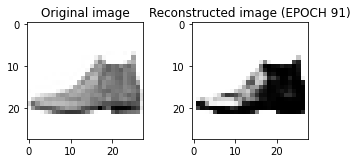

EPOCH 92/100
	 TRAINING - EPOCH 92/100 - loss: 0.457591
	 TEST- EPOCH 92/100 - loss: 0.456006


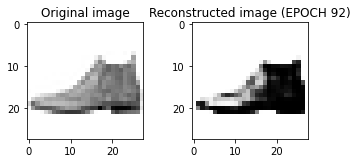

EPOCH 93/100
	 TRAINING - EPOCH 93/100 - loss: 0.457518
	 TEST- EPOCH 93/100 - loss: 0.455961


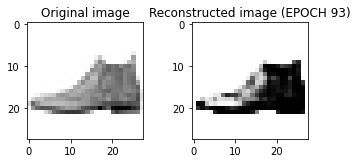

EPOCH 94/100
	 TRAINING - EPOCH 94/100 - loss: 0.457455
	 TEST- EPOCH 94/100 - loss: 0.455925


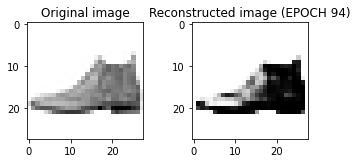

EPOCH 95/100
	 TRAINING - EPOCH 95/100 - loss: 0.457428
	 TEST- EPOCH 95/100 - loss: 0.455917


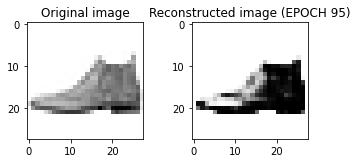

EPOCH 96/100
	 TRAINING - EPOCH 96/100 - loss: 0.457374
	 TEST- EPOCH 96/100 - loss: 0.456028


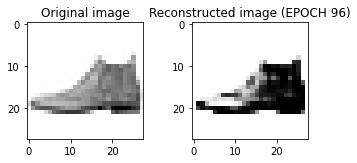

EPOCH 97/100
	 TRAINING - EPOCH 97/100 - loss: 0.457331
	 TEST- EPOCH 97/100 - loss: 0.455860


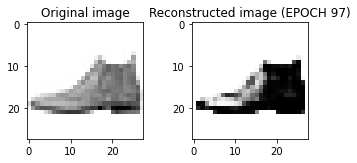

EPOCH 98/100
	 TRAINING - EPOCH 98/100 - loss: 0.457294
	 TEST- EPOCH 98/100 - loss: 0.455703


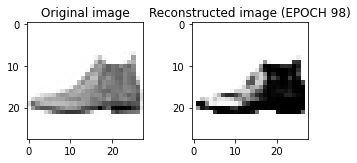

EPOCH 99/100
	 TRAINING - EPOCH 99/100 - loss: 0.457245
	 TEST- EPOCH 99/100 - loss: 0.455769


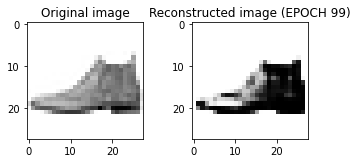

EPOCH 100/100
	 TRAINING - EPOCH 100/100 - loss: 0.457188
	 TEST- EPOCH 100/100 - loss: 0.455621


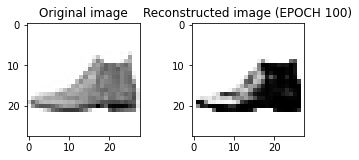

In [ ]:
### Training cycle
num_epochs = 100
train_loss_log = []
test_loss_log = []
for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_loss = train_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
    ### Test  (use the testing function)
    test_loss = test_epoch(
        encoder=encoder, 
        decoder=decoder, 
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn)
    # Print losses
    print('\t TRAINING - EPOCH %d/%d - loss: %f' % (epoch + 1, num_epochs, train_loss))
    print('\t TEST- EPOCH %d/%d - loss: %f' % (epoch + 1, num_epochs, test_loss))
    train_loss_log.append(train_loss)
    test_loss_log.append(test_loss)

    ### Plot progress
    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0).to(device)
    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))

    # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(5,5))
    axs[0].imshow(img.cpu().squeeze().numpy(), cmap='Greys')
    axs[0].set_title('Original image')
    axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='Greys')
    axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
    plt.tight_layout()
    plt.pause(0.1)

In [ ]:
# Save network parameters
torch.save(encoder.state_dict(), 'encoder_params128.pth')
torch.save(decoder.state_dict(), 'decoder_params128.pth')
### Save the optimizer state
torch.save(optim.state_dict(), 'optimizer_state128.torch')
# NOTE : Remember to save also the parameters of the optimizer if you want to restore and continue the training

## AutoEncoder with TWO fully connected layers

In [14]:
print('AutoEncoder with ONE hidden layer')
print(encoder)
print(decoder)

#Autoencoder with 2 linear layers
encoder2 = Encoder(encoded_space_dim=encoded_space_dim)
decoder2 = Decoder(encoded_space_dim=encoded_space_dim)
encoder2.encoder_lin = nn.Sequential(
                                  # First linear layer
                                  nn.Linear(in_features=32*3*3, out_features=256),
                                  nn.ReLU(False),
                                  # Second linear layer
                                  nn.Linear(in_features=256, out_features=encoded_space_dim)
                              )
decoder2.decoder_lin = nn.Sequential(
                                  # First linear layer
                                  nn.Linear(in_features=encoded_space_dim, out_features=256),
                                  nn.ReLU(False),
                                  # Second linear layer
                                  nn.Linear(in_features=256, out_features=32*3*3),    #288=32x3x3
                                  nn.ReLU(False)
                              )
print('AutoEncoder with TWO hidden layers')
print(encoder2)
print(decoder2)

AutoEncoder with ONE hidden layer
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
  )
)
Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=128, out_features=288, bias=True)
    (1): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_

In [15]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 1e-3 # Learning rate
weight_decay = 0
params_to_optimize = [
    {'params': encoder2.parameters()},
    {'params': decoder2.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=weight_decay)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder2.to(device)
decoder2.to(device)

Selected device: cpu


Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=128, out_features=256, bias=True)
    (1): ReLU()
    (2): Linear(in_features=256, out_features=288, bias=True)
    (3): ReLU()
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

EPOCH 1/100
	 TRAINING - EPOCH 1/100 - loss: 0.526741
	 TEST- EPOCH 1/100 - loss: 0.522964


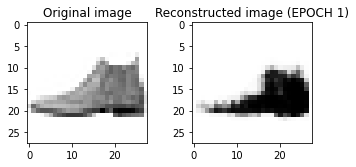

EPOCH 2/100
	 TRAINING - EPOCH 2/100 - loss: 0.522199
	 TEST- EPOCH 2/100 - loss: 0.518981


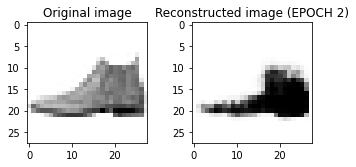

EPOCH 3/100
	 TRAINING - EPOCH 3/100 - loss: 0.518752
	 TEST- EPOCH 3/100 - loss: 0.516000


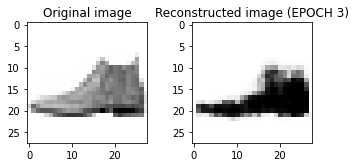

EPOCH 4/100
	 TRAINING - EPOCH 4/100 - loss: 0.515028
	 TEST- EPOCH 4/100 - loss: 0.511948


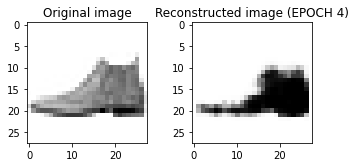

EPOCH 5/100
	 TRAINING - EPOCH 5/100 - loss: 0.512169
	 TEST- EPOCH 5/100 - loss: 0.509135


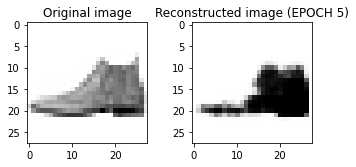

EPOCH 6/100
	 TRAINING - EPOCH 6/100 - loss: 0.509506
	 TEST- EPOCH 6/100 - loss: 0.506871


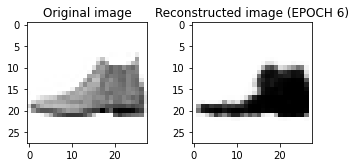

EPOCH 7/100
	 TRAINING - EPOCH 7/100 - loss: 0.506989
	 TEST- EPOCH 7/100 - loss: 0.504748


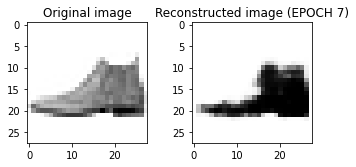

EPOCH 8/100
	 TRAINING - EPOCH 8/100 - loss: 0.505098
	 TEST- EPOCH 8/100 - loss: 0.503406


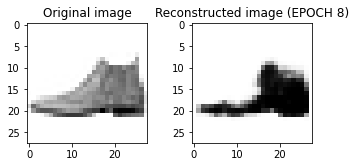

EPOCH 9/100
	 TRAINING - EPOCH 9/100 - loss: 0.503453
	 TEST- EPOCH 9/100 - loss: 0.501620


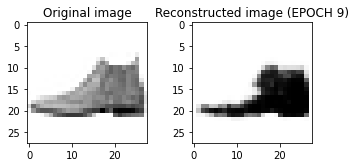

EPOCH 10/100
	 TRAINING - EPOCH 10/100 - loss: 0.501890
	 TEST- EPOCH 10/100 - loss: 0.500650


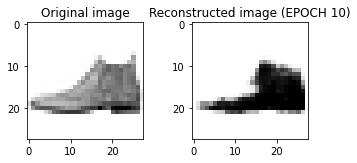

EPOCH 11/100
	 TRAINING - EPOCH 11/100 - loss: 0.500603
	 TEST- EPOCH 11/100 - loss: 0.498642


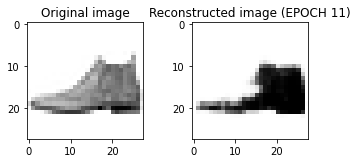

EPOCH 12/100
	 TRAINING - EPOCH 12/100 - loss: 0.499392
	 TEST- EPOCH 12/100 - loss: 0.497463


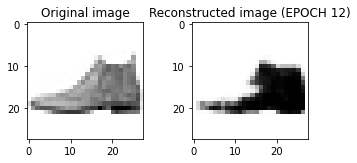

EPOCH 13/100
	 TRAINING - EPOCH 13/100 - loss: 0.498198
	 TEST- EPOCH 13/100 - loss: 0.496416


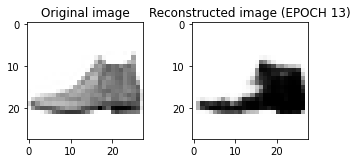

EPOCH 14/100
	 TRAINING - EPOCH 14/100 - loss: 0.497146
	 TEST- EPOCH 14/100 - loss: 0.496301


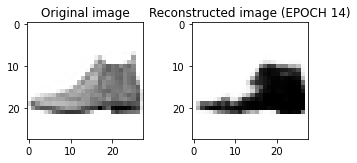

EPOCH 15/100
	 TRAINING - EPOCH 15/100 - loss: 0.496311
	 TEST- EPOCH 15/100 - loss: 0.494931


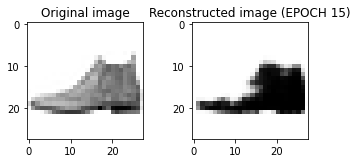

EPOCH 16/100
	 TRAINING - EPOCH 16/100 - loss: 0.495299
	 TEST- EPOCH 16/100 - loss: 0.493575


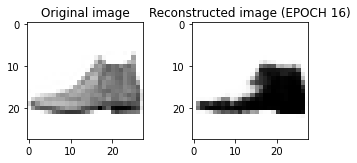

EPOCH 17/100
	 TRAINING - EPOCH 17/100 - loss: 0.494575
	 TEST- EPOCH 17/100 - loss: 0.492927


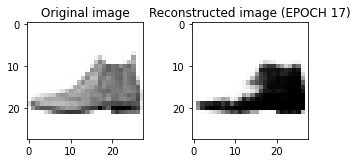

EPOCH 18/100
	 TRAINING - EPOCH 18/100 - loss: 0.493696
	 TEST- EPOCH 18/100 - loss: 0.492125


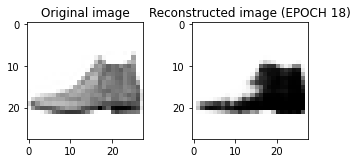

EPOCH 19/100
	 TRAINING - EPOCH 19/100 - loss: 0.493006
	 TEST- EPOCH 19/100 - loss: 0.491666


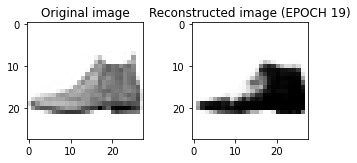

EPOCH 20/100
	 TRAINING - EPOCH 20/100 - loss: 0.492311
	 TEST- EPOCH 20/100 - loss: 0.491335


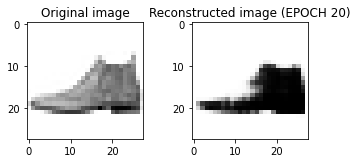

EPOCH 21/100
	 TRAINING - EPOCH 21/100 - loss: 0.491689
	 TEST- EPOCH 21/100 - loss: 0.491041


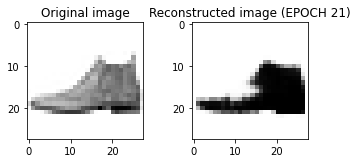

EPOCH 22/100
	 TRAINING - EPOCH 22/100 - loss: 0.491228
	 TEST- EPOCH 22/100 - loss: 0.489719


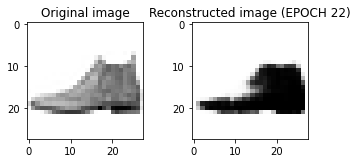

EPOCH 23/100
	 TRAINING - EPOCH 23/100 - loss: 0.490671
	 TEST- EPOCH 23/100 - loss: 0.489552


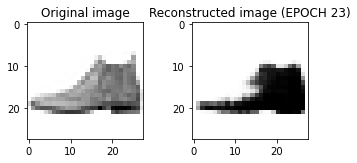

EPOCH 24/100
	 TRAINING - EPOCH 24/100 - loss: 0.490058
	 TEST- EPOCH 24/100 - loss: 0.489208


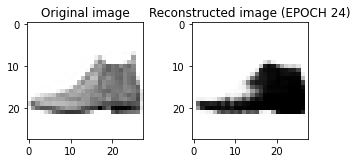

EPOCH 25/100
	 TRAINING - EPOCH 25/100 - loss: 0.489531
	 TEST- EPOCH 25/100 - loss: 0.488629


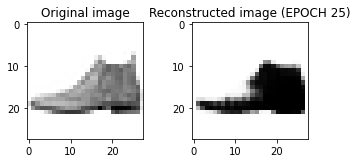

EPOCH 26/100
	 TRAINING - EPOCH 26/100 - loss: 0.489117
	 TEST- EPOCH 26/100 - loss: 0.487954


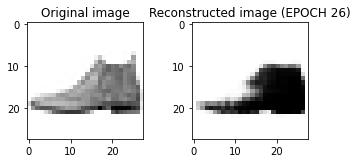

EPOCH 27/100
	 TRAINING - EPOCH 27/100 - loss: 0.488551
	 TEST- EPOCH 27/100 - loss: 0.487476


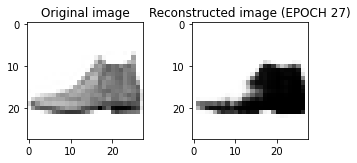

EPOCH 28/100
	 TRAINING - EPOCH 28/100 - loss: 0.488159
	 TEST- EPOCH 28/100 - loss: 0.487108


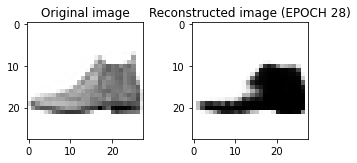

EPOCH 29/100
	 TRAINING - EPOCH 29/100 - loss: 0.487541
	 TEST- EPOCH 29/100 - loss: 0.487263


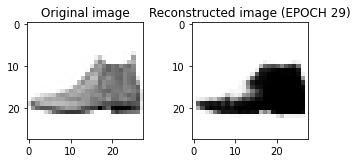

EPOCH 30/100
	 TRAINING - EPOCH 30/100 - loss: 0.487189
	 TEST- EPOCH 30/100 - loss: 0.486148


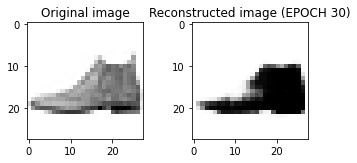

EPOCH 31/100
	 TRAINING - EPOCH 31/100 - loss: 0.486613
	 TEST- EPOCH 31/100 - loss: 0.485986


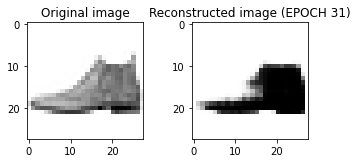

EPOCH 32/100
	 TRAINING - EPOCH 32/100 - loss: 0.486320
	 TEST- EPOCH 32/100 - loss: 0.485634


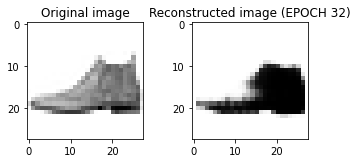

EPOCH 33/100
	 TRAINING - EPOCH 33/100 - loss: 0.485876
	 TEST- EPOCH 33/100 - loss: 0.484818


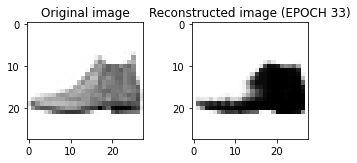

EPOCH 34/100
	 TRAINING - EPOCH 34/100 - loss: 0.485408
	 TEST- EPOCH 34/100 - loss: 0.484563


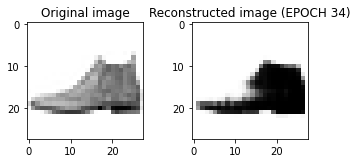

EPOCH 35/100
	 TRAINING - EPOCH 35/100 - loss: 0.485003
	 TEST- EPOCH 35/100 - loss: 0.484078


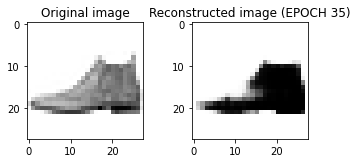

EPOCH 36/100
	 TRAINING - EPOCH 36/100 - loss: 0.484696
	 TEST- EPOCH 36/100 - loss: 0.483778


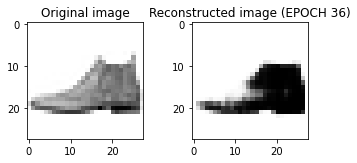

EPOCH 37/100
	 TRAINING - EPOCH 37/100 - loss: 0.484408
	 TEST- EPOCH 37/100 - loss: 0.483826


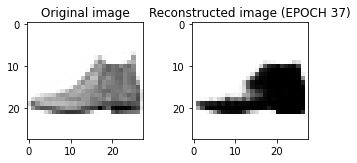

EPOCH 38/100
	 TRAINING - EPOCH 38/100 - loss: 0.483942
	 TEST- EPOCH 38/100 - loss: 0.483192


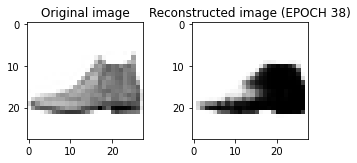

EPOCH 39/100
	 TRAINING - EPOCH 39/100 - loss: 0.483571
	 TEST- EPOCH 39/100 - loss: 0.482487


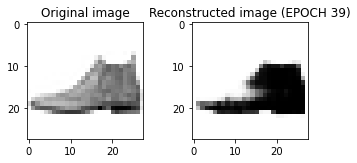

EPOCH 40/100
	 TRAINING - EPOCH 40/100 - loss: 0.483359
	 TEST- EPOCH 40/100 - loss: 0.482271


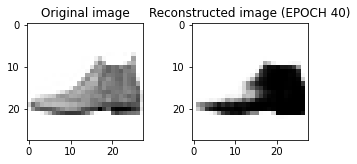

EPOCH 41/100
	 TRAINING - EPOCH 41/100 - loss: 0.483050
	 TEST- EPOCH 41/100 - loss: 0.482031


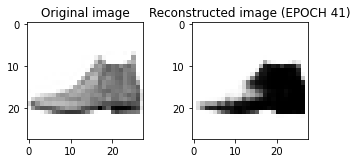

EPOCH 42/100
	 TRAINING - EPOCH 42/100 - loss: 0.482733
	 TEST- EPOCH 42/100 - loss: 0.481756


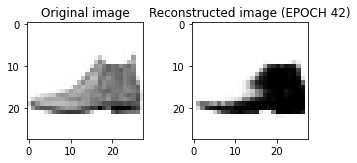

EPOCH 43/100
	 TRAINING - EPOCH 43/100 - loss: 0.482432
	 TEST- EPOCH 43/100 - loss: 0.482195


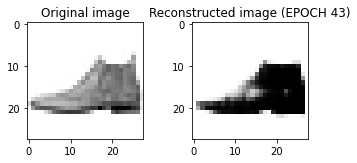

EPOCH 44/100
	 TRAINING - EPOCH 44/100 - loss: 0.482197
	 TEST- EPOCH 44/100 - loss: 0.481307


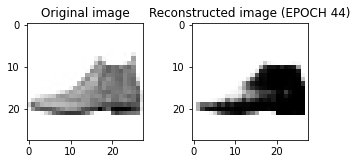

EPOCH 45/100
	 TRAINING - EPOCH 45/100 - loss: 0.481790
	 TEST- EPOCH 45/100 - loss: 0.481297


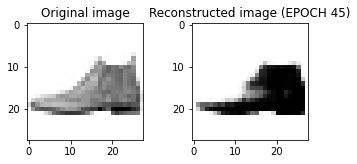

EPOCH 46/100
	 TRAINING - EPOCH 46/100 - loss: 0.481575
	 TEST- EPOCH 46/100 - loss: 0.480848


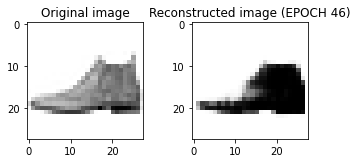

EPOCH 47/100
	 TRAINING - EPOCH 47/100 - loss: 0.481368
	 TEST- EPOCH 47/100 - loss: 0.480967


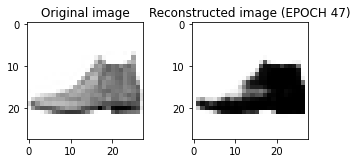

EPOCH 48/100
	 TRAINING - EPOCH 48/100 - loss: 0.481174
	 TEST- EPOCH 48/100 - loss: 0.480394


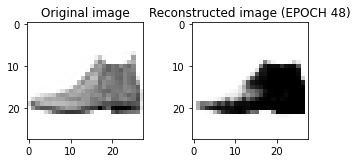

EPOCH 49/100
	 TRAINING - EPOCH 49/100 - loss: 0.480875
	 TEST- EPOCH 49/100 - loss: 0.479833


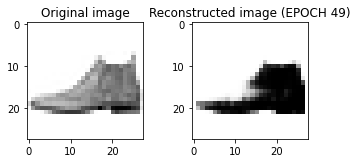

EPOCH 50/100
	 TRAINING - EPOCH 50/100 - loss: 0.480655
	 TEST- EPOCH 50/100 - loss: 0.480037


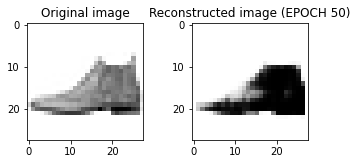

EPOCH 51/100
	 TRAINING - EPOCH 51/100 - loss: 0.480539
	 TEST- EPOCH 51/100 - loss: 0.479662


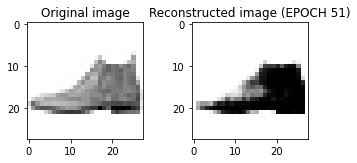

EPOCH 52/100
	 TRAINING - EPOCH 52/100 - loss: 0.480345
	 TEST- EPOCH 52/100 - loss: 0.479699


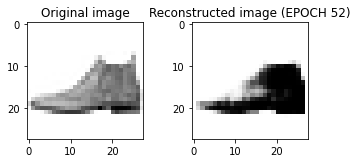

EPOCH 53/100
	 TRAINING - EPOCH 53/100 - loss: 0.480072
	 TEST- EPOCH 53/100 - loss: 0.479476


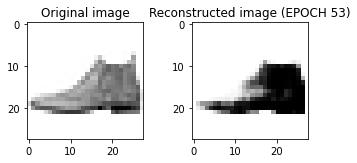

EPOCH 54/100
	 TRAINING - EPOCH 54/100 - loss: 0.479785
	 TEST- EPOCH 54/100 - loss: 0.478914


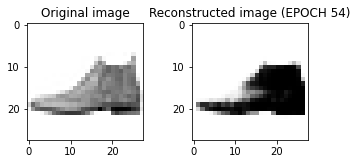

EPOCH 55/100
	 TRAINING - EPOCH 55/100 - loss: 0.479623
	 TEST- EPOCH 55/100 - loss: 0.478932


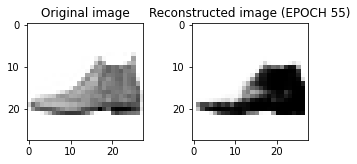

EPOCH 56/100
	 TRAINING - EPOCH 56/100 - loss: 0.479458
	 TEST- EPOCH 56/100 - loss: 0.479000


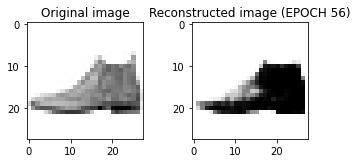

EPOCH 57/100
	 TRAINING - EPOCH 57/100 - loss: 0.479342
	 TEST- EPOCH 57/100 - loss: 0.478244


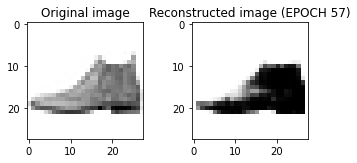

EPOCH 58/100
	 TRAINING - EPOCH 58/100 - loss: 0.479083
	 TEST- EPOCH 58/100 - loss: 0.478410


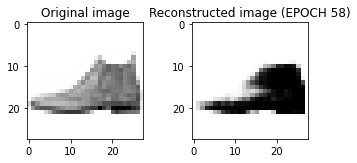

EPOCH 59/100
	 TRAINING - EPOCH 59/100 - loss: 0.478987
	 TEST- EPOCH 59/100 - loss: 0.478379


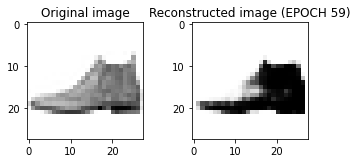

EPOCH 60/100
	 TRAINING - EPOCH 60/100 - loss: 0.478730
	 TEST- EPOCH 60/100 - loss: 0.478245


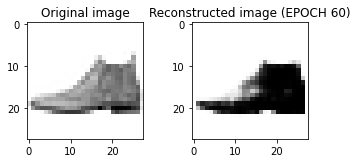

EPOCH 61/100
	 TRAINING - EPOCH 61/100 - loss: 0.478535
	 TEST- EPOCH 61/100 - loss: 0.477621


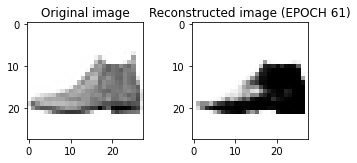

EPOCH 62/100
	 TRAINING - EPOCH 62/100 - loss: 0.478331
	 TEST- EPOCH 62/100 - loss: 0.477762


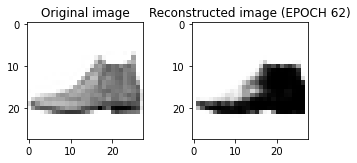

EPOCH 63/100
	 TRAINING - EPOCH 63/100 - loss: 0.478172
	 TEST- EPOCH 63/100 - loss: 0.477293


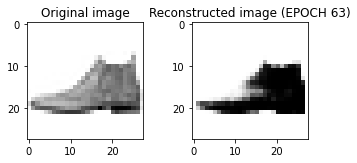

EPOCH 64/100
	 TRAINING - EPOCH 64/100 - loss: 0.478021
	 TEST- EPOCH 64/100 - loss: 0.476995


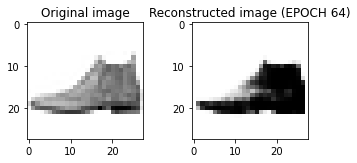

EPOCH 65/100
	 TRAINING - EPOCH 65/100 - loss: 0.477851
	 TEST- EPOCH 65/100 - loss: 0.476976


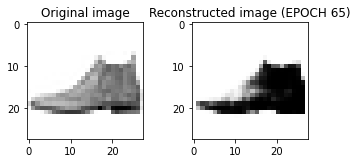

EPOCH 66/100
	 TRAINING - EPOCH 66/100 - loss: 0.477690
	 TEST- EPOCH 66/100 - loss: 0.477023


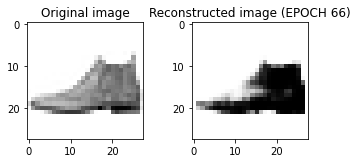

EPOCH 67/100
	 TRAINING - EPOCH 67/100 - loss: 0.477566
	 TEST- EPOCH 67/100 - loss: 0.476873


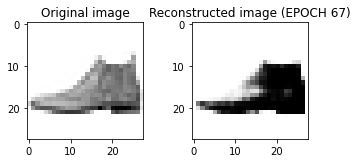

EPOCH 68/100
	 TRAINING - EPOCH 68/100 - loss: 0.477375
	 TEST- EPOCH 68/100 - loss: 0.476891


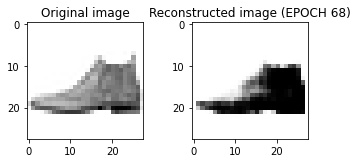

EPOCH 69/100
	 TRAINING - EPOCH 69/100 - loss: 0.477293
	 TEST- EPOCH 69/100 - loss: 0.476506


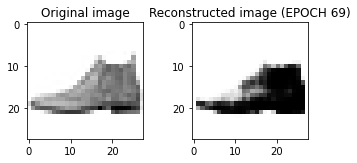

EPOCH 70/100
	 TRAINING - EPOCH 70/100 - loss: 0.477024
	 TEST- EPOCH 70/100 - loss: 0.476483


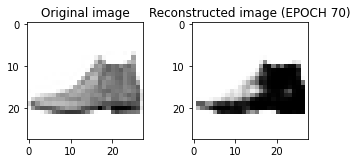

EPOCH 71/100
	 TRAINING - EPOCH 71/100 - loss: 0.476923
	 TEST- EPOCH 71/100 - loss: 0.476337


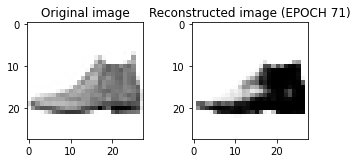

EPOCH 72/100
	 TRAINING - EPOCH 72/100 - loss: 0.476801
	 TEST- EPOCH 72/100 - loss: 0.476253


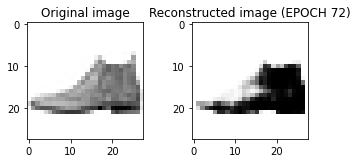

EPOCH 73/100
	 TRAINING - EPOCH 73/100 - loss: 0.476604
	 TEST- EPOCH 73/100 - loss: 0.476111


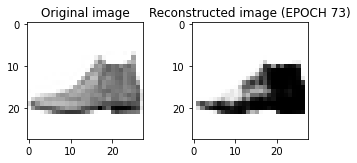

EPOCH 74/100
	 TRAINING - EPOCH 74/100 - loss: 0.476474
	 TEST- EPOCH 74/100 - loss: 0.475924


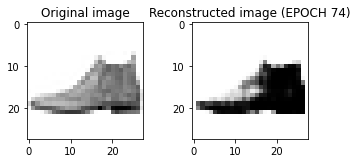

EPOCH 75/100
	 TRAINING - EPOCH 75/100 - loss: 0.476314
	 TEST- EPOCH 75/100 - loss: 0.475794


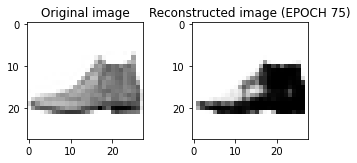

EPOCH 76/100
	 TRAINING - EPOCH 76/100 - loss: 0.476233
	 TEST- EPOCH 76/100 - loss: 0.475906


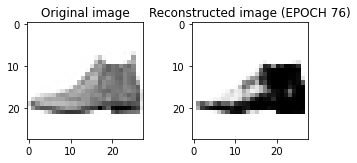

EPOCH 77/100
	 TRAINING - EPOCH 77/100 - loss: 0.476095
	 TEST- EPOCH 77/100 - loss: 0.475172


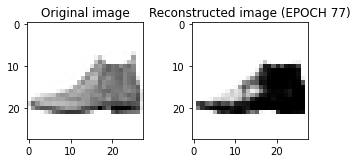

EPOCH 78/100
	 TRAINING - EPOCH 78/100 - loss: 0.476025
	 TEST- EPOCH 78/100 - loss: 0.475609


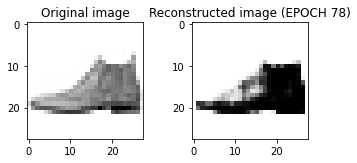

EPOCH 79/100
	 TRAINING - EPOCH 79/100 - loss: 0.475814
	 TEST- EPOCH 79/100 - loss: 0.475218


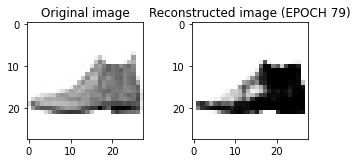

EPOCH 80/100
	 TRAINING - EPOCH 80/100 - loss: 0.475736
	 TEST- EPOCH 80/100 - loss: 0.475241


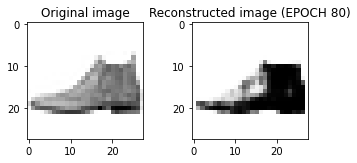

EPOCH 81/100
	 TRAINING - EPOCH 81/100 - loss: 0.475574
	 TEST- EPOCH 81/100 - loss: 0.475066


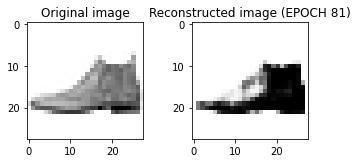

EPOCH 82/100
	 TRAINING - EPOCH 82/100 - loss: 0.475426
	 TEST- EPOCH 82/100 - loss: 0.474693


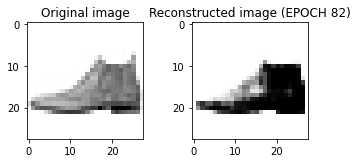

EPOCH 83/100
	 TRAINING - EPOCH 83/100 - loss: 0.475387
	 TEST- EPOCH 83/100 - loss: 0.474796


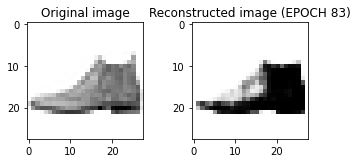

EPOCH 84/100
	 TRAINING - EPOCH 84/100 - loss: 0.475223
	 TEST- EPOCH 84/100 - loss: 0.474407


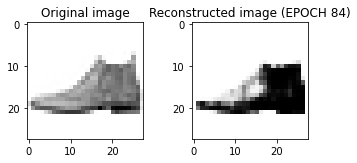

EPOCH 85/100
	 TRAINING - EPOCH 85/100 - loss: 0.475119
	 TEST- EPOCH 85/100 - loss: 0.474527


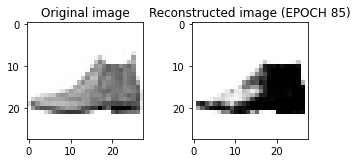

EPOCH 86/100
	 TRAINING - EPOCH 86/100 - loss: 0.474999
	 TEST- EPOCH 86/100 - loss: 0.474631


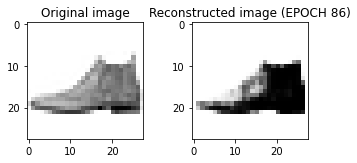

EPOCH 87/100
	 TRAINING - EPOCH 87/100 - loss: 0.474865
	 TEST- EPOCH 87/100 - loss: 0.474010


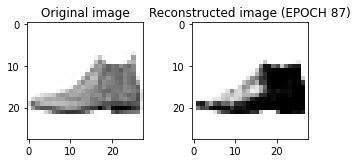

EPOCH 88/100
	 TRAINING - EPOCH 88/100 - loss: 0.474748
	 TEST- EPOCH 88/100 - loss: 0.474164


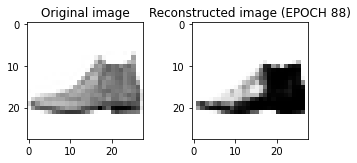

EPOCH 89/100
	 TRAINING - EPOCH 89/100 - loss: 0.474666
	 TEST- EPOCH 89/100 - loss: 0.473793


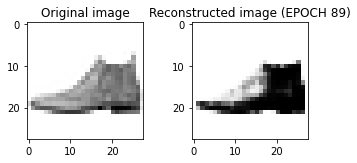

EPOCH 90/100
	 TRAINING - EPOCH 90/100 - loss: 0.474516
	 TEST- EPOCH 90/100 - loss: 0.473804


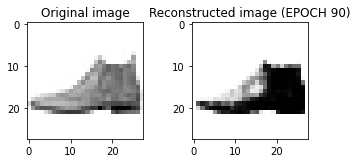

EPOCH 91/100
	 TRAINING - EPOCH 91/100 - loss: 0.474439
	 TEST- EPOCH 91/100 - loss: 0.473691


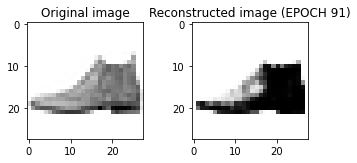

EPOCH 92/100
	 TRAINING - EPOCH 92/100 - loss: 0.474306
	 TEST- EPOCH 92/100 - loss: 0.473942


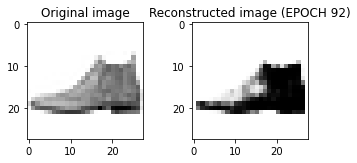

EPOCH 93/100
	 TRAINING - EPOCH 93/100 - loss: 0.474205
	 TEST- EPOCH 93/100 - loss: 0.473771


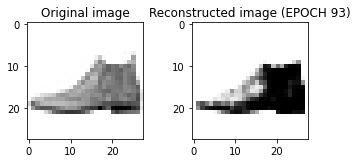

EPOCH 94/100
	 TRAINING - EPOCH 94/100 - loss: 0.474118
	 TEST- EPOCH 94/100 - loss: 0.473477


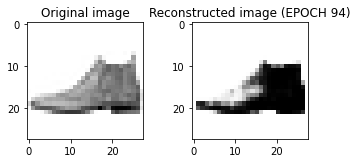

EPOCH 95/100
	 TRAINING - EPOCH 95/100 - loss: 0.474019
	 TEST- EPOCH 95/100 - loss: 0.473270


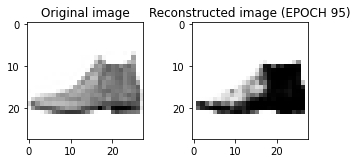

EPOCH 96/100
	 TRAINING - EPOCH 96/100 - loss: 0.473927
	 TEST- EPOCH 96/100 - loss: 0.473178


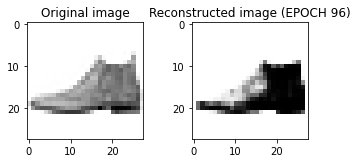

EPOCH 97/100
	 TRAINING - EPOCH 97/100 - loss: 0.473778
	 TEST- EPOCH 97/100 - loss: 0.473301


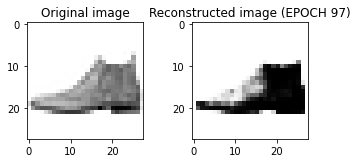

EPOCH 98/100
	 TRAINING - EPOCH 98/100 - loss: 0.473658
	 TEST- EPOCH 98/100 - loss: 0.473115


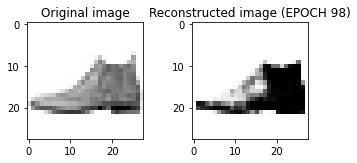

EPOCH 99/100
	 TRAINING - EPOCH 99/100 - loss: 0.473621
	 TEST- EPOCH 99/100 - loss: 0.473016


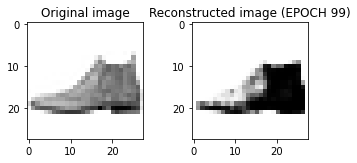

EPOCH 100/100
	 TRAINING - EPOCH 100/100 - loss: 0.473506
	 TEST- EPOCH 100/100 - loss: 0.472889


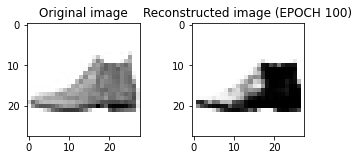

In [ ]:
### Training cycle
torch.autograd.set_detect_anomaly(True)
num_epochs = 100
train_loss_2 = []
test_loss_2 = []
for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_loss = train_epoch(
        encoder=encoder2, 
        decoder=decoder2, 
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim)
    ### Test  (use the testing function)
    test_loss = test_epoch(
        encoder=encoder2, 
        decoder=decoder2, 
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn)
    # Print losses
    print('\t TRAINING - EPOCH %d/%d - loss: %f' % (epoch + 1, num_epochs, train_loss))
    print('\t TEST- EPOCH %d/%d - loss: %f' % (epoch + 1, num_epochs, test_loss))
    train_loss_2.append(train_loss)
    test_loss_2.append(test_loss)

    ### Plot progress
    # Get the output of a specific image (the test image at index 0 in this case)
    img = test_dataset[0][0].unsqueeze(0).to(device)
    encoder2.eval()
    decoder2.eval()
    with torch.no_grad():
        rec_img  = decoder2(encoder2(img))
    
   # Plot the reconstructed image
    fig, axs = plt.subplots(1, 2, figsize=(5,5))
    axs[0].imshow(img.cpu().squeeze().numpy(), cmap='Greys')
    axs[0].set_title('Original image')
    axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='Greys')
    axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
    plt.tight_layout()
    plt.pause(0.1)


In [ ]:
train_loss_2 = torch.load('train_loss_2.torch')
test_loss_2 = torch.load('test_loss_2.torch')

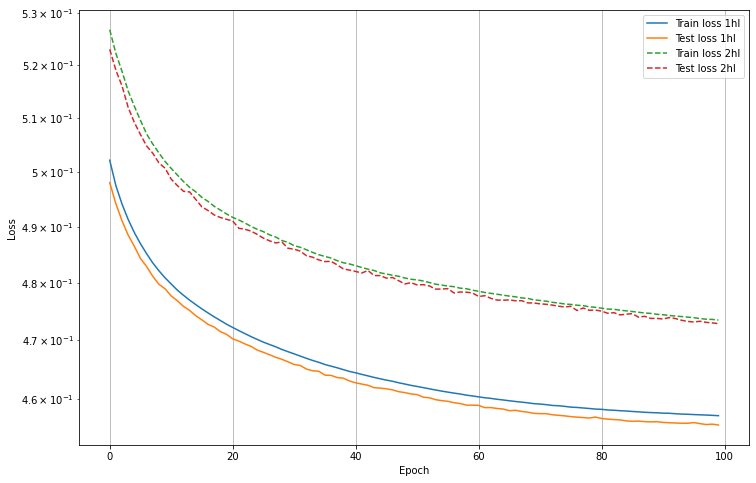

In [ ]:

from matplotlib import markers
# Plot losses
plt.figure(figsize=(12,8))
plt.semilogy(train_loss_log, label='Train loss 1hl')
plt.semilogy(test_loss_log, label='Test loss 1hl')
plt.semilogy(train_loss_2, label='Train loss 2hl', linestyle='--')
plt.semilogy(test_loss_2, label='Test loss 2hl', linestyle='--')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

# Comparison between different size latent spaces

In [ ]:
for latent_dim in [10, 64, 256]:
  torch.manual_seed(0)

  ### Initialize the two networks
  encoded_space_dim = latent_dim
  encoder = Encoder(encoded_space_dim=encoded_space_dim)
  decoder = Decoder(encoded_space_dim=encoded_space_dim)

  loss_fn = torch.nn.MSELoss()

  ### Define an optimizer (both for the encoder and the decoder!)
  lr = 1e-3 # Learning rate
  params_to_optimize = [
      {'params': encoder.parameters()},
      {'params': decoder.parameters()}
  ]
  optim = torch.optim.Adam(params_to_optimize, lr=lr)

  # Check if the GPU is available
  device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

    ### Training cycle
  num_epochs = 100
  train_loss_log = []
  test_loss_log = []
  for epoch in range(num_epochs):
      print('EPOCH %d/%d' % (epoch + 1, num_epochs))
      ### Training (use the training function)
      train_loss = train_epoch(
          encoder=encoder, 
          decoder=decoder, 
          device=device, 
          dataloader=train_dataloader, 
          loss_fn=loss_fn, 
          optimizer=optim)
      ### Test  (use the testing function)
      test_loss = test_epoch(
          encoder=encoder, 
          decoder=decoder, 
          device=device, 
          dataloader=test_dataloader, 
          loss_fn=loss_fn)
      # Print losses
      print('\t TRAINING - EPOCH %d/%d - loss: %f' % (epoch + 1, num_epochs, train_loss))
      print('\t TEST- EPOCH %d/%d - loss: %f' % (epoch + 1, num_epochs, test_loss))
      train_loss_log.append(train_loss)
      test_loss_log.append(test_loss)

      if epoch == num_epochs :
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        encoder.eval()
        decoder.eval()
        with torch.no_grad():
            rec_img  = decoder(encoder(img))

        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 2, figsize=(5,5))
        axs[0].imshow(img.cpu().squeeze().numpy(), cmap='Greys')
        axs[0].set_title('Original image')
        axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='Greys')
        axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)

  torch.save(encoder.state_dict(), 'encoder_params{}.pth'.format(latent_dim))
  torch.save(decoder.state_dict(), 'decoder_params{}.pth'.format(latent_dim))


EPOCH 1/100
	 TRAINING - EPOCH 1/100 - loss: 0.859731
	 TEST- EPOCH 1/100 - loss: 0.593020
EPOCH 2/100
	 TRAINING - EPOCH 2/100 - loss: 0.567848
	 TEST- EPOCH 2/100 - loss: 0.550516
EPOCH 3/100
	 TRAINING - EPOCH 3/100 - loss: 0.543787
	 TEST- EPOCH 3/100 - loss: 0.535620
EPOCH 4/100
	 TRAINING - EPOCH 4/100 - loss: 0.532844
	 TEST- EPOCH 4/100 - loss: 0.528099
EPOCH 5/100
	 TRAINING - EPOCH 5/100 - loss: 0.527444
	 TEST- EPOCH 5/100 - loss: 0.524825
EPOCH 6/100
	 TRAINING - EPOCH 6/100 - loss: 0.524072
	 TEST- EPOCH 6/100 - loss: 0.521474
EPOCH 7/100
	 TRAINING - EPOCH 7/100 - loss: 0.521484
	 TEST- EPOCH 7/100 - loss: 0.519394
EPOCH 8/100
	 TRAINING - EPOCH 8/100 - loss: 0.519422
	 TEST- EPOCH 8/100 - loss: 0.516971
EPOCH 9/100
	 TRAINING - EPOCH 9/100 - loss: 0.517732
	 TEST- EPOCH 9/100 - loss: 0.516044
EPOCH 10/100
	 TRAINING - EPOCH 10/100 - loss: 0.516369
	 TEST- EPOCH 10/100 - loss: 0.514543
EPOCH 11/100
	 TRAINING - EPOCH 11/100 - loss: 0.515140
	 TEST- EPOCH 11/100 - loss: 0.

## Reconstruction Comparison

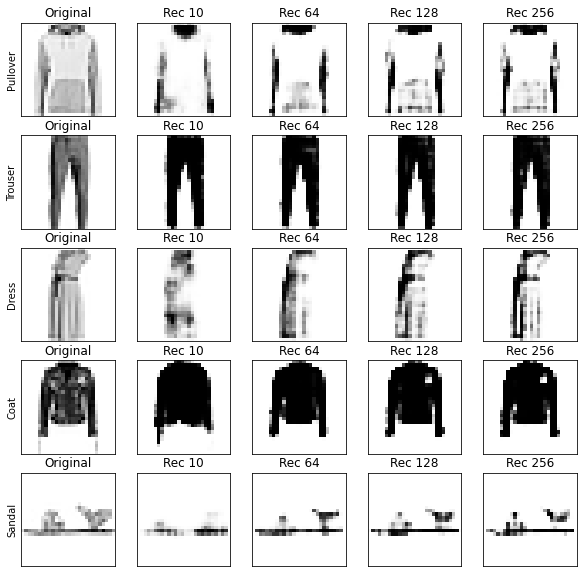

In [ ]:
# Plot the reconstructed image
fig, axs = plt.subplots(5, 5, figsize=(10,10))
for j in range(5):
  index = random.randint(0,len(test_dataset))
  img, label = test_dataset[index]
  img = img.unsqueeze(0).to(device)
  axs[j,0].imshow(img.cpu().squeeze().numpy(), cmap='Greys')
  axs[j,0].set_title('Original')
  axs[j,0].axes.get_xaxis().set_ticks([])
  axs[j,0].axes.get_yaxis().set_ticks([])
  axs[j,0].set_ylabel(f'{id_to_label[label]}')

  latent_dims = [10, 64, 128, 256]
  for i in range(4):
    encoded_space_dim = latent_dims[i]
    encoder = Encoder(encoded_space_dim=encoded_space_dim)
    decoder = Decoder(encoded_space_dim=encoded_space_dim)

    encoder.load_state_dict(torch.load('encoder_params{}.pth'.format(encoded_space_dim), map_location=torch.device('cpu') ))
    decoder.load_state_dict(torch.load('decoder_params{}.pth'.format(encoded_space_dim), map_location=torch.device('cpu') ))

    encoder.to(device)
    decoder.to(device)

    encoder.eval()
    decoder.eval()
    with torch.no_grad():
        rec_img  = decoder(encoder(img))

    axs[j,i+1].imshow(rec_img.cpu().squeeze().numpy(), cmap='Greys')
    axs[j,i+1].set_title('Rec {}'.format(encoded_space_dim) )
    axs[j,i+1].axes.get_xaxis().set_ticks([])
    axs[j,i+1].axes.get_yaxis().set_ticks([])
    #plt.tight_layout()
  

## Sampling Comparison

In [ ]:
def sampling(num_samples, encoded_space_dim, decoder):
  z = torch.randn(num_samples,
                  encoded_space_dim)
  z = z.to(device)
  decoder.eval()
  with torch.no_grad():
    samples = decoder(z)
    
  return samples

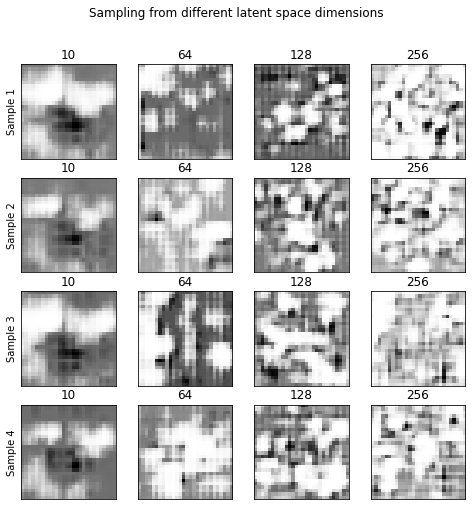

In [ ]:
# Plot the reconstructed image
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
fig, axs = plt.subplots(4, 4, figsize=(8,8))
fig.suptitle('Sampling from different latent space dimensions')
for j in range(4):
  index = random.randint(0,256)
  latent_dims = [10, 64, 128, 256]

  for i in range(4):
    encoded_space_dim = latent_dims[i]
    decoder = Decoder(encoded_space_dim=encoded_space_dim)
    decoder.load_state_dict(torch.load('decoder_params{}.pth'.format(encoded_space_dim), map_location=torch.device('cpu') ))
    decoder.to(device)
    samples = sampling(256, encoded_space_dim, decoder)
    sample = samples[index]
    axs[j,i].imshow(sample.cpu().squeeze().numpy(), cmap='Greys')
    axs[j,i].set_title('{}'.format(encoded_space_dim) )
    axs[j,i].axes.get_xaxis().set_ticks([])
    axs[j,i].axes.get_yaxis().set_ticks([])
    axs[j,0].set_ylabel('Sample {}'.format(j+1))



# Denoising Autoencoder

In [ ]:
def add_noise(inputs,noise_factor=0.3):
     noisy = inputs+torch.randn_like(inputs) * noise_factor
     noisy = torch.clip(noisy,0.,1.)
     return noisy

In [ ]:
### Training function
def train_epoch_den(encoder, decoder, device, dataloader, loss_fn, optimizer,noise_factor=0.3):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_noisy = add_noise(image_batch,noise_factor)
        image_batch = image_batch.to(device)
        image_noisy = image_noisy.to(device)    
        # Encode data
        encoded_data = encoder(image_noisy)
        # Decode data
        decoded_data = decoder(encoded_data)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [ ]:
### Testing function
def test_epoch_den(encoder, decoder, device, dataloader, loss_fn,noise_factor=0.3):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_noisy = add_noise(image_batch,noise_factor)
            image_noisy = image_noisy.to(device)
            # Encode data
            encoded_data = encoder(image_noisy)
            # Decode data
            decoded_data = decoder(encoded_data)
            # Append the network output and the original image to the lists
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        loss = loss_fn(conc_out, conc_label)
    return loss.data

In [ ]:
def plot_ae_outputs_den(encoder,decoder,n=10,noise_factor=0.3):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}    
    for i in range(n):

      ax = plt.subplot(3,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0)
      image_noisy = add_noise(img,noise_factor)     
      image_noisy = image_noisy.to(device)

      encoder.eval()
      decoder.eval()

      with torch.no_grad():
         rec_img  = decoder(encoder(image_noisy))

      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(3, n, i + 1 + n)
      plt.imshow(image_noisy.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Corrupted images')

      ax = plt.subplot(3, n, i + 1 + n + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.7, 
                    top=0.9, 
                    wspace=0.3, 
                    hspace=0.3)     
    plt.show()   

In [ ]:
encoded_space_dim = 128
encoder_n = Encoder(encoded_space_dim=encoded_space_dim)
decoder_n = Decoder(encoded_space_dim=encoded_space_dim)

encoder_n.load_state_dict(torch.load('encoder_params128.pth', map_location=torch.device('cpu') ))
decoder_n.load_state_dict(torch.load('decoder_params128.pth', map_location=torch.device('cpu') ))

encoder_n.to(device)
decoder_n.to(device)

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=128, out_features=288, bias=True)
    (1): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

In [ ]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 1e-3 # Learning rate
params_to_optimize = [
    {'params': encoder_n.parameters()},
    {'params': decoder_n.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=lr)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


EPOCH 1/100

 EPOCH 1/100 	 train loss 0.480 	 val loss 0.476


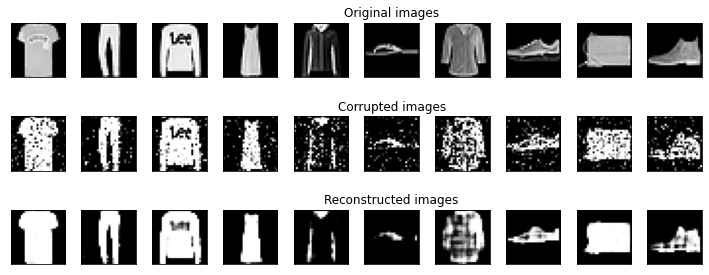

EPOCH 2/100

 EPOCH 2/100 	 train loss 0.477 	 val loss 0.475


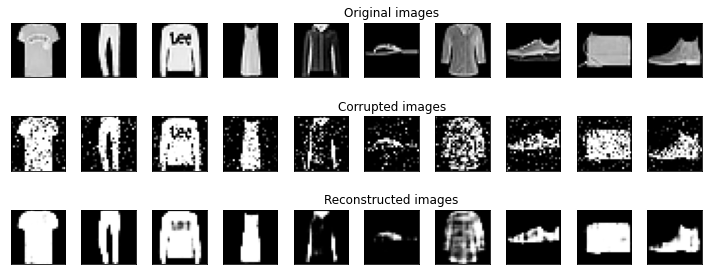

EPOCH 3/100

 EPOCH 3/100 	 train loss 0.476 	 val loss 0.474


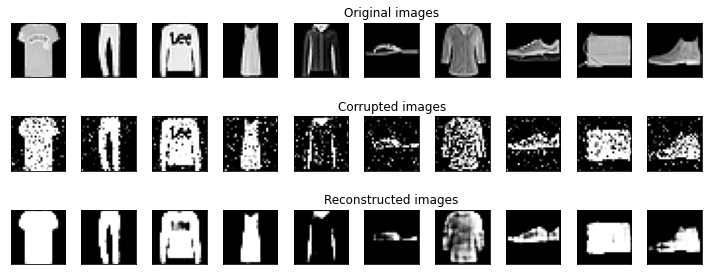

EPOCH 4/100

 EPOCH 4/100 	 train loss 0.476 	 val loss 0.474


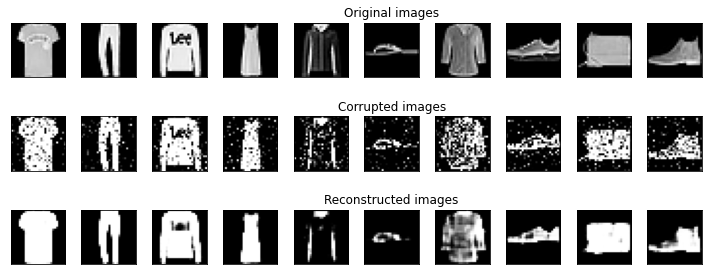

EPOCH 5/100

 EPOCH 5/100 	 train loss 0.475 	 val loss 0.474


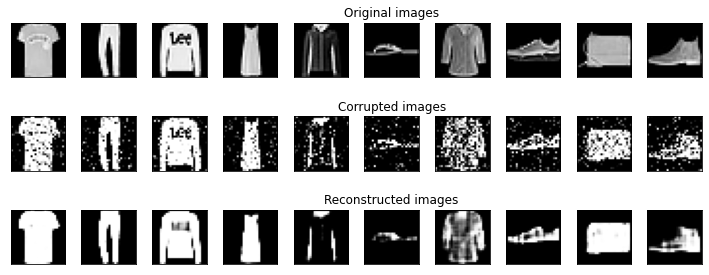

EPOCH 6/100

 EPOCH 6/100 	 train loss 0.475 	 val loss 0.474


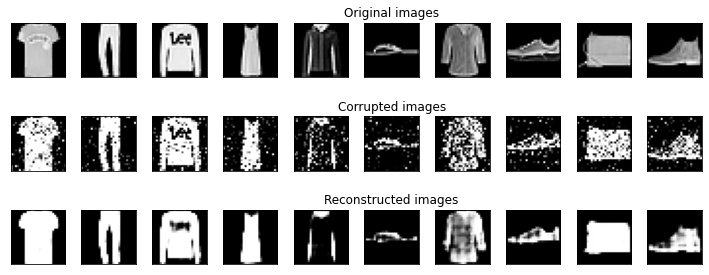

EPOCH 7/100

 EPOCH 7/100 	 train loss 0.475 	 val loss 0.474


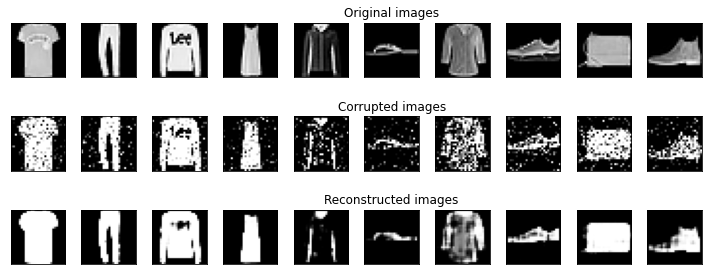

EPOCH 8/100

 EPOCH 8/100 	 train loss 0.475 	 val loss 0.473


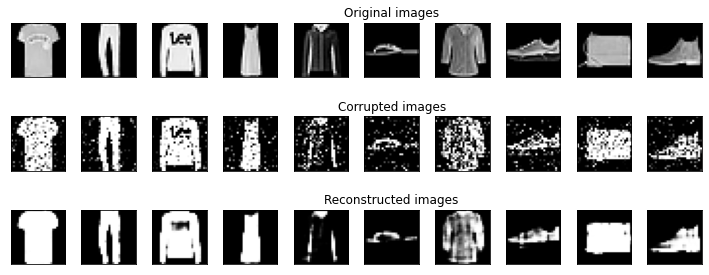

EPOCH 9/100

 EPOCH 9/100 	 train loss 0.475 	 val loss 0.473


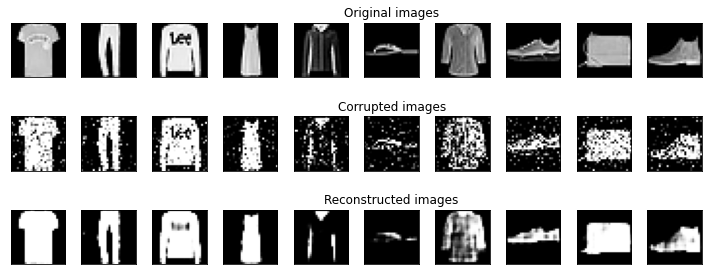

EPOCH 10/100

 EPOCH 10/100 	 train loss 0.475 	 val loss 0.473


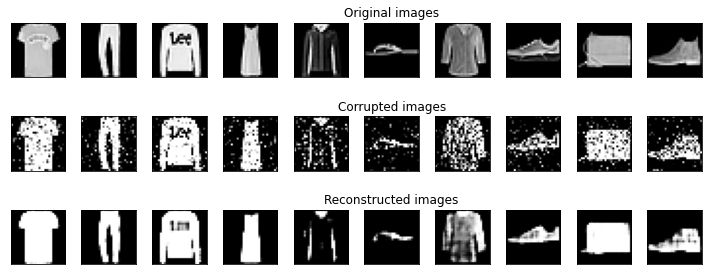

EPOCH 11/100

 EPOCH 11/100 	 train loss 0.475 	 val loss 0.473


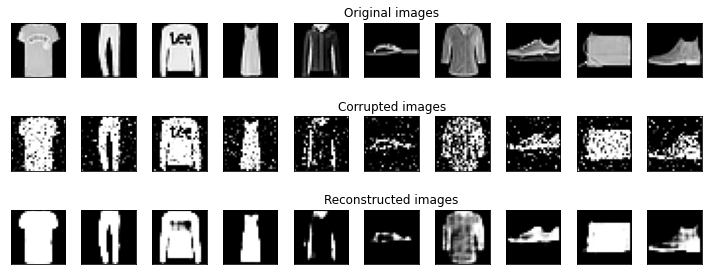

EPOCH 12/100

 EPOCH 12/100 	 train loss 0.475 	 val loss 0.473


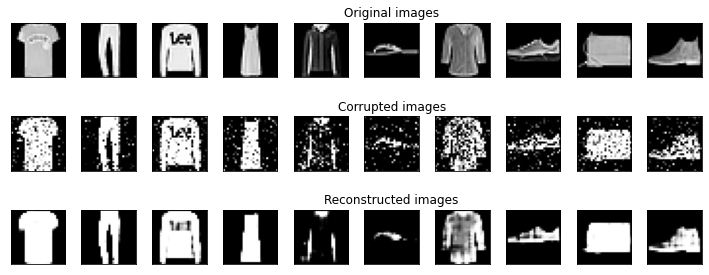

EPOCH 13/100

 EPOCH 13/100 	 train loss 0.475 	 val loss 0.473


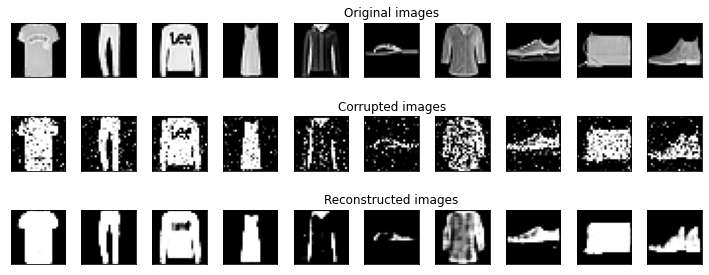

EPOCH 14/100

 EPOCH 14/100 	 train loss 0.474 	 val loss 0.473


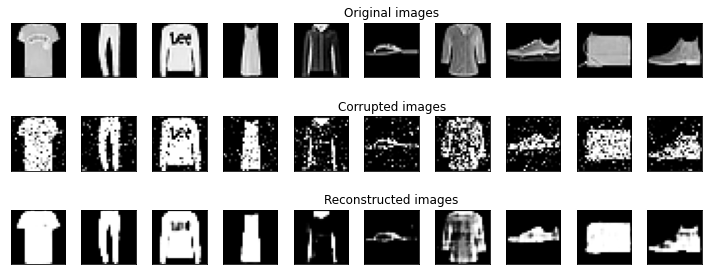

EPOCH 15/100

 EPOCH 15/100 	 train loss 0.474 	 val loss 0.473


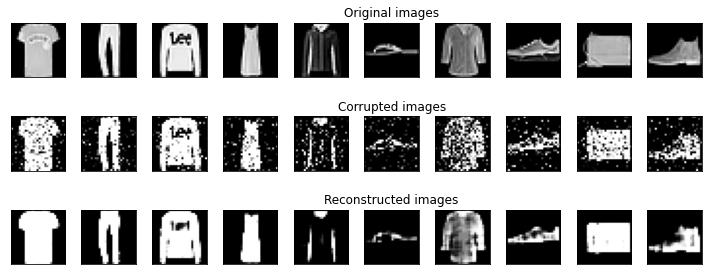

EPOCH 16/100

 EPOCH 16/100 	 train loss 0.474 	 val loss 0.473


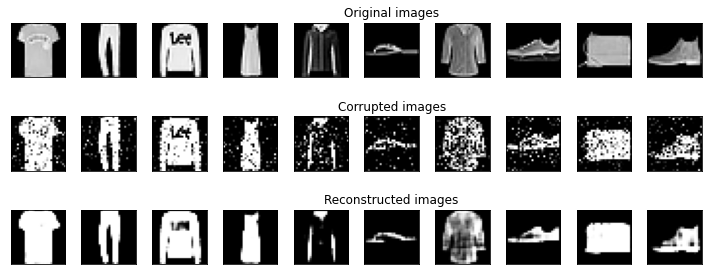

EPOCH 17/100

 EPOCH 17/100 	 train loss 0.474 	 val loss 0.473


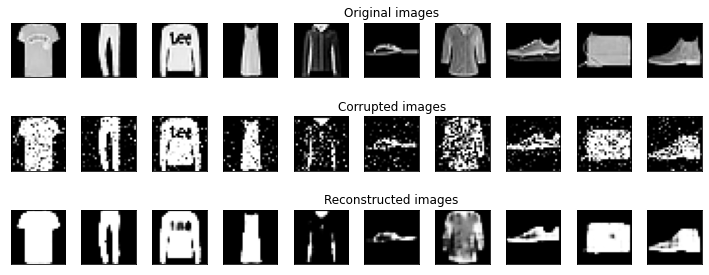

EPOCH 18/100

 EPOCH 18/100 	 train loss 0.474 	 val loss 0.473


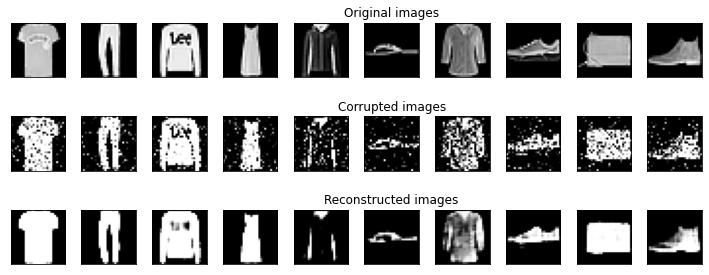

EPOCH 19/100

 EPOCH 19/100 	 train loss 0.474 	 val loss 0.473


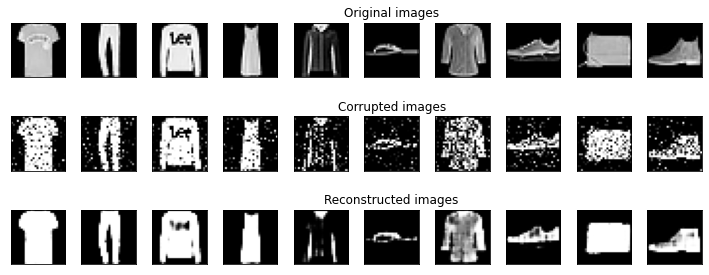

EPOCH 20/100

 EPOCH 20/100 	 train loss 0.474 	 val loss 0.473


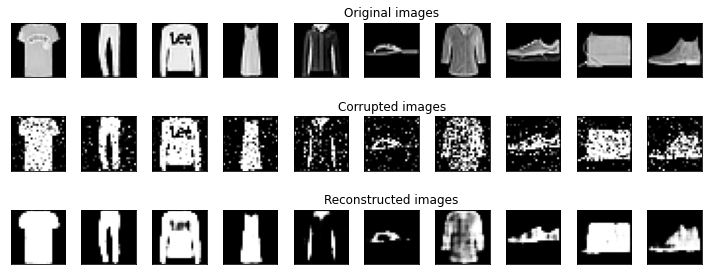

EPOCH 21/100

 EPOCH 21/100 	 train loss 0.474 	 val loss 0.473


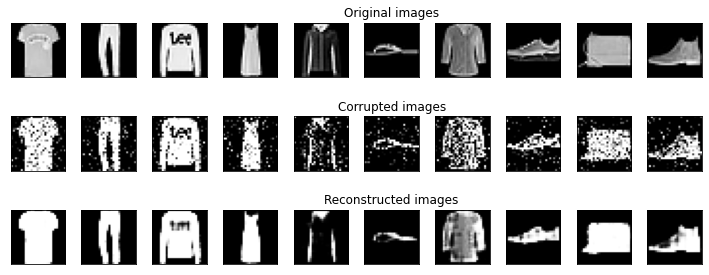

EPOCH 22/100

 EPOCH 22/100 	 train loss 0.474 	 val loss 0.473


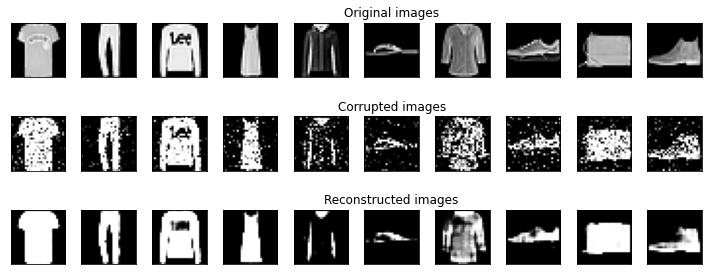

EPOCH 23/100

 EPOCH 23/100 	 train loss 0.474 	 val loss 0.473


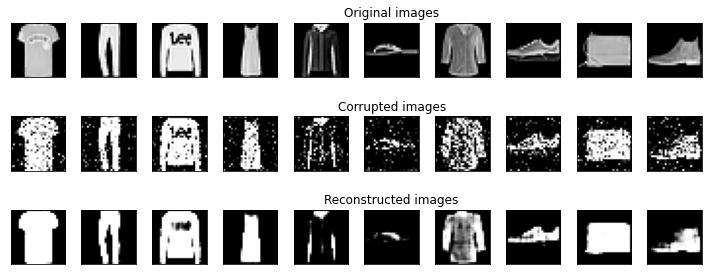

EPOCH 24/100

 EPOCH 24/100 	 train loss 0.474 	 val loss 0.473


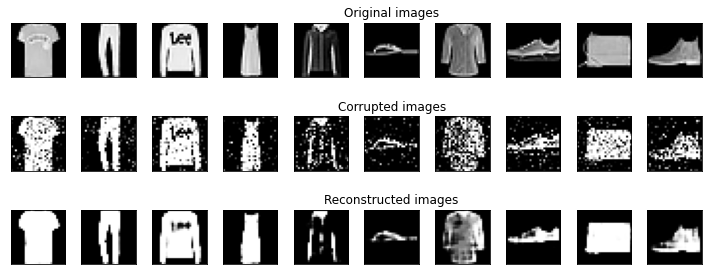

EPOCH 25/100

 EPOCH 25/100 	 train loss 0.474 	 val loss 0.473


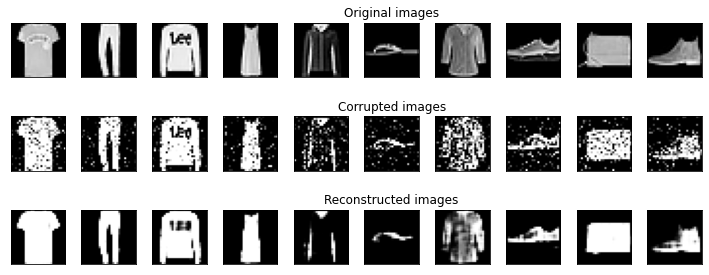

EPOCH 26/100

 EPOCH 26/100 	 train loss 0.474 	 val loss 0.472


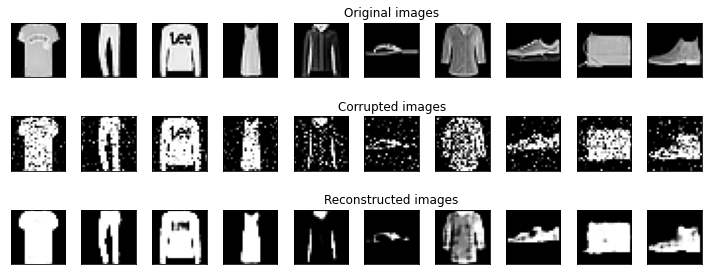

EPOCH 27/100

 EPOCH 27/100 	 train loss 0.474 	 val loss 0.472


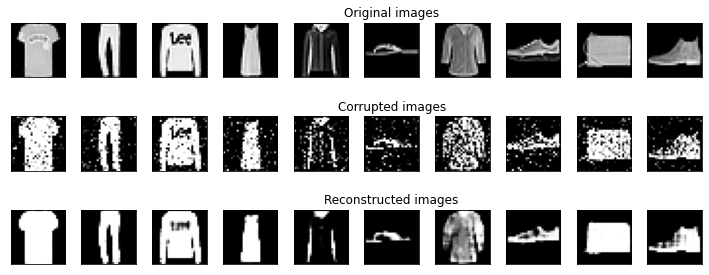

EPOCH 28/100

 EPOCH 28/100 	 train loss 0.474 	 val loss 0.472


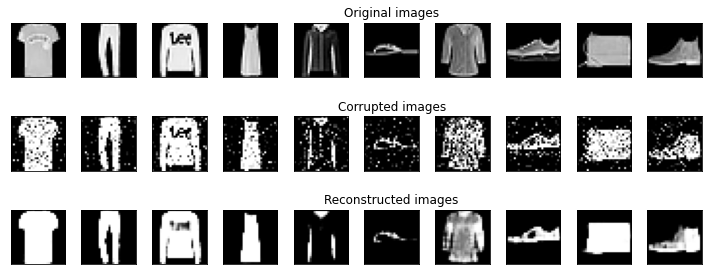

EPOCH 29/100

 EPOCH 29/100 	 train loss 0.474 	 val loss 0.472


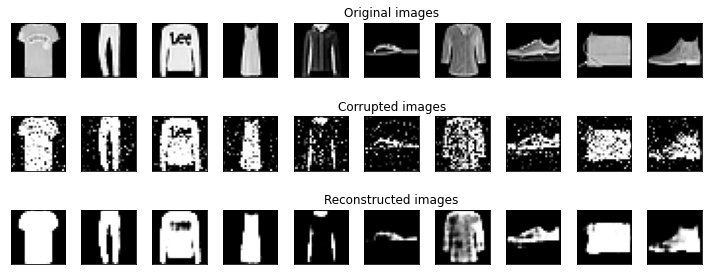

EPOCH 30/100

 EPOCH 30/100 	 train loss 0.474 	 val loss 0.472


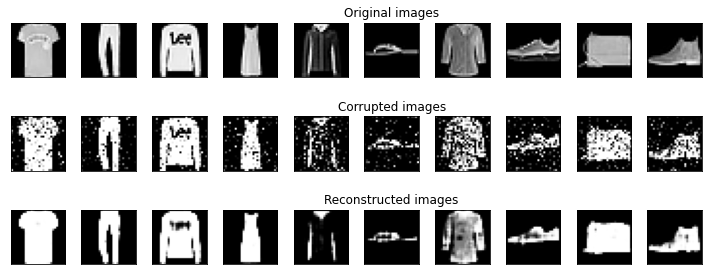

EPOCH 31/100

 EPOCH 31/100 	 train loss 0.474 	 val loss 0.472


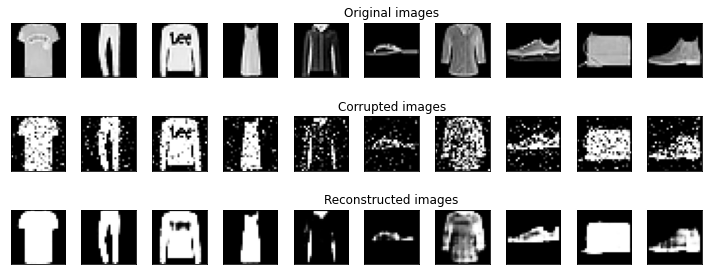

EPOCH 32/100

 EPOCH 32/100 	 train loss 0.474 	 val loss 0.472


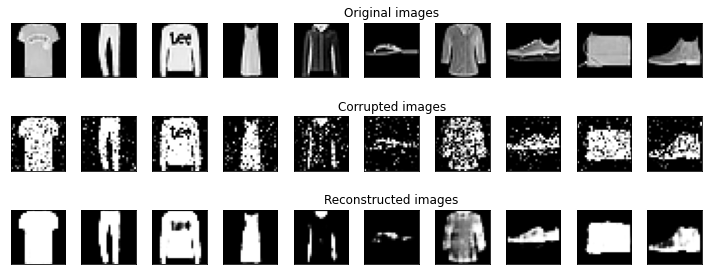

EPOCH 33/100

 EPOCH 33/100 	 train loss 0.474 	 val loss 0.472


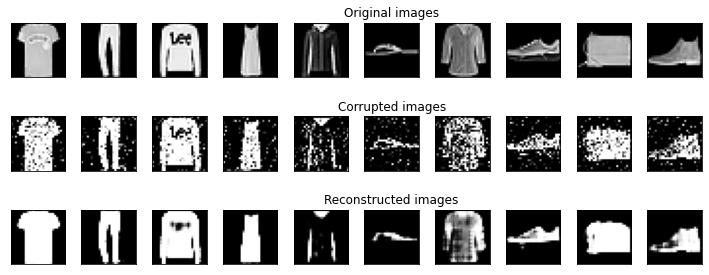

EPOCH 34/100

 EPOCH 34/100 	 train loss 0.474 	 val loss 0.472


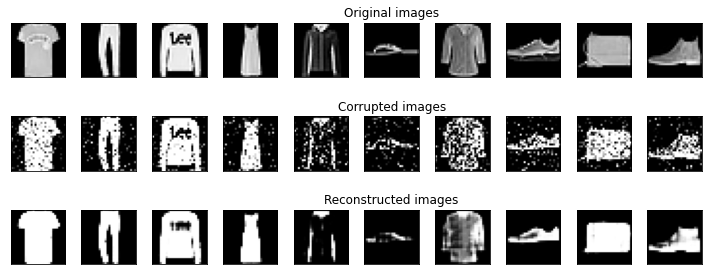

EPOCH 35/100

 EPOCH 35/100 	 train loss 0.474 	 val loss 0.472


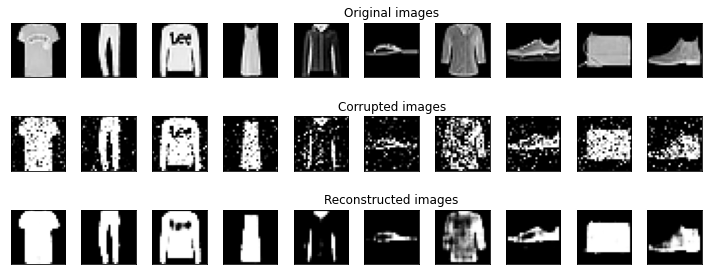

EPOCH 36/100

 EPOCH 36/100 	 train loss 0.474 	 val loss 0.472


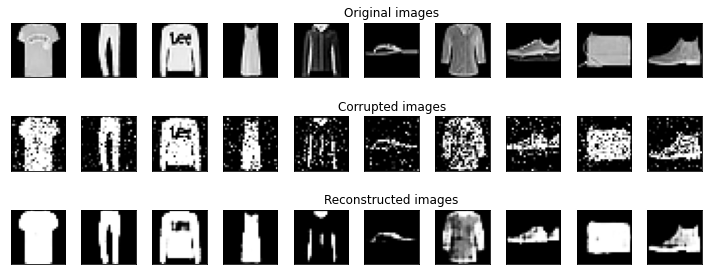

EPOCH 37/100

 EPOCH 37/100 	 train loss 0.474 	 val loss 0.472


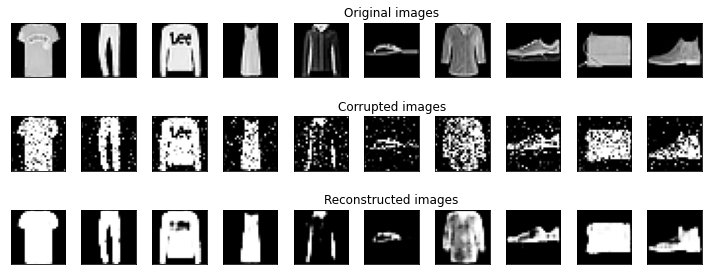

EPOCH 38/100

 EPOCH 38/100 	 train loss 0.474 	 val loss 0.472


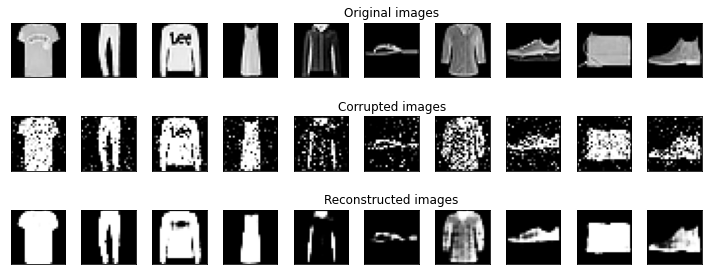

EPOCH 39/100

 EPOCH 39/100 	 train loss 0.474 	 val loss 0.472


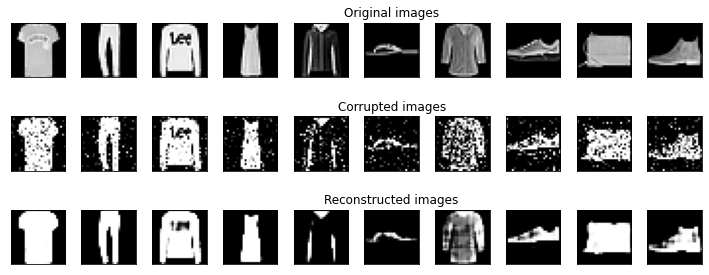

EPOCH 40/100

 EPOCH 40/100 	 train loss 0.474 	 val loss 0.472


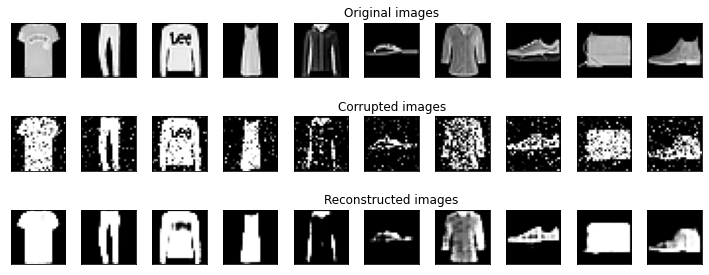

EPOCH 41/100

 EPOCH 41/100 	 train loss 0.474 	 val loss 0.472


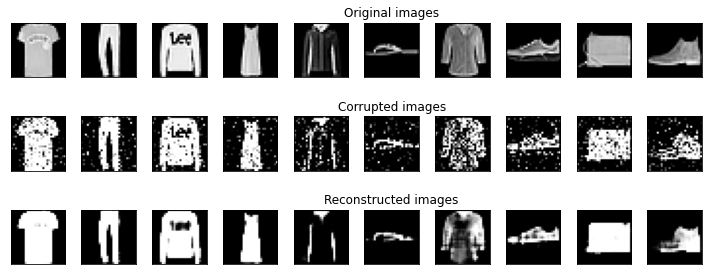

EPOCH 42/100

 EPOCH 42/100 	 train loss 0.474 	 val loss 0.472


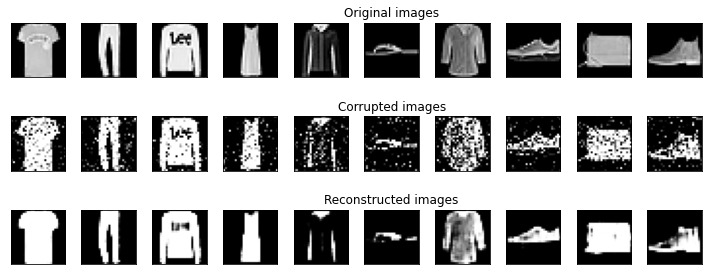

EPOCH 43/100

 EPOCH 43/100 	 train loss 0.474 	 val loss 0.472


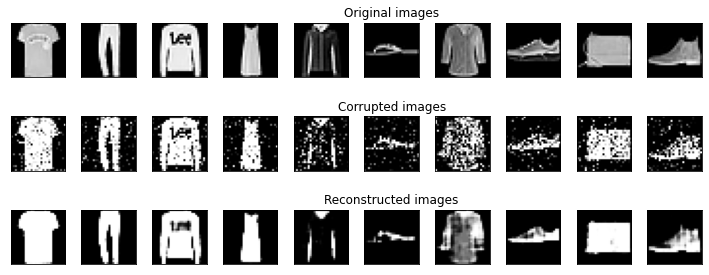

EPOCH 44/100

 EPOCH 44/100 	 train loss 0.474 	 val loss 0.472


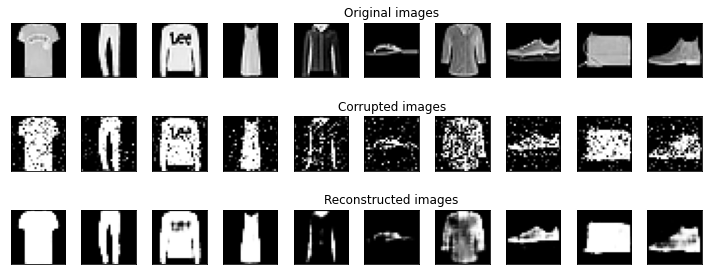

EPOCH 45/100

 EPOCH 45/100 	 train loss 0.474 	 val loss 0.472


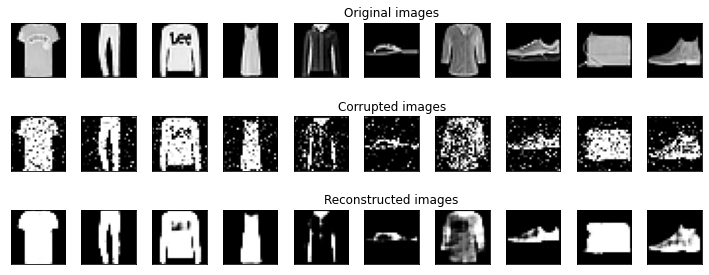

EPOCH 46/100

 EPOCH 46/100 	 train loss 0.474 	 val loss 0.472


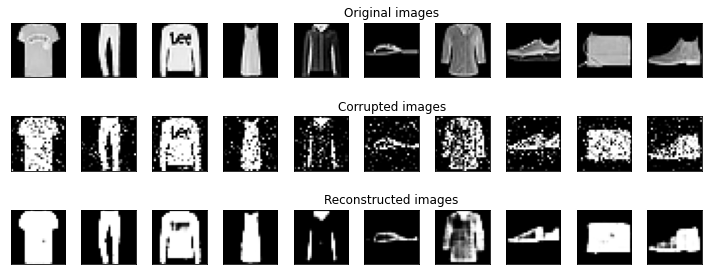

EPOCH 47/100

 EPOCH 47/100 	 train loss 0.473 	 val loss 0.472


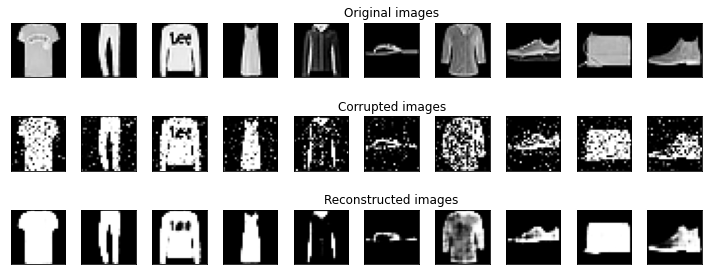

EPOCH 48/100

 EPOCH 48/100 	 train loss 0.474 	 val loss 0.472


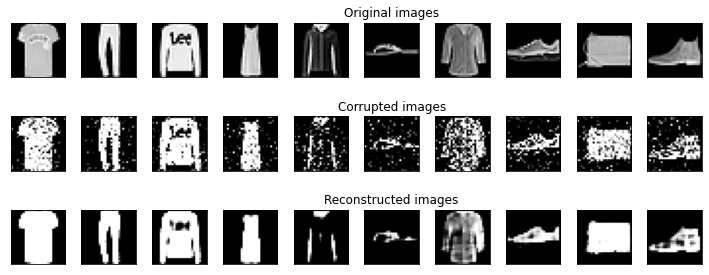

EPOCH 49/100

 EPOCH 49/100 	 train loss 0.473 	 val loss 0.472


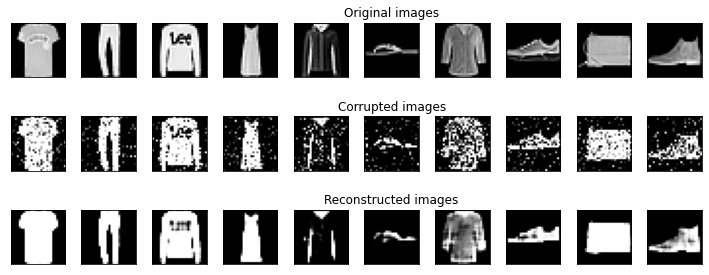

EPOCH 50/100

 EPOCH 50/100 	 train loss 0.473 	 val loss 0.472


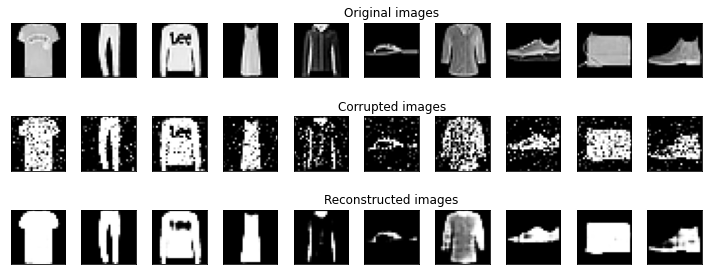

EPOCH 51/100

 EPOCH 51/100 	 train loss 0.473 	 val loss 0.472


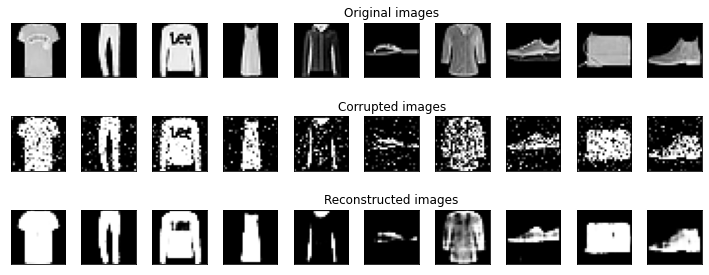

EPOCH 52/100

 EPOCH 52/100 	 train loss 0.473 	 val loss 0.472


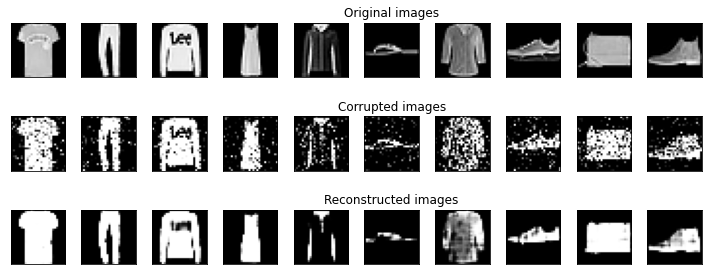

EPOCH 53/100

 EPOCH 53/100 	 train loss 0.473 	 val loss 0.472


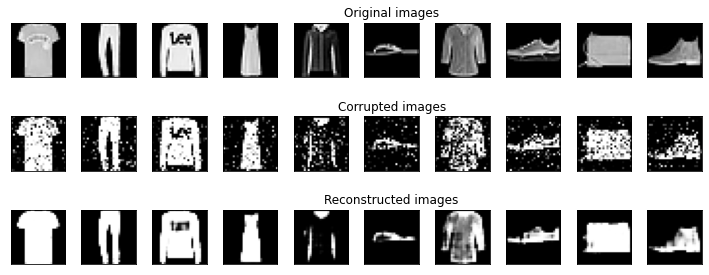

EPOCH 54/100

 EPOCH 54/100 	 train loss 0.473 	 val loss 0.472


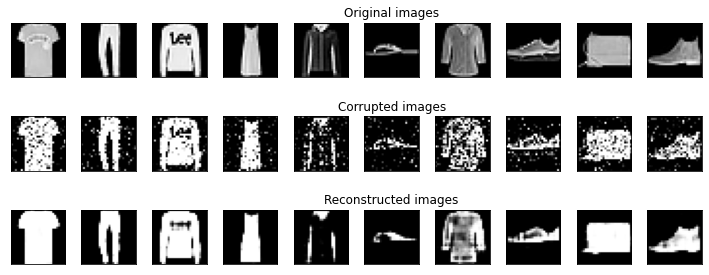

EPOCH 55/100

 EPOCH 55/100 	 train loss 0.473 	 val loss 0.472


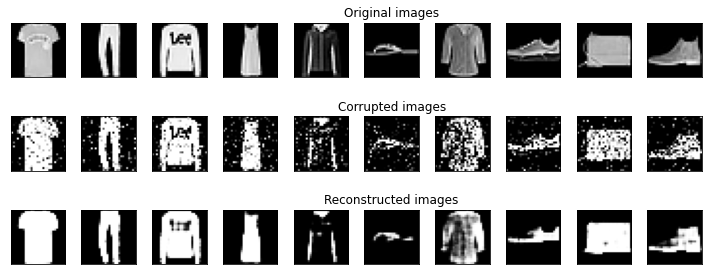

EPOCH 56/100

 EPOCH 56/100 	 train loss 0.473 	 val loss 0.472


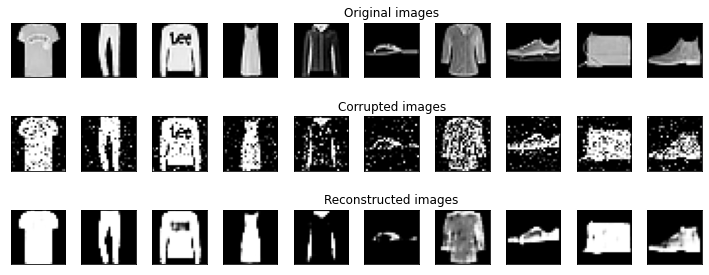

EPOCH 57/100

 EPOCH 57/100 	 train loss 0.473 	 val loss 0.472


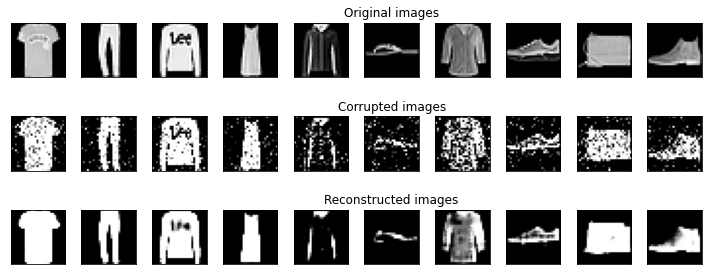

EPOCH 58/100

 EPOCH 58/100 	 train loss 0.473 	 val loss 0.472


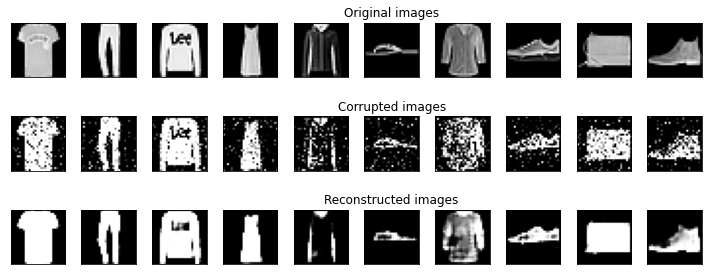

EPOCH 59/100

 EPOCH 59/100 	 train loss 0.473 	 val loss 0.472


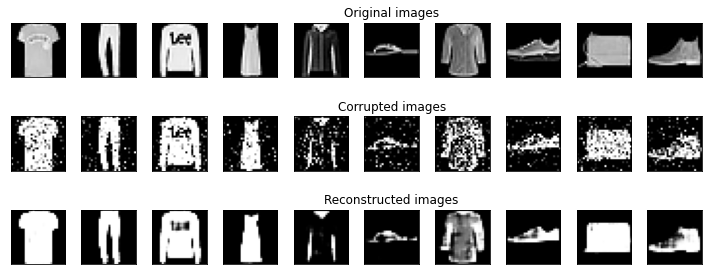

EPOCH 60/100

 EPOCH 60/100 	 train loss 0.473 	 val loss 0.472


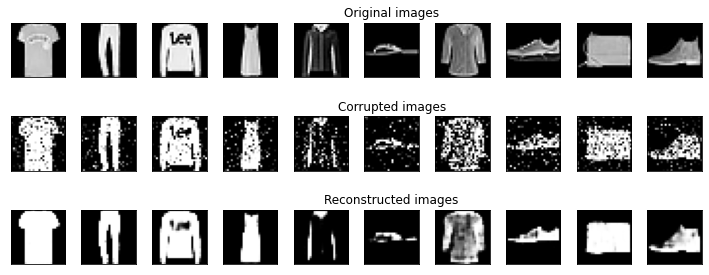

EPOCH 61/100

 EPOCH 61/100 	 train loss 0.473 	 val loss 0.472


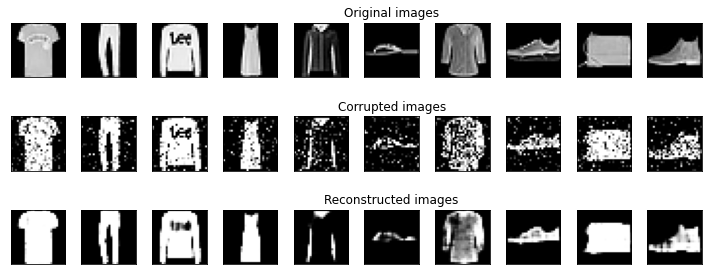

EPOCH 62/100

 EPOCH 62/100 	 train loss 0.473 	 val loss 0.472


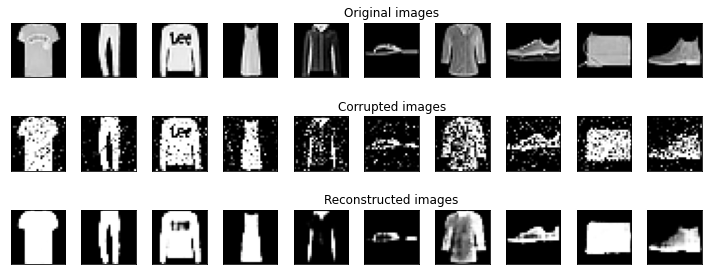

EPOCH 63/100

 EPOCH 63/100 	 train loss 0.473 	 val loss 0.472


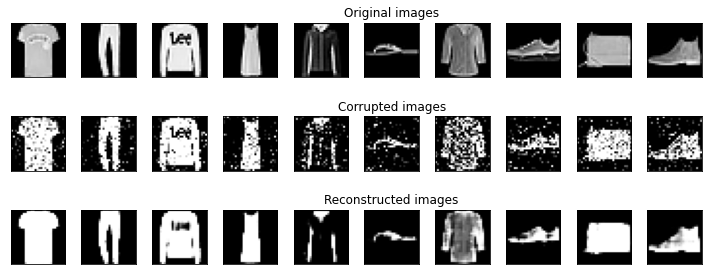

EPOCH 64/100

 EPOCH 64/100 	 train loss 0.473 	 val loss 0.471


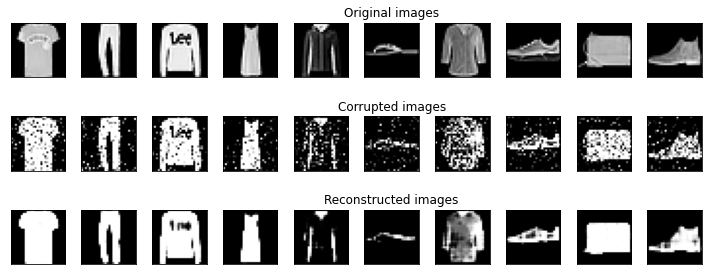

EPOCH 65/100

 EPOCH 65/100 	 train loss 0.473 	 val loss 0.472


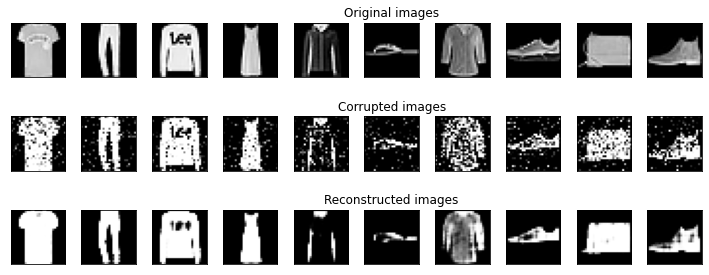

EPOCH 66/100

 EPOCH 66/100 	 train loss 0.473 	 val loss 0.472


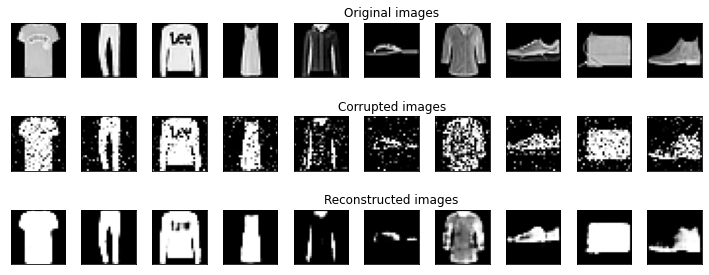

EPOCH 67/100

 EPOCH 67/100 	 train loss 0.473 	 val loss 0.472


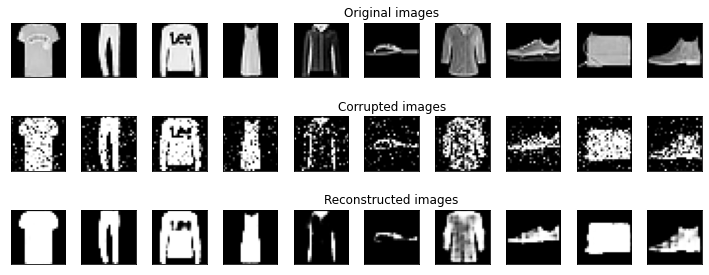

EPOCH 68/100

 EPOCH 68/100 	 train loss 0.473 	 val loss 0.471


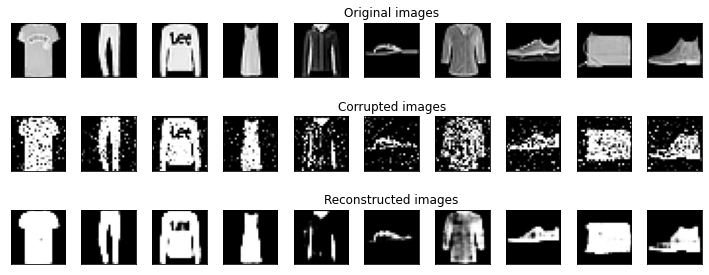

EPOCH 69/100

 EPOCH 69/100 	 train loss 0.473 	 val loss 0.472


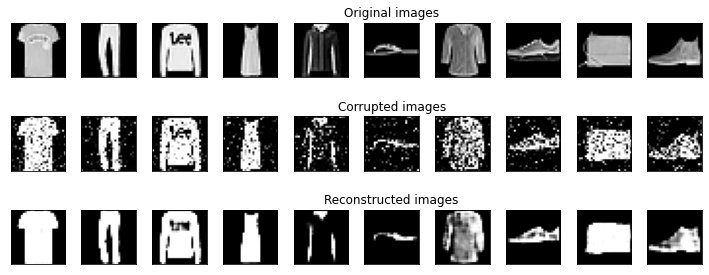

EPOCH 70/100

 EPOCH 70/100 	 train loss 0.473 	 val loss 0.472


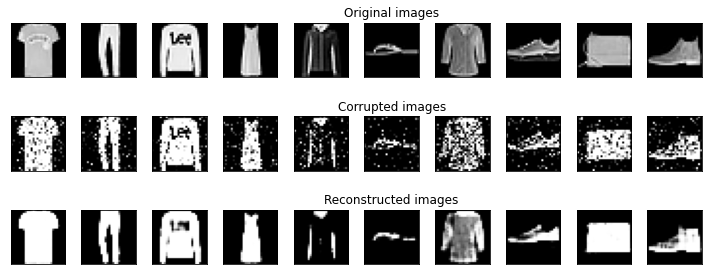

EPOCH 71/100

 EPOCH 71/100 	 train loss 0.473 	 val loss 0.472


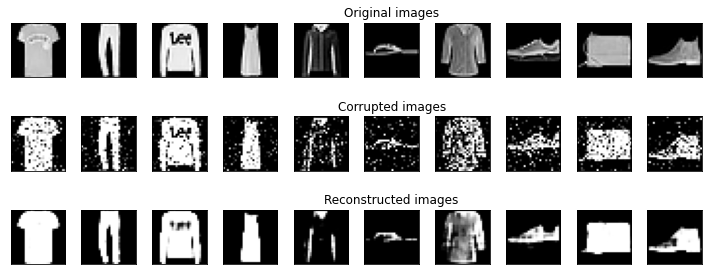

EPOCH 72/100

 EPOCH 72/100 	 train loss 0.473 	 val loss 0.471


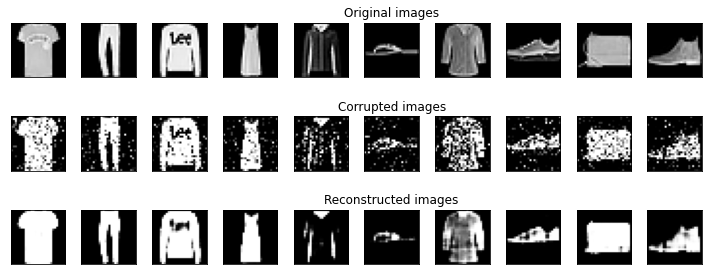

EPOCH 73/100

 EPOCH 73/100 	 train loss 0.473 	 val loss 0.472


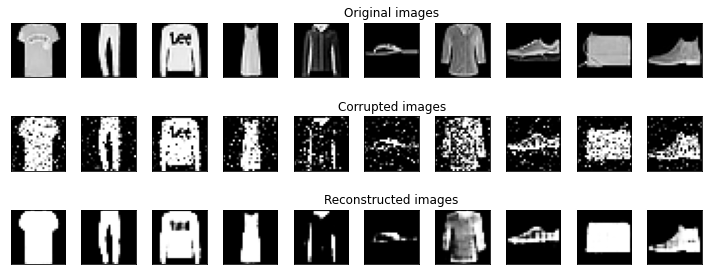

EPOCH 74/100

 EPOCH 74/100 	 train loss 0.473 	 val loss 0.472


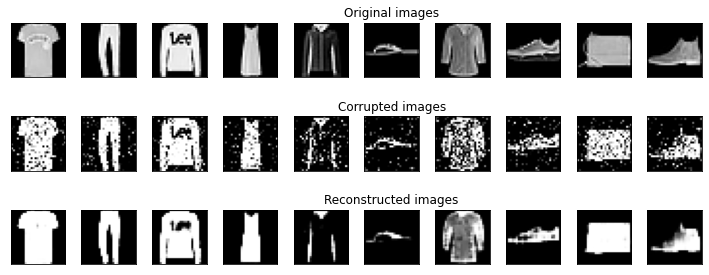

EPOCH 75/100

 EPOCH 75/100 	 train loss 0.473 	 val loss 0.471


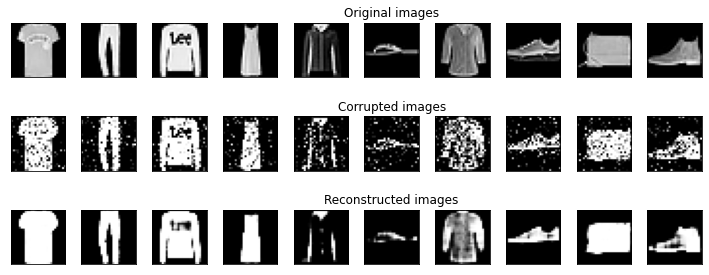

EPOCH 76/100

 EPOCH 76/100 	 train loss 0.473 	 val loss 0.472


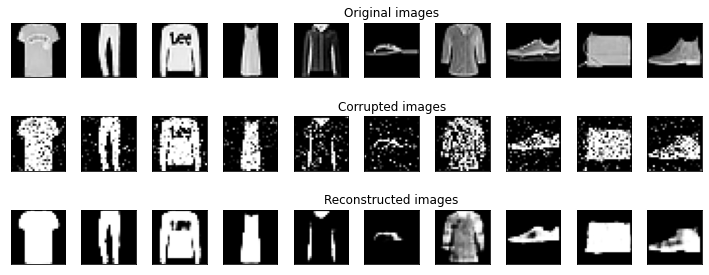

EPOCH 77/100

 EPOCH 77/100 	 train loss 0.473 	 val loss 0.471


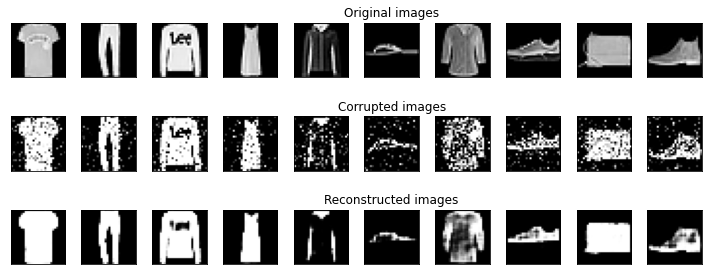

EPOCH 78/100

 EPOCH 78/100 	 train loss 0.473 	 val loss 0.472


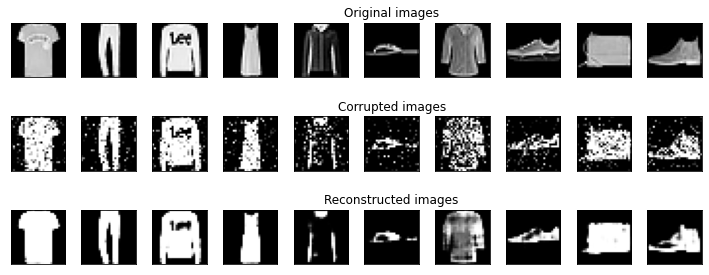

EPOCH 79/100

 EPOCH 79/100 	 train loss 0.473 	 val loss 0.471


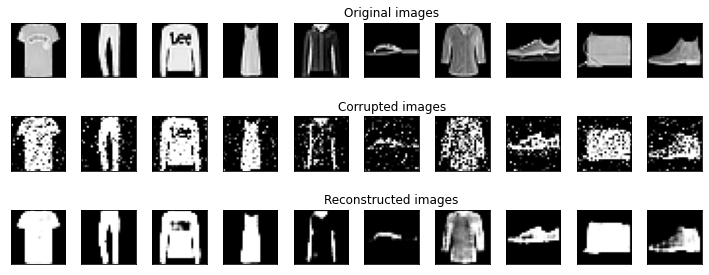

EPOCH 80/100

 EPOCH 80/100 	 train loss 0.473 	 val loss 0.472


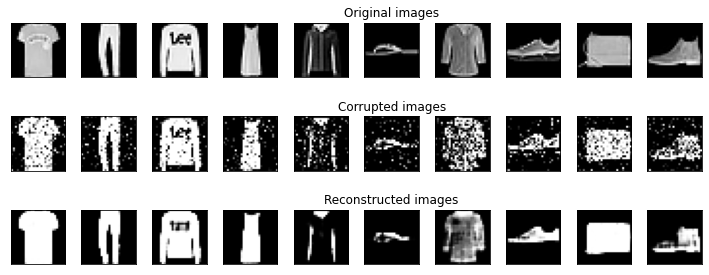

EPOCH 81/100

 EPOCH 81/100 	 train loss 0.473 	 val loss 0.472


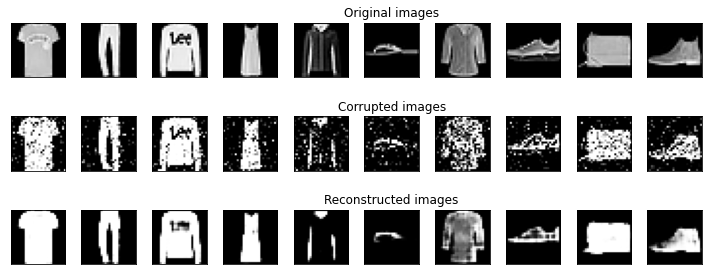

EPOCH 82/100

 EPOCH 82/100 	 train loss 0.473 	 val loss 0.471


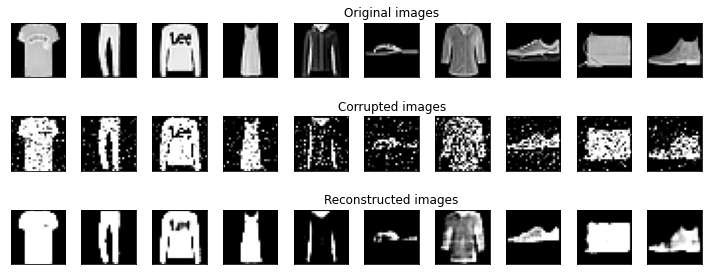

EPOCH 83/100

 EPOCH 83/100 	 train loss 0.473 	 val loss 0.471


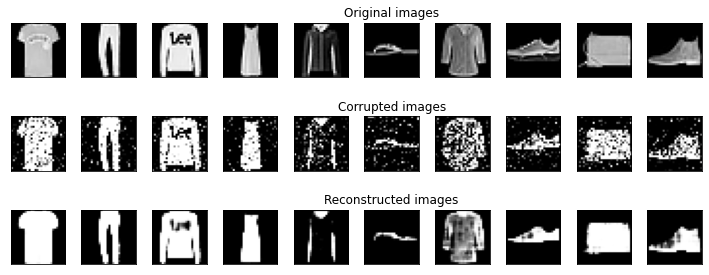

EPOCH 84/100

 EPOCH 84/100 	 train loss 0.473 	 val loss 0.471


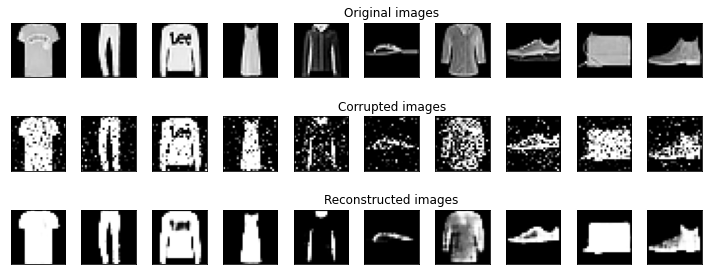

EPOCH 85/100

 EPOCH 85/100 	 train loss 0.473 	 val loss 0.471


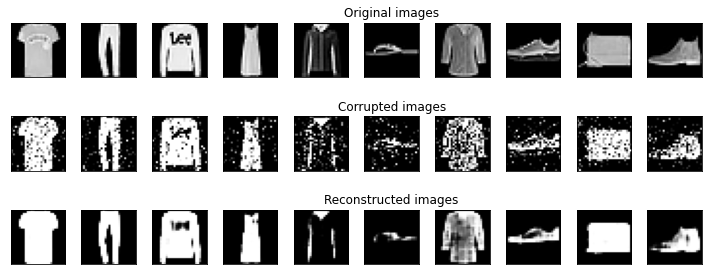

EPOCH 86/100

 EPOCH 86/100 	 train loss 0.473 	 val loss 0.471


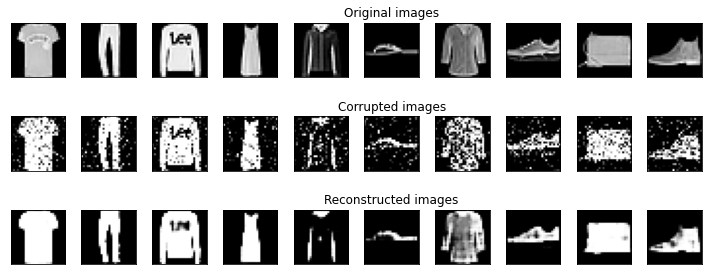

EPOCH 87/100

 EPOCH 87/100 	 train loss 0.473 	 val loss 0.471


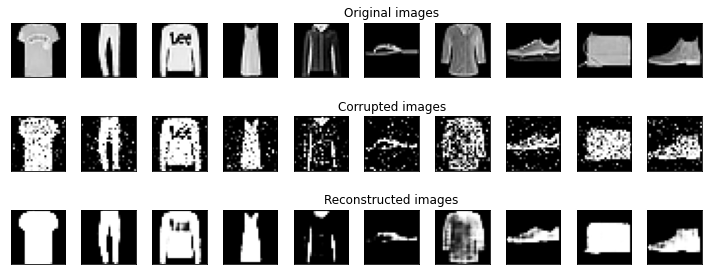

EPOCH 88/100

 EPOCH 88/100 	 train loss 0.473 	 val loss 0.471


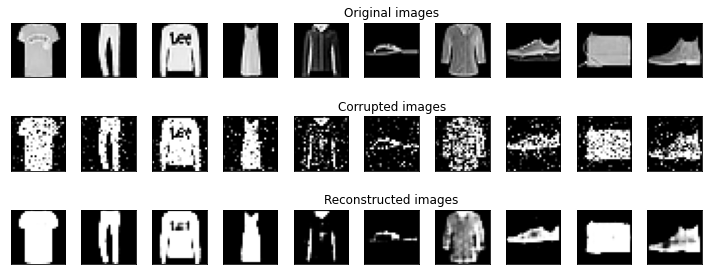

EPOCH 89/100

 EPOCH 89/100 	 train loss 0.473 	 val loss 0.471


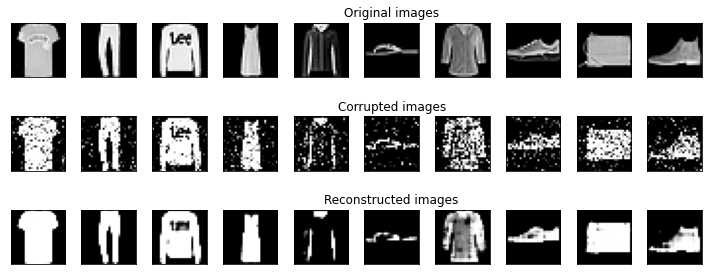

EPOCH 90/100

 EPOCH 90/100 	 train loss 0.473 	 val loss 0.472


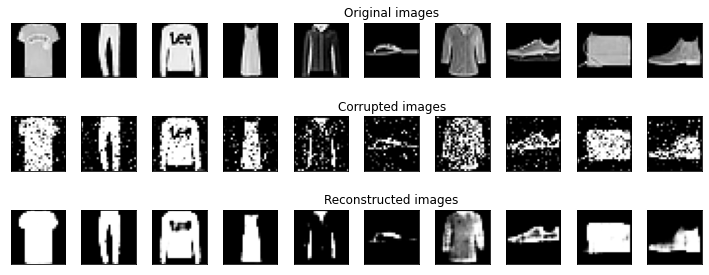

EPOCH 91/100

 EPOCH 91/100 	 train loss 0.473 	 val loss 0.471


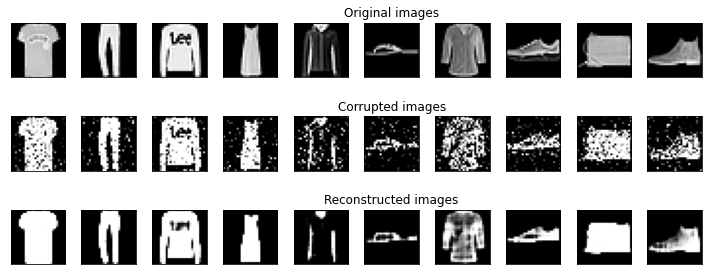

EPOCH 92/100

 EPOCH 92/100 	 train loss 0.473 	 val loss 0.471


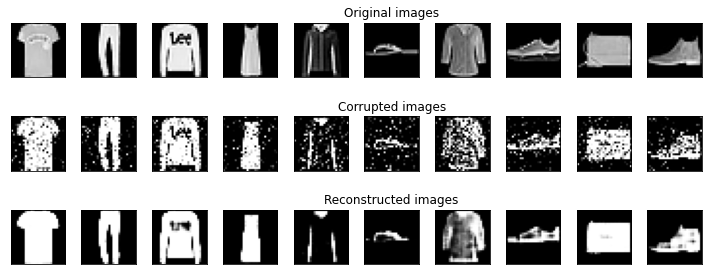

EPOCH 93/100

 EPOCH 93/100 	 train loss 0.473 	 val loss 0.471


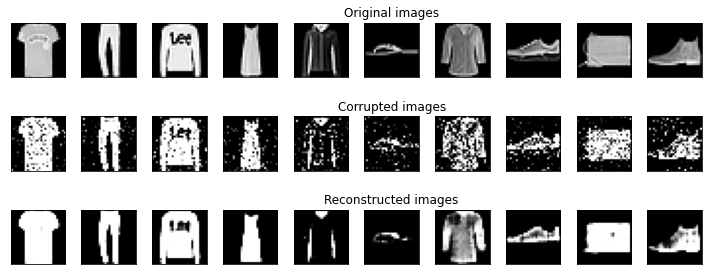

EPOCH 94/100

 EPOCH 94/100 	 train loss 0.473 	 val loss 0.471


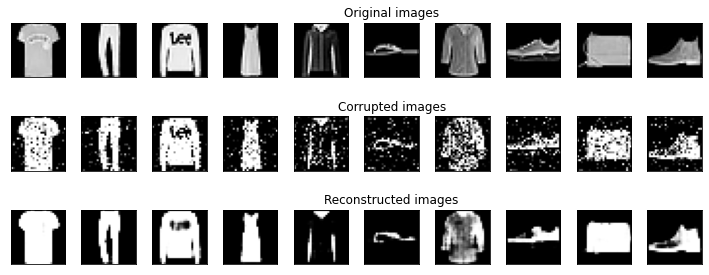

EPOCH 95/100

 EPOCH 95/100 	 train loss 0.473 	 val loss 0.471


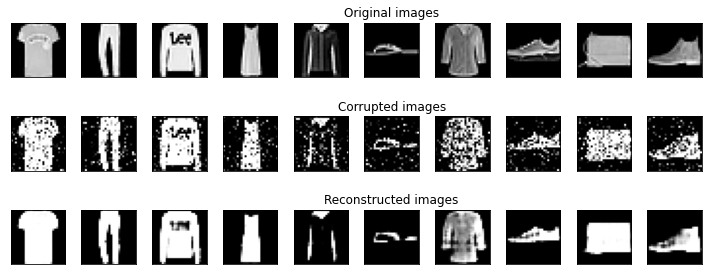

EPOCH 96/100

 EPOCH 96/100 	 train loss 0.473 	 val loss 0.471


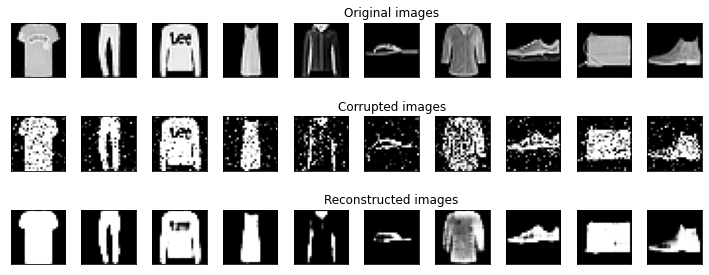

EPOCH 97/100

 EPOCH 97/100 	 train loss 0.473 	 val loss 0.471


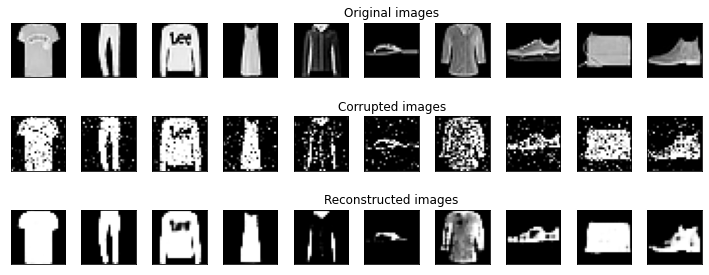

EPOCH 98/100

 EPOCH 98/100 	 train loss 0.473 	 val loss 0.471


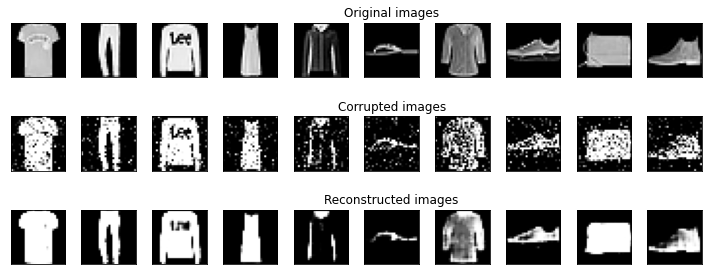

EPOCH 99/100

 EPOCH 99/100 	 train loss 0.473 	 val loss 0.471


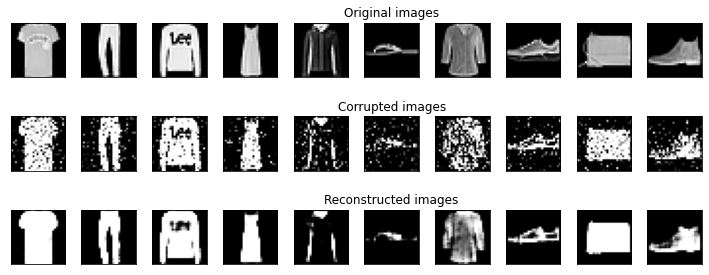

EPOCH 100/100

 EPOCH 100/100 	 train loss 0.473 	 val loss 0.471


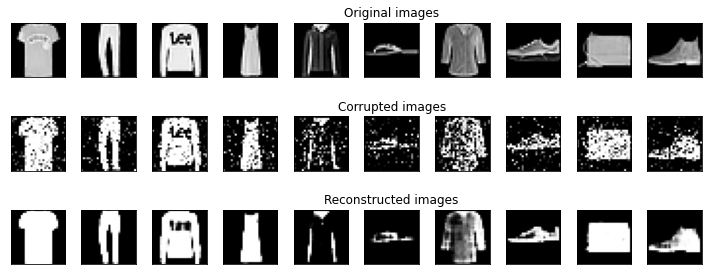

In [ ]:
### Training cycle
noise_factor = 0.7
num_epochs = 100
history_da={'train_loss':[],'test_loss':[]}

for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_loss=train_epoch_den(
        encoder=encoder_n, 
        decoder=decoder_n, 
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim,noise_factor=noise_factor)
    ### Validation  (use the testing function)
    test_loss = test_epoch_den(
        encoder=encoder_n, 
        decoder=decoder_n, 
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn,noise_factor=noise_factor)
    # Print Validationloss
    history_da['train_loss'].append(train_loss)
    history_da['test_loss'].append(test_loss)
    print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,test_loss))
    plot_ae_outputs_den(encoder_n,decoder_n,noise_factor=noise_factor)

# Latent space visualization

In [ ]:
encoded_space_dim = 128
encoder = Encoder(encoded_space_dim=encoded_space_dim)
decoder = Decoder(encoded_space_dim=encoded_space_dim)

encoder.load_state_dict(torch.load('encoder_params128.pth', map_location=torch.device('cpu') ))
decoder.load_state_dict(torch.load('decoder_params128.pth', map_location=torch.device('cpu') ))

encoder.to(device)
decoder.to(device)

Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=128, out_features=288, bias=True)
    (1): ReLU(inplace=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

The encoder can be used to evaluate the latent space values for each of the test images. 

We also save the corresponding label to show how each image is mapped in the encoded space.

In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    encoder.eval()
    with torch.no_grad():
        encoded_img  = encoder(img)
    # Append to list
    encoded_img = encoded_img.flatten().cpu().numpy()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

100%|██████████| 10000/10000 [00:12<00:00, 798.08it/s]


For convenience (not required), convert the result to a table format (`pandas.DataFrame`):

In [ ]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,Enc. Variable 8,Enc. Variable 9,Enc. Variable 10,Enc. Variable 11,Enc. Variable 12,Enc. Variable 13,Enc. Variable 14,Enc. Variable 15,Enc. Variable 16,Enc. Variable 17,Enc. Variable 18,Enc. Variable 19,Enc. Variable 20,Enc. Variable 21,Enc. Variable 22,Enc. Variable 23,Enc. Variable 24,Enc. Variable 25,Enc. Variable 26,Enc. Variable 27,Enc. Variable 28,Enc. Variable 29,Enc. Variable 30,Enc. Variable 31,Enc. Variable 32,Enc. Variable 33,Enc. Variable 34,Enc. Variable 35,Enc. Variable 36,Enc. Variable 37,Enc. Variable 38,Enc. Variable 39,...,Enc. Variable 89,Enc. Variable 90,Enc. Variable 91,Enc. Variable 92,Enc. Variable 93,Enc. Variable 94,Enc. Variable 95,Enc. Variable 96,Enc. Variable 97,Enc. Variable 98,Enc. Variable 99,Enc. Variable 100,Enc. Variable 101,Enc. Variable 102,Enc. Variable 103,Enc. Variable 104,Enc. Variable 105,Enc. Variable 106,Enc. Variable 107,Enc. Variable 108,Enc. Variable 109,Enc. Variable 110,Enc. Variable 111,Enc. Variable 112,Enc. Variable 113,Enc. Variable 114,Enc. Variable 115,Enc. Variable 116,Enc. Variable 117,Enc. Variable 118,Enc. Variable 119,Enc. Variable 120,Enc. Variable 121,Enc. Variable 122,Enc. Variable 123,Enc. Variable 124,Enc. Variable 125,Enc. Variable 126,Enc. Variable 127,label
0,-4.784637,-9.269907,0.626866,-2.261877,0.677225,2.100616,-0.935682,-2.441979,6.132375,1.065079,-0.836671,-0.551072,2.806554,-2.911623,-0.536766,-5.263791,1.461109,3.569034,-10.209150,0.782180,3.936631,0.581566,-4.412065,0.651841,0.940501,0.523698,8.163162,-0.265198,14.968122,-1.949189,9.528083,-1.062728,-0.891558,0.831573,-2.952341,-1.177461,-1.026627,8.491660,3.706973,-3.747591,...,-2.379982,-9.460611,1.877951,3.198020,-0.046353,-2.221582,-1.064307,-8.200458,-2.881771,2.901072,3.482729,-2.994672,-4.048607,-0.343775,0.736216,8.481104,0.601484,2.213207,-6.055490,-0.260195,8.047937,-1.961217,27.221676,-1.514741,-0.119381,-3.101002,0.176767,3.834233,10.781060,3.589794,2.785655,0.386746,4.335383,3.224733,-4.987314,-3.323045,-4.211017,-3.696638,-2.931485,9
1,8.752432,4.977431,-2.963046,-2.130101,2.950405,-0.823107,2.693747,-0.661735,-4.070565,5.284696,-4.125510,-3.760005,-1.412050,7.137714,-2.263566,-1.196629,4.859504,-3.200385,-7.778140,-2.222644,-5.377563,9.030417,11.388422,-4.548028,7.571963,8.914130,6.453588,-2.381019,14.878838,0.118587,7.561184,-0.507293,0.479978,1.820681,5.496589,-1.626824,-1.171865,7.301599,-1.549468,8.601865,...,-1.792788,-24.938095,-13.486794,-4.410412,-9.540737,-1.334370,1.296288,11.858386,0.324770,1.631374,-0.126467,-7.229280,1.471519,-4.814552,-5.337713,5.801382,-2.997815,2.205102,-1.862036,7.065928,-5.997665,4.855571,23.639984,-7.582462,-3.520034,6.499713,7.683164,8.166305,0.865715,-6.769027,-3.121368,-1.516213,-0.942038,6.616720,-0.411044,14.280485,9.205555,1.477949,0.495217,2
2,-2.763733,8.748490,1.594056,0.952736,-1.224748,-4.578846,1.559894,-1.739409,1.225503,3.089673,0.452230,5.646258,1.749282,7.037087,1.347281,-2.559466,1.458086,-5.038183,10.265876,0.003980,0.263533,3.929831,5.807137,-7.651637,-5.096444,-2.399891,7.221509,0.845196,-1.470450,-3.284392,-9.753147,4.868496,2.647032,4.953037,-6.726056,-0.257936,4.324800,-3.011505,2.849960,-0.326805,...,10.727250,-25.572567,4.253785,4.533576,4.784008,4.932252,2.696352,14.733818,-1.471311,-7.092800,-3.565135,3.275504,-3.429485,-2.741559,-4.416757,2.128976,-4.696953,2.192832,0.608507,-1.167788,2.077829,0.251860,13.275872,8.851655,-2.436969,-7.322329,11.971894,5.143155,5.424521,-3.829418,-3.325179,-8.484414,0.542603,-3.382813,3.812707,-5.270319,-4.411967,0.465474,-6.036168,1
3,-2.641269,0.959791,0.840721,3.858653,-1.702984,-4.510632,2.990512,-1.854334,2.778612,5.033332,4.473968,1.606066,-0.138369,6.633692,3.839130,-0.445981,-0.876898,2.164737,-2.922220,2.469934,-7.644282,-0.593359,7.748580,-1.431485,1.654907,5.475510,8.868285,3.304921,1.702203,0.609787,-5.745630,0.455597,3.201675,0.239379,-3.889094,4.527413,

Further insights on PCA and t-SNE


In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
encoded_samples_reduced_PCA = pca.fit_transform(encoded_samples)
encoded_samples_reduced_PCA

array([[-26.48131004, -13.84767046],
       [ 24.84223317, -21.69210321],
       [  8.66626135,  34.29514519],
       ...,
       [ -3.67693028,  11.57363533],
       [ -3.15618133,  33.17508043],
       [-28.09387726,  -1.27449141]])

In [ ]:
# Prepare dataframe for plotting (no need to analyze this code)
df = pd.DataFrame(encoded_samples_reduced_PCA)
df['label'] = [test_dataset[i][1] for i in range(len(test_dataset))]
df['label_name'] = df.label.apply(lambda l: id_to_label[l])
df

,0,1,label,label_name
0,-26.481310,-13.847670,9,Ankle boot
1,24.842233,-21.692103,2,Pullover
2,8.666261,34.295145,1,Trouser
3,-5.038005,31.333059,1,Trouser
4,6.949042,-6.593385,6,Shirt
...,...,...,...,...
9995,-8.452566,-25.596432,9,Ankle boot
9996,-15.065470,25.691097,1,Trouser
9997,-3.676930,11.573635,8,Bag
9998,-3.156181,33.175080,1,Trouser


In [ ]:
import plotly.express as px
### Plot
px.scatter(df, x=0, y=1, color='label_name', hover_data=[df.index])

The space is a little more entangled.

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples)
print(f"LATENT SPACE SHAPE: {encoded_samples.shape}")
print(f"LATENT SPACE SHAPE (TSNE): {encoded_samples_reduced_TSNE.shape}")
#plt.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1], c=encoded_samples.label.to_numpy())

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



LATENT SPACE SHAPE: (10000, 129)
LATENT SPACE SHAPE (TSNE): (10000, 2)


In [ ]:
# Prepare dataframe for plotting (no need to analyze this code)
df = pd.DataFrame(encoded_samples_reduced_TSNE)
df['label'] = [test_dataset[i][1] for i in range(len(test_dataset))]
df['label_name'] = df.label.apply(lambda l: id_to_label[l])
df

,0,1,label,label_name
0,28.434343,48.238552,9,Ankle boot
1,-72.492226,9.458430,2,Pullover
2,48.367638,-62.791656,1,Trouser
3,51.411095,-45.342079,1,Trouser
4,-23.797253,-13.884141,6,Shirt
...,...,...,...,...
9995,15.287021,62.387173,9,Ankle boot
9996,46.542320,-42.577637,1,Trouser
9997,14.727545,4.728340,8,Bag
9998,58.088959,-33.592171,1,Trouser


In [ ]:
import plotly.express as px
### Plot
px.scatter(df, x=0, y=1, color='label_name', hover_data=[df.index])

# Classification
Fine-tune the (convolutional) autoencoder using a supervised classification task, and compare classification accuracy and learning speed with results achieved in Homework 1

We want to fine tune only the last FF layer

In [ ]:
encoded_space_dim = 128
classifier = Encoder(encoded_space_dim=encoded_space_dim)
decoder = Decoder(encoded_space_dim=encoded_space_dim)

classifier.load_state_dict(torch.load('encoder_params128.pth', map_location=torch.device('cpu') ))
decoder.load_state_dict(torch.load('decoder_params128.pth', map_location=torch.device('cpu') ))

<All keys matched successfully>

### Disable the parameters update

In [ ]:
# Disallow the update of all the layers by setting the 'requires_grad' parameter of the tensors to 'False'
for param_name, param in classifier.named_parameters():
    print(param_name)
    print('\tFreezing update')
    param.requires_grad = False  


encoder_cnn.0.weight
	Freezing update
encoder_cnn.0.bias
	Freezing update
encoder_cnn.2.weight
	Freezing update
encoder_cnn.2.bias
	Freezing update
encoder_cnn.4.weight
	Freezing update
encoder_cnn.4.bias
	Freezing update
encoder_lin.0.weight
	Freezing update
encoder_lin.0.bias
	Freezing update


In [ ]:
# Print original network structure
print(classifier)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
  )
)


### Modify the architecture

In [ ]:
# Change the last layer to match the new reduced problem  
classifier.encoder_lin = nn.Sequential(
    nn.Linear(in_features=288, out_features=encoded_space_dim, bias=True),
  #First Hidden Layer
    nn.Linear(in_features=encoded_space_dim, out_features=256, bias=True),
    nn.ReLU(False),
  #Second Hidden Layer
    nn.Linear(in_features=256, out_features=64, bias=True),
    nn.ReLU(False),
    nn.Dropout(0.1),
  #Output Layer
    nn.Linear(in_features=64, out_features=10, bias=True)
)
print(classifier)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=64, bias=True)
    (4): ReLU()
    (5): Dropout(p=0.1, inplace=False)
    (6): Linear(in_features=64, out_features=10, bias=True)
  )
)


### Enable the parameters update for specific layers

In [ ]:
# Allow the training of the last two layers (classifier[4] and classifier[6])
for param in encoder.encoder_lin[0].parameters():
    param.requires_grad = False


In [ ]:
# Check if correct
for param_name, param in encoder.named_parameters():
    print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requires_grad=False
encoder_cnn.4.bias 	- requires_grad=False
encoder_lin.0.weight 	- requires_grad=False
encoder_lin.0.bias 	- requires_grad=False
encoder_lin.1.weight 	- requires_grad=True
encoder_lin.1.bias 	- requires_grad=True
encoder_lin.3.weight 	- requires_grad=True
encoder_lin.3.bias 	- requires_grad=True
encoder_lin.6.weight 	- requires_grad=True
encoder_lin.6.bias 	- requires_grad=True


In [ ]:
### Define the loss function
loss_fn =  nn.CrossEntropyLoss()

### Define an optimizer (both for the encoder and the decoder!)
lr = 1e-3 # Learning rate
weight_decay = 5e-4

optim = torch.optim.Adam(classifier.parameters(), lr=lr, weight_decay=weight_decay)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
classifier.to(device)
decoder.to(device)

Selected device: cpu


Decoder(
  (decoder_lin): Sequential(
    (0): Linear(in_features=128, out_features=288, bias=True)
  )
  (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
  (decoder_conv): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
  )
)

## Training loop

In [ ]:
### Training cycle
num_epochs = 100
train_accuracies, test_accuracies = [], []
for epoch in range(num_epochs):
    print('EPOCH %d/%d' % (epoch + 1, num_epochs))
    ### Training (use the training function)
    train_accuracy = train_epoch(
        encoder=classifier, 
        decoder=decoder, 
        device=device, 
        dataloader=train_dataloader, 
        loss_fn=loss_fn, 
        optimizer=optim,
        classification=True)
    ### Validation  (use the testing function)
    test_accuracy = test_epoch(
        encoder=classifier, 
        decoder=decoder, 
        device=device, 
        dataloader=test_dataloader, 
        loss_fn=loss_fn,
        classification=True,)
    # Print Validationloss
    train_accuracies.append(train_accuracy)
    test_accuracies.append(test_accuracy)

EPOCH 1/100
Accuracy: 45046/60000: 75.07666666666667%
Accuracy: 8136/10000: 81.36%
EPOCH 2/100
Accuracy: 49708/60000: 82.84666666666666%
Accuracy: 8332/10000: 83.32%
EPOCH 3/100
Accuracy: 50797/60000: 84.66166666666666%
Accuracy: 8412/10000: 84.12%
EPOCH 4/100
Accuracy: 51253/60000: 85.42166666666667%
Accuracy: 8594/10000: 85.94%
EPOCH 5/100
Accuracy: 51695/60000: 86.15833333333333%
Accuracy: 8457/10000: 84.57%
EPOCH 6/100
Accuracy: 52043/60000: 86.73833333333333%
Accuracy: 8590/10000: 85.9%
EPOCH 7/100
Accuracy: 52184/60000: 86.97333333333333%
Accuracy: 8664/10000: 86.64%
EPOCH 8/100
Accuracy: 52304/60000: 87.17333333333333%
Accuracy: 8650/10000: 86.5%
EPOCH 9/100
Accuracy: 52344/60000: 87.24%
Accuracy: 8644/10000: 86.44%
EPOCH 10/100
Accuracy: 52684/60000: 87.80666666666667%
Accuracy: 8640/10000: 86.4%
EPOCH 11/100
Accuracy: 52798/60000: 87.99666666666667%
Accuracy: 8660/10000: 86.6%
EPOCH 12/100
Accuracy: 52788/60000: 87.98%
Accuracy: 8706/10000: 87.06%
EPOCH 13/100
Accuracy: 53072/

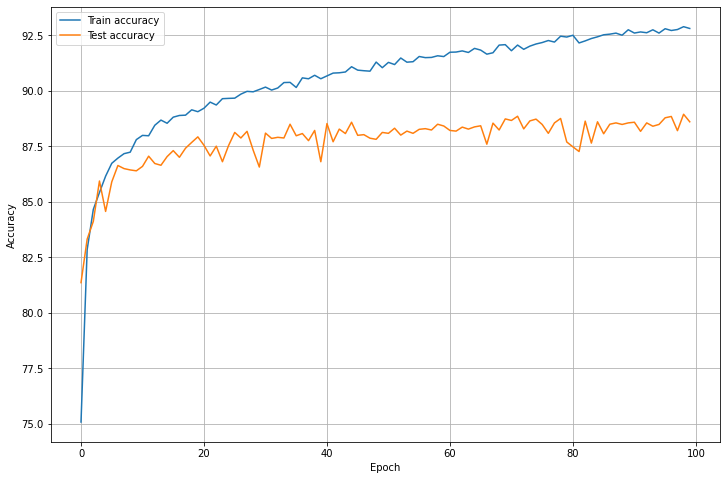

In [ ]:
# Plot losses
plt.figure(figsize=(12,8))
plt.plot(train_accuracies, label='Train accuracy')
plt.plot(test_accuracies, label='Test accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

## Train-Validation splitting for Hyperparameters tuning

In [ ]:
train_dataset, val_dataset = train_test_split(train_dataset, test_size=0.2, stratify=[s[1] for s in train_dataset], shuffle=True, random_state=0)

In [ ]:
### Define train dataloader
train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True)
### Define validation dataloader
val_dataloader = DataLoader(val_dataset, batch_size=256, shuffle=False)
### Define test dataloader
test_dataloader = DataLoader(test_dataset, batch_size=256, shuffle=False)


batch_data, batch_labels = next(iter(train_dataloader))   #next sample in the iterable object train_dataloader
print(f"TRAIN BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(val_dataloader))   #next sample in the iterable object train_dataloader
print(f"VAL BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

batch_data, batch_labels = next(iter(test_dataloader))
print(f"TEST BATCH SHAPE")
print(f"\t Data: {batch_data.shape}")
print(f"\t Labels: {batch_labels.shape}")

TRAIN BATCH SHAPE
	 Data: torch.Size([256, 1, 28, 28])
	 Labels: torch.Size([256])
VAL BATCH SHAPE
	 Data: torch.Size([256, 1, 28, 28])
	 Labels: torch.Size([256])
TEST BATCH SHAPE
	 Data: torch.Size([256, 1, 28, 28])
	 Labels: torch.Size([256])


# Optuna

In [16]:
! pip install optuna

In [18]:
from torch.nn.modules import dropout
import optuna
#from optuna.integration import PyTorchLightningPruningCallback
from optuna.trial import TrialState

In [19]:
def objective(trial):

    device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
    dropout1 = trial.suggest_float('dropout1', 0.01, 0.6) 
    dropout2 = trial.suggest_float('dropout2', 0.01, 0.6) 
    Nh1 = trial.suggest_int("Nh1", 200, 400, log=True)
    Nh2 = trial.suggest_int("Nh2", 50, 150, log=True)

    torch.manual_seed(0)

    ### Initialize the two networks
    encoded_space_dim = 128
    encoder = Encoder(encoded_space_dim=encoded_space_dim)
    decoder = Decoder(encoded_space_dim=encoded_space_dim)

    encoder.load_state_dict(torch.load('encoder_params128.pth', map_location=torch.device('cpu') ))
    decoder.load_state_dict(torch.load('decoder_params128.pth', map_location=torch.device('cpu') ))
    for param_name, param in encoder.named_parameters():
      param.requires_grad = False  

    encoder. encoder_lin = nn.Sequential(
    nn.Linear(in_features=288, out_features=encoded_space_dim, bias=True),
    nn.Linear(in_features=encoded_space_dim, out_features=Nh1, bias=True),
    nn.ReLU(False),
    nn.Dropout(dropout1),
    nn.Linear(in_features=Nh1, out_features=Nh2, bias=True),
    nn.ReLU(False),
    nn.Dropout(dropout2),
    nn.Linear(in_features=Nh2, out_features=10, bias=True)
    )
    print(encoder)
    encoder.to(device)

    for param in encoder.encoder_lin[0].parameters():
      param.requires_grad = False
    
    for param_name, param in encoder.named_parameters():
      print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

    # Define the loss function
    loss_fn =  nn.CrossEntropyLoss()  
    # Define the optimizer
    lr = 1e-3
    weight_decay = trial.suggest_float('weight_decay', 1e-6, 1e-3) 
    optimizer = torch.optim.Adam(encoder.parameters(), lr=lr, weight_decay=weight_decay)
    print(f'Trail {trial.number} with dropout:p1={dropout1}, p2={dropout2}, adam_lr:{lr}, weight_decay:{weight_decay}')

    num_epochs = 20     #1epoch=1iter over your data
    for epoch_num in range(num_epochs):
      print('EPOCH %d/%d' % (epoch_num + 1, num_epochs))
      ### Training (use the training function)
      train_accuracy = train_epoch(
          encoder=encoder, 
          decoder=decoder, 
          device=device, 
          dataloader=train_dataloader, 
          loss_fn=loss_fn, 
          optimizer=optimizer,
          classification=True)
      ### Validation  (use the testing function)
      val_accuracy = test_epoch(
          encoder=encoder, 
          decoder=decoder, 
          device=device, 
          dataloader=val_dataloader, 
          loss_fn=loss_fn,
          classification=True,
          validation = True)

    gen_error = np.abs(train_accuracy-val_accuracy)  
    trial.report(gen_error, trial.number)
    
    # Handle pruning based on the intermediate value.
    if trial.should_prune():
        raise optuna.TrialPruned()

    #return train_accuracy, val_accuracy
    return gen_error

## Study initialization

In [ ]:
# sampler = 'TPEsampler' : default paramter for single-objective optimization
# pruner = 'MedianPruner' : default paramter for pruning useless configurations

study = optuna.create_study(study_name="Cifar10", direction="minimize")

# Opimization
# Recevies the function to be optimized and the number of trials
study.optimize(objective, n_trials=50)
pruned_trials = study.get_trials(deepcopy=False, states=[TrialState.PRUNED])
complete_trials = study.get_trials(deepcopy=False, states=[TrialState.COMPLETE])

print("Study statistics: ")
print("  Number of finished trials: ", len(study.trials))
print("  Number of pruned trials: ", len(pruned_trials))
print("  Number of complete trials: ", len(complete_trials))

print("Best trial:")
trial = study.best_trial

print("  Value: {}".format(trial.value))

print("  Params: ")
for key, value in trial.params.items():
    print("    {}: {}".format(key, value))
    

#At the end it will tell us the best set of parameters after n_trails

[I 2022-01-15 22:07:53,979] A new study created in memory with name: Cifar10


Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=204, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.0692542511107795, inplace=False)
    (4): Linear(in_features=204, out_features=52, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.4605956721798749, inplace=False)
    (7): Linear(in_features=52, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- requir

[I 2022-01-15 22:08:06,347] Trial 0 finished with value: 0.9166666666666714 and parameters: {'dropout1': 0.0692542511107795, 'dropout2': 0.4605956721798749, 'Nh1': 204, 'Nh2': 52, 'weight_decay': 0.0004926491343222358}. Best is trial 0 with value: 0.9166666666666714.


Accuracy: 32936/38400: 85.77083333333333%
Accuracy: 8322/9600: 86.6875%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=262, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.11060435781453559, inplace=False)
    (4): Linear(in_features=262, out_features=119, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.08111781257227055, inplace=False)
    (7): Linear(in_features=119, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fa

[I 2022-01-15 22:08:18,761] Trial 1 finished with value: 0.6744791666666714 and parameters: {'dropout1': 0.11060435781453559, 'dropout2': 0.08111781257227055, 'Nh1': 262, 'Nh2': 119, 'weight_decay': 0.0004278379139859772}. Best is trial 1 with value: 0.6744791666666714.


Accuracy: 33747/38400: 87.8828125%
Accuracy: 8372/9600: 87.20833333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=392, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.4176091433866514, inplace=False)
    (4): Linear(in_features=392, out_features=70, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.02870981173690943, inplace=False)
    (7): Linear(in_features=70, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fa

[I 2022-01-15 22:08:31,204] Trial 2 finished with value: 0.2786458333333286 and parameters: {'dropout1': 0.4176091433866514, 'dropout2': 0.02870981173690943, 'Nh1': 392, 'Nh2': 70, 'weight_decay': 0.0007405994754870431}. Best is trial 2 with value: 0.2786458333333286.


Accuracy: 33009/38400: 85.9609375%
Accuracy: 8279/9600: 86.23958333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=381, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.04268354743755066, inplace=False)
    (4): Linear(in_features=381, out_features=148, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.5445793881824389, inplace=False)
    (7): Linear(in_features=148, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=

[I 2022-01-15 22:08:43,504] Trial 3 finished with value: 0.3046875 and parameters: {'dropout1': 0.04268354743755066, 'dropout2': 0.5445793881824389, 'Nh1': 381, 'Nh2': 148, 'weight_decay': 0.0006114636361574823}. Best is trial 2 with value: 0.2786458333333286.


Accuracy: 33411/38400: 87.0078125%
Accuracy: 8382/9600: 87.3125%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=245, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.23553123138573853, inplace=False)
    (4): Linear(in_features=245, out_features=54, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.16678545236832387, inplace=False)
    (7): Linear(in_features=54, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encod

[I 2022-01-15 22:08:55,936] Trial 4 finished with value: 0.5963541666666572 and parameters: {'dropout1': 0.23553123138573853, 'dropout2': 0.16678545236832387, 'Nh1': 245, 'Nh2': 54, 'weight_decay': 0.0003326214096665179}. Best is trial 2 with value: 0.2786458333333286.


Accuracy: 33139/38400: 86.29947916666667%
Accuracy: 8342/9600: 86.89583333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=321, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.30627577312736365, inplace=False)
    (4): Linear(in_features=321, out_features=129, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.17652248911898366, inplace=False)
    (7): Linear(in_features=129, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requir

[I 2022-01-15 22:09:08,422] Trial 5 finished with value: 0.0546875 and parameters: {'dropout1': 0.30627577312736365, 'dropout2': 0.17652248911898366, 'Nh1': 321, 'Nh2': 129, 'weight_decay': 0.00016446991644578318}. Best is trial 5 with value: 0.0546875.


Accuracy: 33439/38400: 87.08072916666667%
Accuracy: 8365/9600: 87.13541666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=235, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.5347342336253436, inplace=False)
    (4): Linear(in_features=235, out_features=50, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.47655940462899593, inplace=False)
    (7): Linear(in_features=50, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_

[I 2022-01-15 22:09:20,944] Trial 6 finished with value: 2.3619791666666714 and parameters: {'dropout1': 0.5347342336253436, 'dropout2': 0.47655940462899593, 'Nh1': 235, 'Nh2': 50, 'weight_decay': 1.2089554645598422e-05}. Best is trial 5 with value: 0.0546875.


Accuracy: 31685/38400: 82.51302083333333%
Accuracy: 8148/9600: 84.875%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=216, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.20575876955633018, inplace=False)
    (4): Linear(in_features=216, out_features=84, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.07053763849100526, inplace=False)
    (7): Linear(in_features=84, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False

[I 2022-01-15 22:09:33,563] Trial 7 finished with value: 0.8880208333333286 and parameters: {'dropout1': 0.20575876955633018, 'dropout2': 0.07053763849100526, 'Nh1': 216, 'Nh2': 84, 'weight_decay': 0.00015808248711689837}. Best is trial 5 with value: 0.0546875.


Accuracy: 33497/38400: 87.23177083333333%
Accuracy: 8289/9600: 86.34375%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=274, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.16416731589383626, inplace=False)
    (4): Linear(in_features=274, out_features=103, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.044180643124216414, inplace=False)
    (7): Linear(in_features=103, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=

[I 2022-01-15 22:09:46,005] Trial 8 finished with value: 0.6067708333333428 and parameters: {'dropout1': 0.16416731589383626, 'dropout2': 0.044180643124216414, 'Nh1': 274, 'Nh2': 103, 'weight_decay': 0.0005486975063109542}. Best is trial 5 with value: 0.0546875.


Accuracy: 33649/38400: 87.62760416666667%
Accuracy: 8354/9600: 87.02083333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=242, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.44787743725437434, inplace=False)
    (4): Linear(in_features=242, out_features=127, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.17362844195175564, inplace=False)
    (7): Linear(in_features=127, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requir

[I 2022-01-15 22:09:58,604] Trial 9 finished with value: 1.5416666666666714 and parameters: {'dropout1': 0.44787743725437434, 'dropout2': 0.17362844195175564, 'Nh1': 242, 'Nh2': 127, 'weight_decay': 0.0008789108055113505}. Best is trial 5 with value: 0.0546875.


Accuracy: 32496/38400: 84.625%
Accuracy: 8272/9600: 86.16666666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=326, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.3189474257488569, inplace=False)
    (4): Linear(in_features=326, out_features=90, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.3282358916321323, inplace=False)
    (7): Linear(in_features=90, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
e

[I 2022-01-15 22:10:11,009] Trial 10 finished with value: 0.4921875 and parameters: {'dropout1': 0.3189474257488569, 'dropout2': 0.3282358916321323, 'Nh1': 326, 'Nh2': 90, 'weight_decay': 0.00024163224918388753}. Best is trial 5 with value: 0.0546875.


Accuracy: 33163/38400: 86.36197916666667%
Accuracy: 8338/9600: 86.85416666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=387, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.3955639592239694, inplace=False)
    (4): Linear(in_features=387, out_features=70, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.2329202069915667, inplace=False)
    (7): Linear(in_features=70, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_g

[I 2022-01-15 22:10:23,373] Trial 11 finished with value: 1.1979166666666572 and parameters: {'dropout1': 0.3955639592239694, 'dropout2': 0.2329202069915667, 'Nh1': 387, 'Nh2': 70, 'weight_decay': 0.0007726636032419082}. Best is trial 5 with value: 0.0546875.


Accuracy: 32872/38400: 85.60416666666667%
Accuracy: 8333/9600: 86.80208333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=330, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.3475926708603717, inplace=False)
    (4): Linear(in_features=330, out_features=69, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.010244394379423219, inplace=False)
    (7): Linear(in_features=69, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires

[I 2022-01-15 22:10:35,804] Trial 12 finished with value: 0.3723958333333286 and parameters: {'dropout1': 0.3475926708603717, 'dropout2': 0.010244394379423219, 'Nh1': 330, 'Nh2': 69, 'weight_decay': 0.000992539519872689}. Best is trial 5 with value: 0.0546875.


Accuracy: 33081/38400: 86.1484375%
Accuracy: 8306/9600: 86.52083333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=319, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.5145809783846469, inplace=False)
    (4): Linear(in_features=319, out_features=68, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.31422033210181705, inplace=False)
    (7): Linear(in_features=68, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fa

[I 2022-01-15 22:10:48,023] Trial 13 finished with value: 1.6484375 and parameters: {'dropout1': 0.5145809783846469, 'dropout2': 0.31422033210181705, 'Nh1': 319, 'Nh2': 68, 'weight_decay': 0.0007589848816951137}. Best is trial 5 with value: 0.0546875.


Accuracy: 32231/38400: 83.93489583333333%
Accuracy: 8216/9600: 85.58333333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=348, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.4398195842273851, inplace=False)
    (4): Linear(in_features=348, out_features=83, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.14020028367512385, inplace=False)
    (7): Linear(in_features=83, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_

[I 2022-01-15 22:11:00,419] Trial 14 finished with value: 1.2395833333333286 and parameters: {'dropout1': 0.4398195842273851, 'dropout2': 0.14020028367512385, 'Nh1': 348, 'Nh2': 83, 'weight_decay': 0.0006802432853115252}. Best is trial 5 with value: 0.0546875.


Accuracy: 32860/38400: 85.57291666666667%
Accuracy: 8334/9600: 86.8125%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=298, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.2938778901790241, inplace=False)
    (4): Linear(in_features=298, out_features=149, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.24827485094504836, inplace=False)
    (7): Linear(in_features=149, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fal

[I 2022-01-15 22:11:12,661] Trial 15 finished with value: 0.1614583333333428 and parameters: {'dropout1': 0.2938778901790241, 'dropout2': 0.24827485094504836, 'Nh1': 298, 'Nh2': 149, 'weight_decay': 4.223400896189979e-05}. Best is trial 5 with value: 0.0546875.


Accuracy: 33398/38400: 86.97395833333333%
Accuracy: 8365/9600: 87.13541666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=303, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.2829810284806048, inplace=False)
    (4): Linear(in_features=303, out_features=147, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.28791710652429875, inplace=False)
    (7): Linear(in_features=147, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- require

[I 2022-01-15 22:11:24,878] Trial 16 finished with value: 0.07552083333334281 and parameters: {'dropout1': 0.2829810284806048, 'dropout2': 0.28791710652429875, 'Nh1': 303, 'Nh2': 147, 'weight_decay': 3.564601673893903e-06}. Best is trial 5 with value: 0.0546875.


Accuracy: 33385/38400: 86.94010416666667%
Accuracy: 8339/9600: 86.86458333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=294, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.26259107967643996, inplace=False)
    (4): Linear(in_features=294, out_features=121, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.3759204587993623, inplace=False)
    (7): Linear(in_features=121, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- require

[I 2022-01-15 22:11:37,228] Trial 17 finished with value: 0.2916666666666572 and parameters: {'dropout1': 0.26259107967643996, 'dropout2': 0.3759204587993623, 'Nh1': 294, 'Nh2': 121, 'weight_decay': 0.00014753977218783914}. Best is trial 5 with value: 0.0546875.


Accuracy: 33316/38400: 86.76041666666667%
Accuracy: 8357/9600: 87.05208333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=355, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.5966795056121477, inplace=False)
    (4): Linear(in_features=355, out_features=136, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.2433099213761106, inplace=False)
    (7): Linear(in_features=136, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires

[I 2022-01-15 22:11:49,524] Trial 18 finished with value: 2.0338541666666714 and parameters: {'dropout1': 0.5966795056121477, 'dropout2': 0.2433099213761106, 'Nh1': 355, 'Nh2': 136, 'weight_decay': 0.0002753910355101512}. Best is trial 5 with value: 0.0546875.


Accuracy: 32211/38400: 83.8828125%
Accuracy: 8248/9600: 85.91666666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=304, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.14942302485590622, inplace=False)
    (4): Linear(in_features=304, out_features=100, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.39099629905885136, inplace=False)
    (7): Linear(in_features=100, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad

[I 2022-01-15 22:12:01,915] Trial 19 finished with value: 0.3203125 and parameters: {'dropout1': 0.14942302485590622, 'dropout2': 0.39099629905885136, 'Nh1': 304, 'Nh2': 100, 'weight_decay': 9.901279635823815e-05}. Best is trial 5 with value: 0.0546875.


Accuracy: 33449/38400: 87.10677083333333%
Accuracy: 8393/9600: 87.42708333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=271, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.3641908779830853, inplace=False)
    (4): Linear(in_features=271, out_features=114, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.12300787037982336, inplace=False)
    (7): Linear(in_features=114, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- require

[I 2022-01-15 22:12:14,290] Trial 20 finished with value: 0.7786458333333428 and parameters: {'dropout1': 0.3641908779830853, 'dropout2': 0.12300787037982336, 'Nh1': 271, 'Nh2': 114, 'weight_decay': 0.0003449713394327905}. Best is trial 5 with value: 0.0546875.


Accuracy: 33113/38400: 86.23177083333333%
Accuracy: 8353/9600: 87.01041666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=296, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.2855522411586888, inplace=False)
    (4): Linear(in_features=296, out_features=144, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.23625417533798884, inplace=False)
    (7): Linear(in_features=144, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- require

[I 2022-01-15 22:12:26,574] Trial 21 finished with value: 0.34375 and parameters: {'dropout1': 0.2855522411586888, 'dropout2': 0.23625417533798884, 'Nh1': 296, 'Nh2': 144, 'weight_decay': 1.665031202918584e-06}. Best is trial 5 with value: 0.0546875.


Accuracy: 33408/38400: 87.0%
Accuracy: 8319/9600: 86.65625%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=309, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.30372491183577766, inplace=False)
    (4): Linear(in_features=309, out_features=130, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.21273947523427825, inplace=False)
    (7): Linear(in_features=130, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_

[I 2022-01-15 22:12:38,968] Trial 22 finished with value: 0.08072916666665719 and parameters: {'dropout1': 0.30372491183577766, 'dropout2': 0.21273947523427825, 'Nh1': 309, 'Nh2': 130, 'weight_decay': 8.454154780994982e-05}. Best is trial 5 with value: 0.0546875.


Accuracy: 33421/38400: 87.03385416666667%
Accuracy: 8363/9600: 87.11458333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=351, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.22153920187177617, inplace=False)
    (4): Linear(in_features=351, out_features=132, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.20616465856298868, inplace=False)
    (7): Linear(in_features=132, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requir

[I 2022-01-15 22:12:51,399] Trial 23 finished with value: 0.010416666666671404 and parameters: {'dropout1': 0.22153920187177617, 'dropout2': 0.20616465856298868, 'Nh1': 351, 'Nh2': 132, 'weight_decay': 0.0002116417519297061}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33620/38400: 87.55208333333333%
Accuracy: 8406/9600: 87.5625%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=354, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.20994649672172494, inplace=False)
    (4): Linear(in_features=354, out_features=109, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.3458860560734639, inplace=False)
    (7): Linear(in_features=109, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fal

[I 2022-01-15 22:13:03,860] Trial 24 finished with value: 0.0911458333333286 and parameters: {'dropout1': 0.20994649672172494, 'dropout2': 0.3458860560734639, 'Nh1': 354, 'Nh2': 109, 'weight_decay': 0.0002134130336644668}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33525/38400: 87.3046875%
Accuracy: 8390/9600: 87.39583333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=337, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.18009353186260726, inplace=False)
    (4): Linear(in_features=337, out_features=132, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.19217062596199397, inplace=False)
    (7): Linear(in_features=132, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad

[I 2022-01-15 22:13:16,198] Trial 25 finished with value: 0.6145833333333428 and parameters: {'dropout1': 0.18009353186260726, 'dropout2': 0.19217062596199397, 'Nh1': 337, 'Nh2': 132, 'weight_decay': 0.00013607196389787003}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33712/38400: 87.79166666666667%
Accuracy: 8369/9600: 87.17708333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=365, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.24287442045361263, inplace=False)
    (4): Linear(in_features=365, out_features=95, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.27977938554417503, inplace=False)
    (7): Linear(in_features=95, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires

[I 2022-01-15 22:13:28,468] Trial 26 finished with value: 0.2630208333333286 and parameters: {'dropout1': 0.24287442045361263, 'dropout2': 0.27977938554417503, 'Nh1': 365, 'Nh2': 95, 'weight_decay': 0.0003925752062809552}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33305/38400: 86.73177083333333%
Accuracy: 8301/9600: 86.46875%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=284, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.12114277795896922, inplace=False)
    (4): Linear(in_features=284, out_features=137, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.13305666546401815, inplace=False)
    (7): Linear(in_features=137, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=F

[I 2022-01-15 22:13:40,725] Trial 27 finished with value: 0.7005208333333428 and parameters: {'dropout1': 0.12114277795896922, 'dropout2': 0.13305666546401815, 'Nh1': 284, 'Nh2': 137, 'weight_decay': 0.00019119131283827436}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33805/38400: 88.03385416666667%
Accuracy: 8384/9600: 87.33333333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=342, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.33860424543303175, inplace=False)
    (4): Linear(in_features=342, out_features=110, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.2800805155795509, inplace=False)
    (7): Linear(in_features=110, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- require

[I 2022-01-15 22:13:53,094] Trial 28 finished with value: 0.875 and parameters: {'dropout1': 0.33860424543303175, 'dropout2': 0.2800805155795509, 'Nh1': 342, 'Nh2': 110, 'weight_decay': 0.000295584182550746}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33232/38400: 86.54166666666667%
Accuracy: 8392/9600: 87.41666666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=316, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.08307286658087376, inplace=False)
    (4): Linear(in_features=316, out_features=125, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.41919459032893547, inplace=False)
    (7): Linear(in_features=125, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requir

[I 2022-01-15 22:14:05,335] Trial 29 finished with value: 0.6380208333333286 and parameters: {'dropout1': 0.08307286658087376, 'dropout2': 0.41919459032893547, 'Nh1': 316, 'Nh2': 125, 'weight_decay': 0.0004618667982658431}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33537/38400: 87.3359375%
Accuracy: 8323/9600: 86.69791666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=367, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.3762579939451879, inplace=False)
    (4): Linear(in_features=367, out_features=140, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.2836414006653346, inplace=False)
    (7): Linear(in_features=140, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=F

[I 2022-01-15 22:14:17,798] Trial 30 finished with value: 0.6744791666666572 and parameters: {'dropout1': 0.3762579939451879, 'dropout2': 0.2836414006653346, 'Nh1': 367, 'Nh2': 140, 'weight_decay': 6.747119965825796e-05}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33253/38400: 86.59635416666667%
Accuracy: 8378/9600: 87.27083333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=311, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.3143057763536669, inplace=False)
    (4): Linear(in_features=311, out_features=130, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.21163821316068074, inplace=False)
    (7): Linear(in_features=130, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- require

[I 2022-01-15 22:14:30,262] Trial 31 finished with value: 0.078125 and parameters: {'dropout1': 0.3143057763536669, 'dropout2': 0.21163821316068074, 'Nh1': 311, 'Nh2': 130, 'weight_decay': 0.00010256765340789276}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33406/38400: 86.99479166666667%
Accuracy: 8344/9600: 86.91666666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=286, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.24850552435489046, inplace=False)
    (4): Linear(in_features=286, out_features=118, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.10174264778596817, inplace=False)
    (7): Linear(in_features=118, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requir

[I 2022-01-15 22:14:42,472] Trial 32 finished with value: 0.3880208333333286 and parameters: {'dropout1': 0.24850552435489046, 'dropout2': 0.10174264778596817, 'Nh1': 286, 'Nh2': 118, 'weight_decay': 9.801525276665058e-05}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33561/38400: 87.3984375%
Accuracy: 8353/9600: 87.01041666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=260, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.2861199713218739, inplace=False)
    (4): Linear(in_features=260, out_features=150, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.19695643969662022, inplace=False)
    (7): Linear(in_features=150, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=

[I 2022-01-15 22:14:54,873] Trial 33 finished with value: 0.4583333333333286 and parameters: {'dropout1': 0.2861199713218739, 'dropout2': 0.19695643969662022, 'Nh1': 260, 'Nh2': 150, 'weight_decay': 0.00020424531176090982}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33352/38400: 86.85416666666667%
Accuracy: 8382/9600: 87.3125%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=314, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.20450980020512022, inplace=False)
    (4): Linear(in_features=314, out_features=126, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.15666838635709343, inplace=False)
    (7): Linear(in_features=126, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fa

[I 2022-01-15 22:15:07,337] Trial 34 finished with value: 0.65625 and parameters: {'dropout1': 0.20450980020512022, 'dropout2': 0.15666838635709343, 'Nh1': 314, 'Nh2': 126, 'weight_decay': 0.0001285698672010159}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33744/38400: 87.875%
Accuracy: 8373/9600: 87.21875%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=399, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.33390855386935714, inplace=False)
    (4): Linear(in_features=399, out_features=139, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.09379811613345164, inplace=False)
    (7): Linear(in_features=139, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encode

[I 2022-01-15 22:15:19,702] Trial 35 finished with value: 0.033854166666671404 and parameters: {'dropout1': 0.33390855386935714, 'dropout2': 0.09379811613345164, 'Nh1': 399, 'Nh2': 139, 'weight_decay': 0.0003825921625476859}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33397/38400: 86.97135416666667%
Accuracy: 8346/9600: 86.9375%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=396, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.4050863206689651, inplace=False)
    (4): Linear(in_features=396, out_features=139, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.06026988887312831, inplace=False)
    (7): Linear(in_features=139, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fal

[I 2022-01-15 22:15:32,187] Trial 36 finished with value: 0.9010416666666714 and parameters: {'dropout1': 0.4050863206689651, 'dropout2': 0.06026988887312831, 'Nh1': 396, 'Nh2': 139, 'weight_decay': 0.0003837612015536252}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33246/38400: 86.578125%
Accuracy: 8398/9600: 87.47916666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=374, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.33580489025130167, inplace=False)
    (4): Linear(in_features=374, out_features=117, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.11016612947638588, inplace=False)
    (7): Linear(in_features=117, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=

[I 2022-01-15 22:15:44,522] Trial 37 finished with value: 0.8151041666666572 and parameters: {'dropout1': 0.33580489025130167, 'dropout2': 0.11016612947638588, 'Nh1': 374, 'Nh2': 117, 'weight_decay': 0.00048481713858607547}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 33343/38400: 86.83072916666667%
Accuracy: 8414/9600: 87.64583333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=399, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.4778231176768307, inplace=False)
    (4): Linear(in_features=399, out_features=103, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.5427127445703097, inplace=False)
    (7): Linear(in_features=103, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires

[I 2022-01-15 22:15:56,817] Trial 38 finished with value: 1.5729166666666572 and parameters: {'dropout1': 0.4778231176768307, 'dropout2': 0.5427127445703097, 'Nh1': 399, 'Nh2': 103, 'weight_decay': 0.00029066018415520724}. Best is trial 23 with value: 0.010416666666671404.


Accuracy: 32380/38400: 84.32291666666667%
Accuracy: 8246/9600: 85.89583333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=378, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.26654493368521, inplace=False)
    (4): Linear(in_features=378, out_features=78, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.16154737035523845, inplace=False)
    (7): Linear(in_features=78, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_gr

[I 2022-01-15 22:16:09,098] Trial 39 finished with value: 0.0078125 and parameters: {'dropout1': 0.26654493368521, 'dropout2': 0.16154737035523845, 'Nh1': 378, 'Nh2': 78, 'weight_decay': 0.00053483828324238}. Best is trial 39 with value: 0.0078125.


Accuracy: 33357/38400: 86.8671875%
Accuracy: 8340/9600: 86.875%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=380, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.12758723188464474, inplace=False)
    (4): Linear(in_features=380, out_features=76, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.08456700213913208, inplace=False)
    (7): Linear(in_features=76, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encode

[I 2022-01-15 22:16:21,571] Trial 40 finished with value: 0.4088541666666714 and parameters: {'dropout1': 0.12758723188464474, 'dropout2': 0.08456700213913208, 'Nh1': 380, 'Nh2': 76, 'weight_decay': 0.0005549825938583367}. Best is trial 39 with value: 0.0078125.


Accuracy: 33661/38400: 87.65885416666667%
Accuracy: 8376/9600: 87.25%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=361, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.010064036996992543, inplace=False)
    (4): Linear(in_features=361, out_features=59, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.16594236868828127, inplace=False)
    (7): Linear(in_features=59, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False

[I 2022-01-15 22:16:34,087] Trial 41 finished with value: 0.3932291666666714 and parameters: {'dropout1': 0.010064036996992543, 'dropout2': 0.16594236868828127, 'Nh1': 361, 'Nh2': 59, 'weight_decay': 0.0005441271527412458}. Best is trial 39 with value: 0.0078125.


Accuracy: 33711/38400: 87.7890625%
Accuracy: 8390/9600: 87.39583333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=333, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.2613622160833873, inplace=False)
    (4): Linear(in_features=333, out_features=88, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.17363706065386836, inplace=False)
    (7): Linear(in_features=88, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fa

[I 2022-01-15 22:16:46,438] Trial 42 finished with value: 0.6458333333333286 and parameters: {'dropout1': 0.2613622160833873, 'dropout2': 0.17363706065386836, 'Nh1': 333, 'Nh2': 88, 'weight_decay': 0.0006420662068781331}. Best is trial 39 with value: 0.0078125.


Accuracy: 33256/38400: 86.60416666666667%
Accuracy: 8376/9600: 87.25%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=380, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.20082599459439207, inplace=False)
    (4): Linear(in_features=380, out_features=77, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.2637024747966124, inplace=False)
    (7): Linear(in_features=77, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
e

[I 2022-01-15 22:16:58,777] Trial 43 finished with value: 0.010416666666657193 and parameters: {'dropout1': 0.20082599459439207, 'dropout2': 0.2637024747966124, 'Nh1': 380, 'Nh2': 77, 'weight_decay': 0.00042986115036196086}. Best is trial 39 with value: 0.0078125.


Accuracy: 33364/38400: 86.88541666666667%
Accuracy: 8342/9600: 86.89583333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=383, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.19799390017178528, inplace=False)
    (4): Linear(in_features=383, out_features=78, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.041564623791581115, inplace=False)
    (7): Linear(in_features=78, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- require

[I 2022-01-15 22:17:11,240] Trial 44 finished with value: 0.2864583333333286 and parameters: {'dropout1': 0.19799390017178528, 'dropout2': 0.041564623791581115, 'Nh1': 383, 'Nh2': 78, 'weight_decay': 0.00039581195016136174}. Best is trial 39 with value: 0.0078125.


Accuracy: 33630/38400: 87.578125%
Accuracy: 8380/9600: 87.29166666666667%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=374, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.21348875732419786, inplace=False)
    (4): Linear(in_features=374, out_features=60, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.08522361070145285, inplace=False)
    (7): Linear(in_features=60, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fa

[I 2022-01-15 22:17:23,606] Trial 45 finished with value: 0.328125 and parameters: {'dropout1': 0.21348875732419786, 'dropout2': 0.08522361070145285, 'Nh1': 374, 'Nh2': 60, 'weight_decay': 0.0004330111105279671}. Best is trial 39 with value: 0.0078125.


Accuracy: 33422/38400: 87.03645833333333%
Accuracy: 8387/9600: 87.36458333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=390, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.1547978769674334, inplace=False)
    (4): Linear(in_features=390, out_features=74, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.14048464195906565, inplace=False)
    (7): Linear(in_features=74, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_

[I 2022-01-15 22:17:36,022] Trial 46 finished with value: 0.09114583333334281 and parameters: {'dropout1': 0.1547978769674334, 'dropout2': 0.14048464195906565, 'Nh1': 390, 'Nh2': 74, 'weight_decay': 0.000520951195538315}. Best is trial 39 with value: 0.0078125.


Accuracy: 33547/38400: 87.36197916666667%
Accuracy: 8378/9600: 87.27083333333333%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=345, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.2195949398278243, inplace=False)
    (4): Linear(in_features=345, out_features=81, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.26141594333283724, inplace=False)
    (7): Linear(in_features=81, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_

[I 2022-01-15 22:17:48,436] Trial 47 finished with value: 0.6302083333333286 and parameters: {'dropout1': 0.2195949398278243, 'dropout2': 0.26141594333283724, 'Nh1': 345, 'Nh2': 81, 'weight_decay': 0.0005794019852543897}. Best is trial 39 with value: 0.0078125.


Accuracy: 33262/38400: 86.61979166666667%
Accuracy: 8376/9600: 87.25%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=212, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.0841944471438214, inplace=False)
    (4): Linear(in_features=212, out_features=94, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.21116076340481374, inplace=False)
    (7): Linear(in_features=94, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
e

[I 2022-01-15 22:18:00,756] Trial 48 finished with value: 0.2708333333333286 and parameters: {'dropout1': 0.0841944471438214, 'dropout2': 0.21116076340481374, 'Nh1': 212, 'Nh2': 94, 'weight_decay': 0.00032113280985545534}. Best is trial 39 with value: 0.0078125.


Accuracy: 33572/38400: 87.42708333333333%
Accuracy: 8367/9600: 87.15625%
Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=325, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.37472594150499433, inplace=False)
    (4): Linear(in_features=325, out_features=73, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.016337156720657997, inplace=False)
    (7): Linear(in_features=73, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=Fa

[I 2022-01-15 22:18:13,164] Trial 49 finished with value: 0.6354166666666572 and parameters: {'dropout1': 0.37472594150499433, 'dropout2': 0.016337156720657997, 'Nh1': 325, 'Nh2': 73, 'weight_decay': 0.000250872481310008}. Best is trial 39 with value: 0.0078125.


Accuracy: 33244/38400: 86.57291666666667%
Accuracy: 8372/9600: 87.20833333333333%
Study statistics: 
  Number of finished trials:  50
  Number of pruned trials:  0
  Number of complete trials:  50
Best trial:
  Value: 0.0078125
  Params: 
    dropout1: 0.26654493368521
    dropout2: 0.16154737035523845
    Nh1: 378
    Nh2: 78
    weight_decay: 0.00053483828324238


In [ ]:
torch.save(study.get_trials(), 'optuna_trials.torch')

### Analyze the trials

In [ ]:
complete_trials = study.get_trials()
n = 50
for i in range(n):
  print(complete_trials[i].params)
  print(complete_trials[i].values[0])

{'dropout1': 0.0692542511107795, 'dropout2': 0.4605956721798749, 'Nh1': 204, 'Nh2': 52, 'weight_decay': 0.0004926491343222358}
0.9166666666666714
{'dropout1': 0.11060435781453559, 'dropout2': 0.08111781257227055, 'Nh1': 262, 'Nh2': 119, 'weight_decay': 0.0004278379139859772}
0.6744791666666714
{'dropout1': 0.4176091433866514, 'dropout2': 0.02870981173690943, 'Nh1': 392, 'Nh2': 70, 'weight_decay': 0.0007405994754870431}
0.2786458333333286
{'dropout1': 0.04268354743755066, 'dropout2': 0.5445793881824389, 'Nh1': 381, 'Nh2': 148, 'weight_decay': 0.0006114636361574823}
0.3046875
{'dropout1': 0.23553123138573853, 'dropout2': 0.16678545236832387, 'Nh1': 245, 'Nh2': 54, 'weight_decay': 0.0003326214096665179}
0.5963541666666572
{'dropout1': 0.30627577312736365, 'dropout2': 0.17652248911898366, 'Nh1': 321, 'Nh2': 129, 'weight_decay': 0.00016446991644578318}
0.0546875
{'dropout1': 0.5347342336253436, 'dropout2': 0.47655940462899593, 'Nh1': 235, 'Nh2': 50, 'weight_decay': 1.2089554645598422e-05}
2

In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

labels = []
for i in range(n):
    labels.append(f'Trail {i+1}')

fig = make_subplots(rows=6, cols=1, subplot_titles=("Gen error",  "dropout1", "dropout2",  "weight decay", "Nh1", "Nh2"), shared_xaxes=True)
fig.add_trace(go.Bar(
          x=labels, 
          y=[complete_trials[i].values[0] for i in range(n)],
          text=["%.3f" % complete_trials[i].values[0] for i in range(n)],
          textposition='auto',
      ), 1,1)

fig.add_trace(go.Bar(
          x=labels, 
          y=[complete_trials[i].params['dropout1'] for i in range(n)],
          text=["%.3f" % complete_trials[i].params['dropout1'] for i in range(n)],
          textposition='auto',
      ), 2,1)

fig.add_trace(go.Bar(
          x=labels, 
          y=[complete_trials[i].params['dropout2'] for i in range(n)],
          text=["%.3f" % complete_trials[i].params['dropout2'] for i in range(n)],
          textposition='auto',
      ), 3,1)

fig.add_trace(go.Bar(
          x=labels, 
          y=[complete_trials[i].params['weight_decay'] for i in range(n)],
          text=["%.1e" % complete_trials[i].params['weight_decay'] for i in range(n)],
          textposition='auto',
      ), 4,1)

fig.add_trace(go.Bar(
                        x=labels, 
                        y=[complete_trials[i].params['Nh1'] for i in range(n)],
                        text=[ complete_trials[i].params['Nh1'] for i in range(n)],
                        textposition='auto',
      ), 5, 1)


fig.add_trace(go.Bar(
          x=labels, 
          y=[complete_trials[i].params['Nh2'] for i in range(n)],
          text=[complete_trials[i].params['Nh2'] for i in range(n)],
          textposition='auto',

      ), 6, 1)
fig.show()

## Best Classifier

Training on the whole training dataset

In [ ]:
train_dataset = torchvision.datasets.FashionMNIST('classifier_data', train=True, download=True)
train_dataset.transform = train_trans
train_dataloader = DataLoader(train_dataset, batch_size=256, shuffle=True)

In [ ]:
#BEST MODEL
### Set the random seed for reproducible results

Nh1 = study.best_trial.params['Nh1']
Nh2 = study.best_trial.params['Nh2']
dropout1 = study.best_trial.params['dropout1']
dropout2 = study.best_trial.params['dropout2']

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

### Initialize the two networks
encoded_space_dim = 128
encoder = Encoder(encoded_space_dim=encoded_space_dim)
decoder = Decoder(encoded_space_dim=encoded_space_dim)

encoder.load_state_dict(torch.load('encoder_params128.pth', map_location=torch.device('cpu')))
decoder.load_state_dict(torch.load('decoder_params128.pth', map_location=torch.device('cpu')))
for param_name, param in encoder.named_parameters():
  param.requires_grad = False  

encoder. encoder_lin = nn.Sequential(
nn.Linear(in_features=288, out_features=encoded_space_dim, bias=True),
nn.Linear(in_features=encoded_space_dim, out_features=Nh1, bias=True),
nn.ReLU(False),
nn.Dropout(dropout1),
nn.Linear(in_features=Nh1, out_features=Nh2, bias=True),
nn.ReLU(False),
nn.Dropout(dropout2),
nn.Linear(in_features=Nh2, out_features=10, bias=True)
)
print(encoder)
encoder.to(device)

for param in encoder.encoder_lin[0].parameters():
  param.requires_grad = False

for param_name, param in encoder.named_parameters():
  print('%s \t- requires_grad=%s' % (param_name, param.requires_grad))

# Define the loss function
loss_fn =  nn.CrossEntropyLoss()  
# Define the optimizer
lr = 1e-3
weight_decay = study.best_trial.params['weight_decay']
optimizer = torch.optim.Adam(encoder.parameters(), lr=lr, weight_decay=weight_decay)

num_epochs = 100     #1epoch=1iter over your data
train_accuracies, test_accuracies = [], []
for epoch_num in range(num_epochs):
  print('EPOCH %d/%d' % (epoch_num + 1, num_epochs))
  ### Training (use the training function)
  train_accuracy = train_epoch(
      encoder=encoder, 
      decoder=decoder, 
      device=device, 
      dataloader=train_dataloader, 
      loss_fn=loss_fn, 
      optimizer=optimizer,
      classification=True)
  ### Validation  (use the testing function)
  test_accuracy = test_epoch(
      encoder=encoder, 
      decoder=decoder, 
      device=device, 
      dataloader=test_dataloader, 
      loss_fn=loss_fn,
      classification=True,)

  # Print Validationloss
  train_accuracies.append(train_accuracy)
  test_accuracies.append(test_accuracy)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=378, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.26654493368521, inplace=False)
    (4): Linear(in_features=378, out_features=78, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.16154737035523845, inplace=False)
    (7): Linear(in_features=78, out_features=10, bias=True)
  )
)
encoder_cnn.0.weight 	- requires_grad=False
encoder_cnn.0.bias 	- requires_grad=False
encoder_cnn.2.weight 	- requires_grad=False
encoder_cnn.2.bias 	- requires_grad=False
encoder_cnn.4.weight 	- require

In [ ]:
torch.save(train_accuracies, 'train_acc_AE')
torch.save(test_accuracies, 'test_acc_AE')

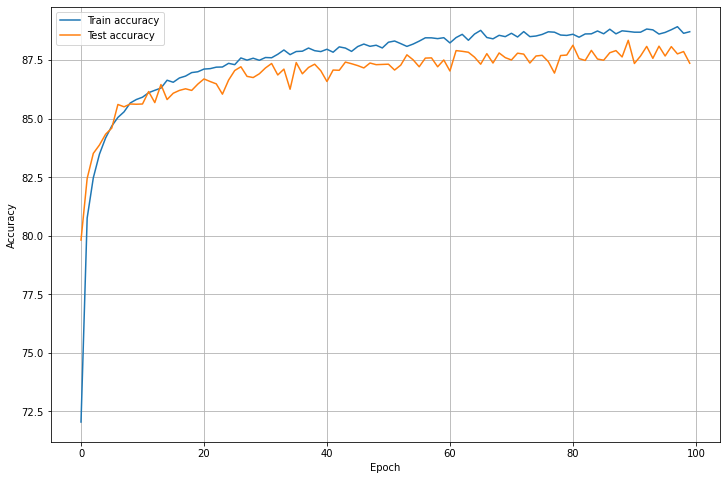

In [ ]:
# Plot Accuracies
plt.figure(figsize=(12,8))
plt.plot(train_accuracies, label='Train accuracy')
plt.plot(test_accuracies, label='Test accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

In [ ]:
torch.save(encoder.state_dict(), 'classifier_params.torch')

### Testing function

In [20]:
### Testing function
def test_epoch(net, device, dataloader, loss_fn):
    # Set evaluation mode
    net.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_in = []
        conc_out = []
        conc_label = []
        for image_batch, label_batch in tqdm(dataloader):
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Forward pass
            out = net(image_batch)
            # Append the network output and the original image to the lists
            conc_in.append(image_batch)
            conc_out.append(out)
            conc_label.append(label_batch)
        # Create a single tensor with all the values in the lists
        conc_in = torch.cat(conc_in)
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        test_loss = loss_fn(conc_out, conc_label)
    return conc_in, conc_out, conc_label, test_loss.data # We return all the outputs, all the labels and the global loss

### Bidimensional space visualization - feature space

Here we want to analyze the output of second last layer of the network. This is typically considered the *feature space*, since the last layer uses the information stored in these variables to perform the final classification.

A good feature space contains samples of different classes well spearated each other, and samples of the same class clustered together.

Since we cannot visualize such a high dimensional space, we need dimensionality reduction techniques to have an idea about this condition.

In [ ]:
print(encoder)

Encoder(
  (encoder_cnn): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (encoder_lin): Sequential(
    (0): Linear(in_features=288, out_features=128, bias=True)
    (1): Linear(in_features=128, out_features=268, bias=True)
    (2): ReLU()
    (3): Dropout(p=0.22224437026330193, inplace=False)
    (4): Linear(in_features=268, out_features=58, bias=True)
    (5): ReLU()
    (6): Dropout(p=0.17812185630889882, inplace=False)
    (7): Linear(in_features=58, out_features=10, bias=True)
  )
)


First, we need another forward hook to register the output of the second last layer.

In [ ]:
# Hook function to call during forward pass (extract second last layer features)
def hook_feature_space(module, input, output):
    feature_space.append(output) # feature_space must be a list defined before evaluating the network output

# Attach the hook function to layer fc1ReLU
hook_handle = encoder.encoder_lin[6].register_forward_hook(hook_feature_space)

Since we now have the hook registered, when we evaluate the test outputs the `feature_space` list will be updated with the feature space values corresponding to the test samples.

In [ ]:
feature_space = [] # This list will be filled by the feature space values

### Analyze all the test samples
test_inputs, test_outputs, test_labels, test_loss = test_epoch(
    net=encoder,
    device=device, 
    dataloader=test_dataloader, 
    loss_fn=loss_fn)

# Concatenate all the features in a single tensor
feature_space = torch.cat(feature_space)

100%|██████████| 40/40 [00:01<00:00, 29.59it/s]


Let's verify if the list has been populated.

In [ ]:
print(feature_space.shape)

torch.Size([10000, 78])


Since the following analyses won't use PyTorch, let's move everything back to CPU.

In [ ]:
feature_space = feature_space.cpu()
test_labels   = test_labels.cpu()
test_outputs  = test_outputs.cpu()

### t-distributed Stochastic Neighbor Embedding

t-SNE [[ref]](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) is a tool to visualize high-dimensional data. It converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data. t-SNE has a cost function that is not convex, i.e. with different initializations we can get different results.

In [ ]:
### t-SNE embedding of the dataset (t-distributed Stochastic Neighbor Embedding)
print("Computing t-SNE embedding")
tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)
feature_space_tsne = tsne.fit_transform(feature_space)

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



Computing t-SNE embedding


/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



In [ ]:
print(f"FEATURE SPACE SHAPE: {feature_space.shape}")
print(f"FEATURE SPACE SHAPE (TSNE): {feature_space_tsne.shape}")

FEATURE SPACE SHAPE: torch.Size([10000, 78])
FEATURE SPACE SHAPE (TSNE): (10000, 2)


Let's prepare a pandas dataframe just for plotting (no need to analyze this code)

In [ ]:
# Prepare dataframe for plotting (no need to analyze this code)
df = pd.DataFrame(feature_space_tsne)
df['label'] = test_labels
df['label_name'] = df.label.apply(lambda l: id_to_label[l])
df

,0,1,label,label_name
0,61.309406,8.215789,9,Ankle boot
1,-59.267666,-50.022583,2,Pullover
2,-24.044519,78.724350,1,Trouser
3,-9.907495,73.828560,1,Trouser
4,-50.201126,-12.279410,6,Shirt
...,...,...,...,...
9995,83.550301,0.897267,9,Ankle boot
9996,-27.634846,48.351646,1,Trouser
9997,15.256185,8.583176,8,Bag
9998,-20.861588,50.541660,1,Trouser


In [ ]:
import plotly.express as px
### Plot
px.scatter(df, x=0, y=1, color='label_name', hover_data=[df.index])

### Comparison with the Convolutional Classifier of HW1

In [ ]:
train_acc1 = torch.load('train_acc_HW1.torch')
test_acc1 = torch.load('test_acc_HW1.torch')

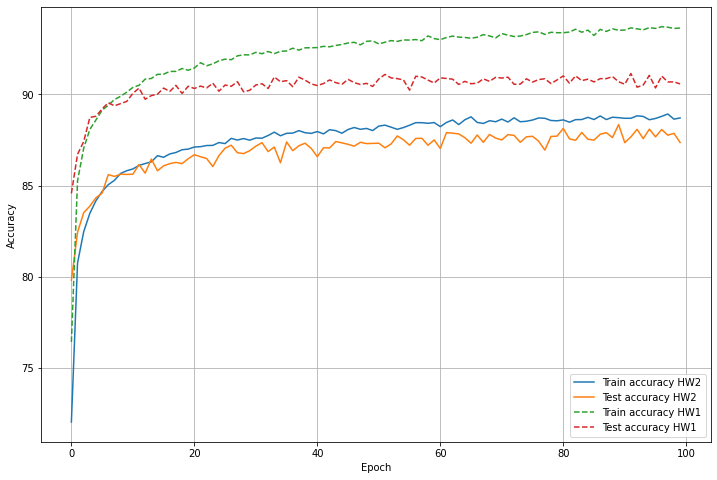

In [ ]:
# Plot losses
plt.figure(figsize=(12,8))
plt.plot(train_accuracies, label='Train accuracy HW2')
plt.plot(test_accuracies, label='Test accuracy HW2')
plt.plot(train_acc1, label='Train accuracy HW1', linestyle='--')
plt.plot(test_acc1, label='Test accuracy HW1', linestyle='--')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

# VAE

In [ ]:
import torch
from torch import nn
from torch.nn import functional as F

class VanillaVAE(nn.Module):


    def __init__(self, encoded_space_dim):
        super().__init__()

        ### Convolutional section
        self.encoder = nn.Sequential(
            # First convolutional layer
            nn.Conv2d(in_channels=1, out_channels=8, kernel_size=3, 
                      stride=2, padding=1),
            nn.ReLU(True),
            # Second convolutional layer
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3, 
                      stride=2, padding=1),
            nn.ReLU(True),
            # Third convolutional layer
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, 
                      stride=2, padding=0),
            nn.ReLU(True)
        )

        self.fc_mu = nn.Linear(32*3*3, encoded_space_dim)
        self.fc_var = nn.Linear(32*3*3, encoded_space_dim)


        # Build Decoder
        self.decoder_input = nn.Sequential(nn.Linear(in_features=encoded_space_dim, out_features=32*3*3))
        self.decoder = nn.Sequential(
            # First transposed convolution
            nn.ConvTranspose2d(in_channels=32, out_channels=16, kernel_size=3, 
                               stride=2, output_padding=0),
            nn.ReLU(True),
            # Second transposed convolution
            nn.ConvTranspose2d(in_channels=16, out_channels=8, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.ReLU(True),
            # Third transposed convolution
            nn.ConvTranspose2d(in_channels=8, out_channels=1, kernel_size=3, 
                               stride=2, padding=1, output_padding=1),
            nn.Sigmoid() # The input images is scaled between -1 and 1, hence the output has to be bounded as well
        )

    def encode(self, input) :
        """
        Encodes the input by passing through the encoder network
        and returns the latent codes.
        :param input: (Tensor) Input tensor to encoder [N x C x H x W]
        :return: (Tensor) List of latent codes
        """
        result = self.encoder(input)
        result = torch.flatten(result, start_dim=1)

        # Split the result into mu and var components
        # of the latent Gaussian distribution
        mu = self.fc_mu(result)
        log_var = self.fc_var(result)

        return [mu, log_var]

    def decode(self, z) :
        """
        Maps the given latent codes
        onto the image space.
        :param z: (Tensor) [B x D]
        :return: (Tensor) [B x C x H x W]
        """
        result = self.decoder_input(z)
        result = result.view(-1, 32, 3, 3)
        result = self.decoder(result)
        #result = self.final_layer(result)
        return result

    def reparameterize(self, mu, logvar) :
        """
        Reparameterization trick to sample from N(mu, var) from
        N(0,1).
        :param mu: (Tensor) Mean of the latent Gaussian [B x D]
        :param logvar: (Tensor) Standard deviation of the latent Gaussian [B x D]
        :return: (Tensor) [B x D]
        """
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return eps * std + mu

    def forward(self, input) :
        mu, log_var = self.encode(input)
        z = self.reparameterize(mu, log_var)
        return  [self.decode(z), input, mu, log_var]

    def loss_function(self,
                      *args,
                      **kwargs) -> dict:
        """
        Computes the VAE loss function.
        KL(N(\mu, \sigma), N(0, 1)) = \log \frac{1}{\sigma} + \frac{\sigma^2 + \mu^2}{2} - \frac{1}{2}
        :param args:
        :param kwargs:
        :return:
        """
        recons = args[0]
        input = args[1]
        mu = args[2]
        log_var = args[3]

        kld_weight = kwargs['M_N'] # Account for the minibatch samples from the dataset
        recons_loss =F.mse_loss(recons, input)


        kld_loss = torch.mean(-0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)

        loss = recons_loss + kld_weight * kld_loss
        return {'loss': loss, 'Reconstruction_Loss':recons_loss.detach(), 'KLD':-kld_loss.detach()}

    def sample(self,
               num_samples:int,
               latent_dim:int,
               current_device, **kwargs) :
        """
        Samples from the latent space and return the corresponding
        image space map.
        :param num_samples: (Int) Number of samples
        :param current_device: (Int) Device to run the model
        :return: (Tensor)
        """
        z = torch.randn(num_samples,
                        latent_dim)

        z = z.to(current_device)

        samples = self.decode(z)
        return samples

    def generate(self, x, **kwargs):
        """
        Given an input image x, returns the reconstructed image
        :param x: (Tensor) [B x C x H x W]
        :return: (Tensor) [B x C x H x W]
        """

        return self.forward(x)[0]

### Training & Testing Functions

In [ ]:
### Training function
def train_epoch(net, device, train_dataloader, optimizer):

    net.train()
    train_loss_batches = []
    for sample_batched in train_dataloader:     # Iterate the dataloader
      # Move data to device (ex. on the GPU)
        image_batch = sample_batched[0].to(device)    
        label_batch = sample_batched[1].to(device)
      # Encode data
        out = net(image_batch)
      # Save train loss for this batch
        recons = out[0]
        input = out[1]
        mu = out[2]
        log_var = out[3]

        kld_weight = image_batch.shape[0]/60000 # Account for the minibatch samples from the dataset
        recons_loss =F.mse_loss(recons, image_batch)

        kld_loss = torch.mean(-0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)

        loss = recons_loss + kld_weight * kld_loss
        #print(f'Reconstruction Loss:{recons_loss}, kld_loss:{kld_loss}, kld_weight:{kld_weight}, loss:{loss}')
        #loss = recons_loss - kld_loss

      # Backpropagation
        optimizer.zero_grad()
        loss.backward()
      # Update the weights
        optimizer.step()
        loss_batch = loss.detach().cpu().numpy()  #detach-->export to the cpu --> export in numpy
        train_loss_batches.append(loss_batch)

    print(f'Average train loss: {np.mean(train_loss_batches)}')

    return np.mean(train_loss_batches)

In [ ]:
### Validation-Testing function
def val_epoch(net, device, val_dataloader):

    net.eval()
    test_loss_batches = []
    with torch.no_grad(): # Disable gradient tracking since we don't want to update the net during Testing
        for sample_batched in val_dataloader:
          # Move data to device
            image_batch = sample_batched[0].to(device)
            label_batch = sample_batched[1].to(device)
          # Encode data
            out = net(image_batch)
          # Save train loss for this batch
            recons = out[0]
            input = out[1]
            mu = out[2]
            log_var = out[3]

            kld_weight = image_batch.shape[0]/60000 # Account for the minibatch samples from the dataset
            recons_loss =F.mse_loss(recons, image_batch)


            kld_loss = torch.mean(-0.5 * torch.sum(1 + log_var - mu ** 2 - log_var.exp(), dim = 1), dim = 0)

            loss = recons_loss + kld_weight * kld_loss
            #loss = recons_loss - kld_loss
            loss_batch = loss.detach().cpu().numpy()  #detach-->export to the cpu --> export in numpy
            test_loss_batches.append(loss_batch)

        print(f'Average test loss: {np.mean(test_loss_batches)}')

        return np.mean(test_loss_batches)

### Training

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
VAE = VanillaVAE(encoded_space_dim = 2).to(device)
print(VAE)

lr = 1e-3 # Learning rate
optim = torch.optim.Adam(VAE.parameters(), lr=lr)

VanillaVAE(
  (encoder): Sequential(
    (0): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (5): ReLU(inplace=True)
  )
  (fc_mu): Linear(in_features=288, out_features=2, bias=True)
  (fc_var): Linear(in_features=288, out_features=2, bias=True)
  (decoder_input): Sequential(
    (0): Linear(in_features=2, out_features=288, bias=True)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): ReLU(inplace=True)
    (2): ConvTranspose2d(16, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): ConvTranspose2d(8, 1, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), output_padding=(1, 1))
    (5): Sigmoid()
  )
)


In [ ]:
num_epochs = 100     #1epoch=1iter over your data
train_loss, test_loss = [], []
for epoch_num in range(num_epochs):

    print(f'# EPOCH {epoch_num}')
    loss = train_epoch(VAE, device, train_dataloader, optim)
    train_loss.append(loss)

    loss = val_epoch(VAE, device, test_dataloader)
    test_loss.append(loss)

# EPOCH 0
Average train loss: 0.8776655197143555
Average test loss: 0.710006058216095
# EPOCH 1
Average train loss: 0.6720135807991028
Average test loss: 0.6475521326065063
# EPOCH 2
Average train loss: 0.6412082314491272
Average test loss: 0.6344730257987976
# EPOCH 3
Average train loss: 0.6308662295341492
Average test loss: 0.6257954835891724
# EPOCH 4
Average train loss: 0.6235616207122803
Average test loss: 0.6197574138641357
# EPOCH 5
Average train loss: 0.6181996464729309
Average test loss: 0.6158474683761597
# EPOCH 6
Average train loss: 0.6145825982093811
Average test loss: 0.6119551658630371
# EPOCH 7
Average train loss: 0.6115859150886536
Average test loss: 0.6088154911994934
# EPOCH 8
Average train loss: 0.6090340614318848
Average test loss: 0.6069069504737854
# EPOCH 9
Average train loss: 0.6065207719802856
Average test loss: 0.605487585067749
# EPOCH 10
Average train loss: 0.6051133275032043
Average test loss: 0.6034758687019348
# EPOCH 11
Average train loss: 0.60368293523

In [ ]:
torch.save(train_loss,'train_loss2')
torch.save(test_loss,'test_loss2')

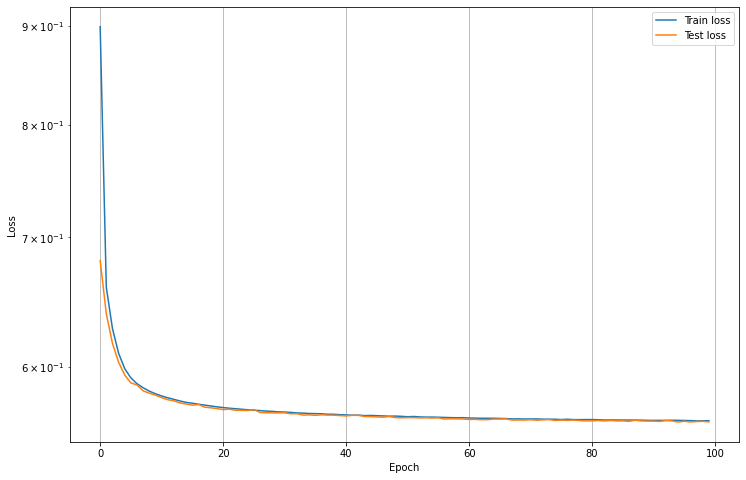

In [ ]:
# Plot losses
plt.figure(figsize=(12,8))
plt.semilogy(train_loss, label='Train loss')
plt.semilogy(test_loss, label='Test loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid()
plt.legend()
plt.show()

In [ ]:
# Save network parameters
torch.save(VAE.state_dict(), 'VAE_64.pth')

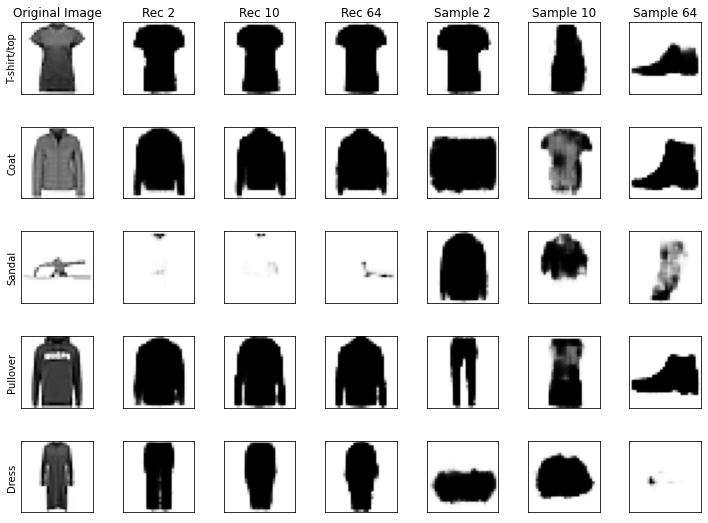

In [ ]:
fig, axs = plt.subplots(5, 7, figsize=(10,8))

for i in range(5):
  # random.choice allows to randomly sample from a list-like object (basically anything that can be accessed with an index, like our dataset)
  index = random.randint(0,256-1)
  img, label = test_dataset[index]
  img = img.unsqueeze(0).to(device)
  latent_dim = [2, 10, 64]
  for j in range(3):
    VAE = VanillaVAE(encoded_space_dim = latent_dim[j]).to(device)
    VAE.load_state_dict(torch.load('VAE_{}.pth'.format(latent_dim[j])))
    recons = VAE.generate(img)
    recons = recons.cpu().squeeze()
    recons = recons.detach()
    axs[i,j+1].imshow(recons, cmap='Greys')
    axs[0,j+1].set_title('Rec {}'.format(latent_dim[j]))
    axs[i,j+1].set_xticks([])
    axs[i,j+1].set_yticks([])

    sample = VAE.sample(256, latent_dim = latent_dim[j], current_device=device).cpu().squeeze()
    sample = sample[index].cpu().squeeze()
    sample = sample.detach()
    axs[i,4+j].imshow(sample, cmap='Greys')
    axs[0,4+j].set_title('Sample {}'.format(latent_dim[j]))
    axs[i,4+j].set_xticks([])
    axs[i,4+j].set_yticks([])

  img = img.cpu().squeeze()
  axs[i,0].imshow(img, cmap='Greys')
  axs[0,0].set_title(f'Original Image')
  axs[i,0].set_xticks([])
  axs[i,0].set_yticks([])
  axs[i,0].set_ylabel(f'{id_to_label[label]}')
  plt.tight_layout()

### Latent space visualization - z vector

In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    VAE.eval()
    with torch.no_grad():
        [mu, log_var] = VAE.encode(img)
        encoded_img = VAE.reparameterize(mu, log_var)
        encoded_img = encoded_img.cpu().numpy()
    # Append to list
    encoded_img = encoded_img.flatten()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

100%|██████████| 10000/10000 [00:13<00:00, 731.15it/s]


In [ ]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,Enc. Variable 8,Enc. Variable 9,Enc. Variable 10,Enc. Variable 11,Enc. Variable 12,Enc. Variable 13,Enc. Variable 14,Enc. Variable 15,Enc. Variable 16,Enc. Variable 17,Enc. Variable 18,Enc. Variable 19,Enc. Variable 20,Enc. Variable 21,Enc. Variable 22,Enc. Variable 23,Enc. Variable 24,Enc. Variable 25,Enc. Variable 26,Enc. Variable 27,Enc. Variable 28,Enc. Variable 29,Enc. Variable 30,Enc. Variable 31,Enc. Variable 32,Enc. Variable 33,Enc. Variable 34,Enc. Variable 35,Enc. Variable 36,Enc. Variable 37,Enc. Variable 38,Enc. Variable 39,Enc. Variable 40,Enc. Variable 41,Enc. Variable 42,Enc. Variable 43,Enc. Variable 44,Enc. Variable 45,Enc. Variable 46,Enc. Variable 47,Enc. Variable 48,Enc. Variable 49,Enc. Variable 50,Enc. Variable 51,Enc. Variable 52,Enc. Variable 53,Enc. Variable 54,Enc. Variable 55,Enc. Variable 56,Enc. Variable 57,Enc. Variable 58,Enc. Variable 59,Enc. Variable 60,Enc. Variable 61,Enc. Variable 62,Enc. Variable 63,label
0,-0.896810,-0.404281,-2.641410,0.095092,0.136194,0.018787,-0.598061,-0.357491,-1.090786,-1.503530,-1.674618,2.295132,0.266131,-0.206227,1.300374,0.879280,-0.119474,0.240474,1.440457,1.011581,-0.524912,-1.462469,-0.712928,-1.357216,0.086150,-0.056787,1.856045,0.667733,-0.091583,-0.872670,1.355208,-0.290103,-0.593770,-0.311216,-0.931798,-0.834494,0.806632,-0.308960,0.515675,1.545396,-0.022332,0.456056,1.578106,0.686094,-0.221859,1.085063,-1.465292,-0.790110,-0.173336,0.414172,0.397612,-0.076854,0.249857,-1.119574,0.078839,-0.510598,-0.519470,-0.351898,-0.536255,0.909865,0.266362,0.110781,0.464368,-1.054158,9
1,0.173020,-0.585690,0.933731,-0.694902,0.193417,-0.351846,0.113009,-0.931861,0.768505,-0.335607,-1.013004,-0.369255,0.484796,0.407261,-0.707493,-1.345949,-0.322315,0.951882,-0.822332,1.650183,0.413030,-0.489435,0.208664,-0.127022,-0.245266,-0.738003,1.035110,-0.565034,0.700957,0.551948,1.830670,0.335702,-0.298626,-0.562729,3.017288,-0.063484,-0.841847,0.619901,1.910568,1.866938,-0.514026,-0.120743,0.066828,-0.313594,2.246605,0.075883,-0.023258,0.384091,-1.530323,-0.905721,2.014657,0.273741,-1.147839,2.565512,1.020966,-1.253364,-0.857078,-0.202511,1.116758,-0.218741,-0.809548,0.721892,0.537689,0.387076,2
2,2.579743,-0.713057,-0.531954,0.101568,1.186593,0.583890,0.914227,0.818703,-0.694235,1.636077,1.073190,0.120150,-0.384639,-0.080100,2.050522,0.063575,-0.261391,-1.702044,-0.993795,0.783966,0.877780,-0.021218,-1.468214,1.085528,1.332847,-1.258717,0.953928,-0.642211,0.887037,-0.606538,-0.628322,2.076595,1.410876,-0.264347,-0.191999,1.998385,-0.802611,0.361199,-0.472686,-0.055304,-0.367475,1.255664,0.989656,0.310518,1.604619,-0.210471,0.764761,-0.067516,-0.401297,1.272415,1.058149,-0.509877,-0.824394,1.615345,0.716327,0.146275,1.224795,-0.627297,1.115469,-0.994183,1.289666,1.674894,0.181430,1.108396,1
3,0.363112,-1.361322,-0.792981,0.265487,-0.807183,-0.130023,-0.462114,0.439900,-0.154553,2.078234,-1.157061,0.653469,-0.421148,0.846005,-0.836778,0.891403,0.882061,-0.103156,-0.572327,-1.097037,1.081371,0.296258,0.920206,-0.282306,-2.483956,0.632093,-2.314727,0.925183,1.096096,0.542439,-0.457727,1.622683,0.525102,0.536635,2.135446,-1.295076,-0.086799,-1.121282,-0.529493,-0.243065,-0.152686,0.808748,-0.818398,-1.383783,-1.370019,0.129145,-1.462365,-1.370865,0.976776,1.265260,0.737344,0.869899,2.472542,-3.819339,0.321538,-0.148590,-0.579419,-1.537384,-0.307412,3.373617,0.184414,0.901611,-0.909689,1.196809,1
4,-0.332511,0.667906,0.535168,-0.284290,1.000625,-2.362983,0.284148,0.642019,-0.169229,0.180684,0.364985,-0.233304,-1.612936,0.180952,1.532779,-0.371720,0.295699,-0.098383,0.186890,1.035719,2.781345,-1.723957,-1.487747,-0.980563,0.613322,-0.177909,-0.847315,0.499868,-0.165014,0.334488,0.204108,-0.144457,0.853716,-0.137153,-0.696870,0.026753,-0.020284,-0.474500,0.245513,0.544294,-0.661151,0.344180,1.344682,-1.235734,0.188296,1.632614,-0.771682,1.392321,0.213118,1.3

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples)
print(f"LATENT SPACE SHAPE: {encoded_samples.shape}")
print(f"LATENT SPACE SHAPE (TSNE): {encoded_samples_reduced_TSNE.shape}")
#plt.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1], c=encoded_samples.label.to_numpy())

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


LATENT SPACE SHAPE: (10000, 65)
LATENT SPACE SHAPE (TSNE): (10000, 2)


In [ ]:
# Prepare dataframe for plotting (no need to analyze this code)
df = pd.DataFrame(encoded_samples_reduced_TSNE)
df['label'] = [test_dataset[i][1] for i in range(len(test_dataset))]
df['label_name'] = df.label.apply(lambda l: id_to_label[l])
df

,0,1,label,label_name
0,-35.475945,7.515637,9,Ankle boot
1,18.151012,5.383801,2,Pullover
2,45.184830,14.802265,1,Trouser
3,38.504715,-9.467629,1,Trouser
4,-11.696922,-14.770936,6,Shirt
...,...,...,...,...
9995,-29.822590,11.164638,9,Ankle boot
9996,31.840317,29.623909,1,Trouser
9997,-47.727551,-12.718760,8,Bag
9998,32.963024,7.897250,1,Trouser


In [ ]:
import plotly.express as px
### Plot
px.scatter(df, x=0, y=1, color='label_name', hover_data=[df.index])

### Latent space visualization - mean vector

In [ ]:
VAE.load_state_dict(torch.load('VAE_64.pth'))

<All keys matched successfully>

In [ ]:
### Get the encoded representation of the test samples
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    # Encode image
    VAE.eval()
    with torch.no_grad():
        encoded_img  = VAE.encode(img)
        encoded_img = encoded_img[0].cpu().numpy()
    # Append to list
    encoded_img = encoded_img.flatten()
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)

100%|██████████| 10000/10000 [00:06<00:00, 1436.40it/s]


In [ ]:
# Convert to a dataframe
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples

,Enc. Variable 0,Enc. Variable 1,Enc. Variable 2,Enc. Variable 3,Enc. Variable 4,Enc. Variable 5,Enc. Variable 6,Enc. Variable 7,Enc. Variable 8,Enc. Variable 9,Enc. Variable 10,Enc. Variable 11,Enc. Variable 12,Enc. Variable 13,Enc. Variable 14,Enc. Variable 15,Enc. Variable 16,Enc. Variable 17,Enc. Variable 18,Enc. Variable 19,Enc. Variable 20,Enc. Variable 21,Enc. Variable 22,Enc. Variable 23,Enc. Variable 24,Enc. Variable 25,Enc. Variable 26,Enc. Variable 27,Enc. Variable 28,Enc. Variable 29,Enc. Variable 30,Enc. Variable 31,Enc. Variable 32,Enc. Variable 33,Enc. Variable 34,Enc. Variable 35,Enc. Variable 36,Enc. Variable 37,Enc. Variable 38,Enc. Variable 39,Enc. Variable 40,Enc. Variable 41,Enc. Variable 42,Enc. Variable 43,Enc. Variable 44,Enc. Variable 45,Enc. Variable 46,Enc. Variable 47,Enc. Variable 48,Enc. Variable 49,Enc. Variable 50,Enc. Variable 51,Enc. Variable 52,Enc. Variable 53,Enc. Variable 54,Enc. Variable 55,Enc. Variable 56,Enc. Variable 57,Enc. Variable 58,Enc. Variable 59,Enc. Variable 60,Enc. Variable 61,Enc. Variable 62,Enc. Variable 63,label
0,0.018084,0.014738,-0.004204,-0.051805,0.245737,0.312728,0.023738,-0.032778,-0.020308,-1.434151,-0.007838,0.029684,-0.045156,-0.022134,0.014317,0.772284,0.007602,-0.496097,0.030974,-0.039983,-0.030845,-0.033164,0.015276,-0.045902,0.016800,-0.049508,-0.050819,-0.020490,-0.013984,-0.030394,0.002016,-0.004796,-0.000689,0.018168,-0.023099,-0.026721,0.937802,-0.294482,-0.029550,0.036077,-0.036340,0.002185,-0.048661,-0.018069,-0.040834,0.048787,0.002853,-0.042251,0.007973,0.032863,0.006451,0.005813,-0.572425,-0.009086,-0.033174,-0.767156,0.027159,-0.031213,0.010556,0.003937,-0.017204,-0.008624,-0.009234,0.027189,9
1,-0.004337,-0.041470,0.019418,0.033650,-0.491067,-0.629667,-0.015867,-0.003818,-0.038707,-0.396557,0.007112,-0.005027,-0.023341,-0.007872,-0.023143,-1.335879,-0.008815,-0.074607,0.017885,0.023799,0.015035,0.031929,0.007027,0.007862,0.028123,0.032811,0.025583,-0.034766,0.000825,0.014795,-0.012147,0.044505,-0.049760,-0.005402,-0.018650,0.002949,-0.778164,0.641590,-0.034152,0.012747,0.014504,0.009207,0.005915,-0.024338,-0.016899,-0.031743,-0.013353,-0.022866,0.008773,-0.007618,-0.000200,0.028224,-0.113394,-0.006279,-0.017203,-0.728363,0.012072,0.000070,-0.054214,-0.041997,-0.053212,0.017549,0.030621,0.015076,2
2,0.043270,-0.008613,-0.042223,-0.023456,1.105556,0.834827,0.024937,0.016389,-0.021356,1.612281,0.039376,0.027914,-0.009368,0.010487,-0.022132,0.237570,0.010106,-1.787626,0.044915,0.014529,0.001935,-0.066083,0.015525,-0.046068,0.018517,-0.019221,0.009555,0.013412,-0.017961,0.024154,0.027548,0.004406,-0.007676,0.045713,0.012814,-0.039534,-0.787143,0.564482,0.061896,0.075684,-0.077161,0.040853,-0.060949,-0.044120,-0.029729,0.024147,-0.023007,0.012057,-0.013036,0.012914,0.025374,-0.015020,0.252374,0.048076,0.008893,-0.306294,-0.053815,0.020468,0.002806,0.018283,0.012803,0.067551,0.048334,0.047781,1
3,0.012699,0.036858,0.035136,-0.042731,-0.099739,-0.630376,-0.022489,0.030196,-0.024679,2.145469,0.013608,0.017493,-0.039129,0.046288,-0.029740,0.815071,-0.020069,-0.510991,0.021578,-0.006959,-0.001583,-0.022415,-0.027528,-0.047443,0.036828,0.016144,-0.030022,-0.033671,-0.005021,0.020390,0.016673,0.062590,0.039562,0.049229,0.015235,-0.042953,-0.142083,-0.194654,0.045156,0.020964,0.010258,0.005911,0.002341,-0.048932,0.031821,0.010680,0.011091,-0.058228,-0.020018,0.014524,-0.015523,0.009676,0.624198,0.012153,-0.032692,-0.253121,-0.036068,0.016606,0.026566,0.030388,0.012520,0.008295,0.001182,0.024426,1
4,0.008488,0.047286,-0.035123,0.001102,0.976059,-1.989908,0.006107,-0.000583,-0.002478,0.019997,0.013783,0.034777,-0.014648,-0.008307,-0.016760,-0.498735,0.043830,-1.114659,-0.006214,0.019964,-0.004122,-0.039985,0.033811,-0.054676,-0.018210,-0.000342,-0.011106,0.028936,0.007079,-0.007369,0.027015,0.000076,0.018278,0.034989,0.023501,0.000864,0.126797,0.362471,-0.001646,-0.003883,0.003666,0.000366,-0.034309,0.002750,0.013914,0.027140,0.005718,0.021017,-0.019812,0.026757

In [ ]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
encoded_samples_reduced_TSNE = tsne.fit_transform(encoded_samples)
print(f"LATENT SPACE SHAPE: {encoded_samples.shape}")
print(f"LATENT SPACE SHAPE (TSNE): {encoded_samples_reduced_TSNE.shape}")
#plt.scatter(encoded_samples_reduced_TSNE[:,0], encoded_samples_reduced_TSNE[:,1], c=encoded_samples.label.to_numpy())

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


LATENT SPACE SHAPE: (10000, 65)
LATENT SPACE SHAPE (TSNE): (10000, 2)


In [ ]:
# Prepare dataframe for plotting (no need to analyze this code)
df = pd.DataFrame(encoded_samples_reduced_TSNE)
df['label'] = [test_dataset[i][1] for i in range(len(test_dataset))]
df['label_name'] = df.label.apply(lambda l: id_to_label[l])
df

,0,1,label,label_name
0,-32.291012,54.082874,9,Ankle boot
1,-27.301662,7.069714,2,Pullover
2,-23.712744,-28.810966,1,Trouser
3,-38.824436,-33.928200,1,Trouser
4,69.005394,-17.924061,6,Shirt
...,...,...,...,...
9995,-43.984165,41.885239,9,Ankle boot
9996,-52.658817,-30.842995,1,Trouser
9997,3.024278,84.895744,8,Bag
9998,-37.386326,-52.462173,1,Trouser


In [ ]:
import plotly.express as px
### Plot
px.scatter(df, x=0, y=1, color='label_name', hover_data=[df.index])

## Classification from this mean vector latent space

In [ ]:
class VAE_Classifier(nn.Module):
    
    def __init__(self):   
        super().__init__()                        # super() calls the parent class nn.Module

        self.ffnn = nn.Sequential(nn.Linear(in_features=64, out_features=192),
                                  nn.ReLU(),
                                  nn.Linear(in_features=192, out_features=128),
                                  nn.ReLU(),
                                  nn.Linear(in_features=128, out_features=10)
                                  )
   
    def forward(self, x, additional_out=False):  # Forward pass of the network, from the input x to the output. 
             
        x = self.ffnn(x)
        return x

In [ ]:
for param_name, param in VAE.named_parameters():
    print(param_name)
    print('\tFreezing update')
    param.requires_grad = False  

encoder.0.weight
	Freezing update
encoder.0.bias
	Freezing update
encoder.2.weight
	Freezing update
encoder.2.bias
	Freezing update
encoder.4.weight
	Freezing update
encoder.4.bias
	Freezing update
fc_mu.weight
	Freezing update
fc_mu.bias
	Freezing update
fc_var.weight
	Freezing update
fc_var.bias
	Freezing update
decoder_input.0.weight
	Freezing update
decoder_input.0.bias
	Freezing update
decoder.0.weight
	Freezing update
decoder.0.bias
	Freezing update
decoder.2.weight
	Freezing update
decoder.2.bias
	Freezing update
decoder.4.weight
	Freezing update
decoder.4.bias
	Freezing update


In [ ]:
torch.manual_seed(0)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
VAE_classifier = VAE_Classifier().to(device)

lr = 1e-3 # Learning rate
weight_decay = 5e-4
optim = torch.optim.Adam(VAE_classifier.parameters(), lr=lr, weight_decay=weight_decay)

In [ ]:
### Training function
def train_epoch(VAE, net, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    net.train()
    correct = 0
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, label_batch in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)

        # Encode data
        encoded_data = VAE.encode(image_batch)[0]
        out = net(encoded_data)
        loss = loss_fn(out, label_batch)
        pred = out.max(1, keepdim=True)[1] # get the index of the max logit
        correct += pred.eq(label_batch.view_as(pred)).sum().item()
          
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    tot_images = len(train_dataset)
    accuracy = 100. * correct / tot_images
    print(f'Accuracy: {correct}/{tot_images}: {accuracy}%')
    return accuracy

In [ ]:
### Testing function
def test_epoch(VAE, net, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    net.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        correct = 0
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode data
            encoded_data = VAE.encode(image_batch)[0]
            out = net(encoded_data)

            pred = out.max(1, keepdim=True)[1] # get the index of the max logit
            correct += pred.eq(label_batch.view_as(pred)).sum().item()

    tot_images = len(test_dataset)
    accuracy = 100. * correct / tot_images
    print(f'Accuracy: {correct}/{tot_images}: {accuracy}%')
    return accuracy

In [ ]:
loss_fn =  nn.CrossEntropyLoss()  
num_epochs = 100     #1epoch=1iter over your data
train_accuracies, test_accuracies = [], []
for epoch_num in range(num_epochs):
  print('EPOCH %d/%d' % (epoch_num + 1, num_epochs))
  ### Training (use the training function)
  train_accuracy = train_epoch(
      VAE, 
      VAE_classifier, 
      device=device, 
      dataloader=train_dataloader, 
      loss_fn=loss_fn, 
      optimizer=optim)
  ### Validation  (use the testing function)
  test_accuracy = test_epoch(
      VAE, 
      VAE_classifier, 
      device=device, 
      dataloader=test_dataloader, 
      loss_fn=loss_fn)

  # Print Validationloss
  train_accuracies.append(train_accuracy)
  test_accuracies.append(test_accuracy)


EPOCH 1/100
Accuracy: 27455/60000: 45.75833333333333%
Accuracy: 6170/10000: 61.7%
EPOCH 2/100
Accuracy: 39239/60000: 65.39833333333333%
Accuracy: 6825/10000: 68.25%
EPOCH 3/100
Accuracy: 41500/60000: 69.16666666666667%
Accuracy: 7013/10000: 70.13%
EPOCH 4/100
Accuracy: 42161/60000: 70.26833333333333%
Accuracy: 7062/10000: 70.62%
EPOCH 5/100
Accuracy: 42682/60000: 71.13666666666667%
Accuracy: 7134/10000: 71.34%
EPOCH 6/100
Accuracy: 43191/60000: 71.985%
Accuracy: 7213/10000: 72.13%
EPOCH 7/100
Accuracy: 43532/60000: 72.55333333333333%
Accuracy: 7249/10000: 72.49%
EPOCH 8/100
Accuracy: 43747/60000: 72.91166666666666%
Accuracy: 7287/10000: 72.87%
EPOCH 9/100
Accuracy: 44009/60000: 73.34833333333333%
Accuracy: 7322/10000: 73.22%
EPOCH 10/100
Accuracy: 44232/60000: 73.72%
Accuracy: 7354/10000: 73.54%
EPOCH 11/100
Accuracy: 44487/60000: 74.145%
Accuracy: 7380/10000: 73.8%
EPOCH 12/100
Accuracy: 44580/60000: 74.3%
Accuracy: 7409/10000: 74.09%
EPOCH 13/100
Accuracy: 44747/60000: 74.57833333333

In [ ]:
train_acc_VAE = torch.save(train_accuracies,'train_acc_VAE.2')
test_acc_VAE = torch.save(test_accuracies,'test_acc_VAE.2')

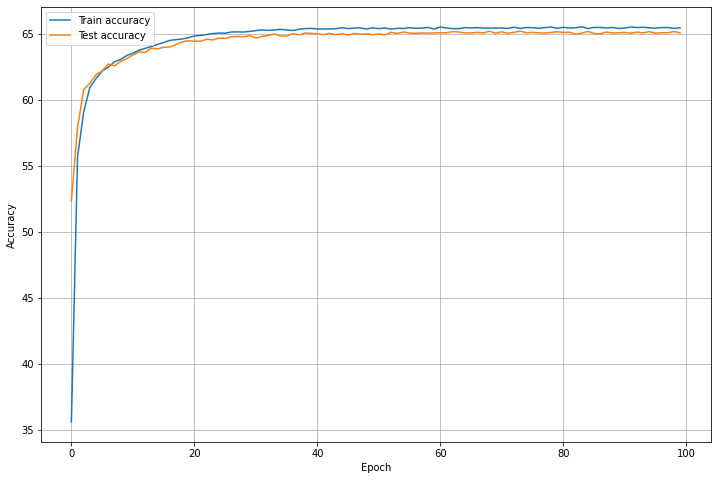

In [ ]:
# Plot Accuracies
plt.figure(figsize=(12,8))
plt.plot(train_accuracies, label='Train accuracy')
plt.plot(test_accuracies, label='Test accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

### Comparison with the Convolutional Classifier of HW1 and with the AE Classifier

In [ ]:
train_acc1 = torch.load('train_acc_HW1.torch')
test_acc1 = torch.load('test_acc_HW1.torch')
train_accAE = torch.load('train_acc_AE')
test_accAE = torch.load('test_acc_AE')
train_accVAE = torch.load('train_acc_VAE.2')
test_accVAE = torch.load('test_acc_VAE.2')

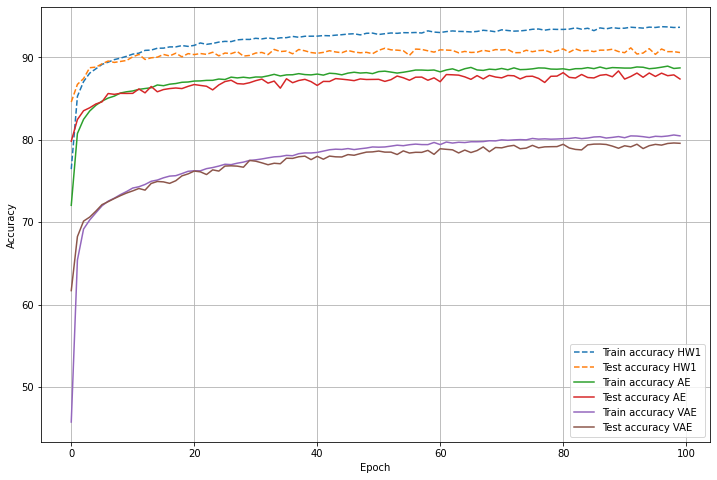

In [ ]:
# Plot losses
plt.figure(figsize=(12,8))
plt.plot(train_acc1, label='Train accuracy HW1', linestyle='--')
plt.plot(test_acc1, label='Test accuracy HW1', linestyle='--')
plt.plot(train_accAE, label='Train accuracy AE')
plt.plot(test_accAE, label='Test accuracy AE')
plt.plot(train_accVAE, label='Train accuracy VAE')
plt.plot(test_accVAE, label='Test accuracy VAE')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid()
plt.legend()
plt.show()

In [3]:
import nbformat
import os

# Path to your notebook
notebook_path = "/Users/lgreggio/Neural-network-and-deep-learning/UnsupervisedLearning/UnsupervisedLearning-Autoencoder.ipynb"

with open(notebook_path, "r", encoding="utf-8") as f:
    nb = nbformat.read(f, as_version=4)

if 'widgets' in nb.metadata:
    del nb.metadata['widgets']

for cell in nb.cells:
    if 'widgets' in cell.metadata:
        del cell.metadata['widgets']

with open(notebook_path, "w", encoding="utf-8") as f:
    nbformat.write(nb, f)

print(f"Notebook '{notebook_path}' cleaned for GitHub rendering!")

Notebook '/Users/lgreggio/Neural-network-and-deep-learning/UnsupervisedLearning/UnsupervisedLearning-Autoencoder.ipynb' cleaned for GitHub rendering!
